### Babaahmadi-narges-610398102-HW2

##### Importing needed libraries

In [1]:
import numpy as np
import pandas as pd
import more_itertools as mit
import numpy as np
import matplotlib.pyplot as plt

#### Two queens conflict with each other if | i - j | == | X[i] - X[j] |
Based on that, i define my fitness function

In [11]:
def fitness_func(chromosome):
    global n
    fitness = 0
    for i in range(n):

        for j in range(i+1,n):

            if ( abs(chromosome[i]-chromosome[j] ) == abs(i-j)):
                fitness+=1
    return fitness

#### Initializing the socity
My chromosomes are permutations of n digits.\
the indexes of the array are row numbers and the value in each index is the column number for each queen.

In [3]:
def make_society(population):
    global n
    society = []
    for i in range(population):
        society.append(mit.random_permutation(range(n)))
        
    fitness = []
    for chromosome in society:
        fitness.append(fitness_func(chromosome))
        
    df = pd.DataFrame({'society':society,'fitnesses':fitness})
#     print(df)
    return society, df

I used truncation method to choose parents.(just as I did in genetic algorithm exercise)

In [4]:
#choosing parents
def truncation(T,N):
    global df
    df2 = df.sort_values(by=['fitnesses'])
    T_num = int((T/100)*(len(df2)))
    df2 = df2.head(T_num)
    df2 = df2.sample(N)

    return df2

Both crossover and mutation functions are also the same as previous exercise.

In [5]:
#crossover
def order_recombination(chromosome1, chromosome2):
    global n
    point1 = np.random.randint(0,n-1)
    point2 = np.random.randint(point1,n-1)
    child = []
    for i in range(n):
        child.append(-1)
        
    for i in range(point1, point2+1):
        child[i] = chromosome1[i]
        
    counter = point2+1
    for i in range(point2+1, n):
        if (chromosome2[i] not in child):
            child[counter] = chromosome2[i]
            counter+=1
            
    for i in range(point2+1):
        if(chromosome2[i] not in child):
            if counter < n :
                child[counter] = chromosome2[i]
                counter+=1
            else:
                counter = 0
                child[counter] = chromosome2[i]
                counter+=1

    return child

In [6]:
#implementing mutation
#mirroring between indexes point1 and point2
def mutation(chromosome):
    global n
    point1 = np.random.randint(0,n-2)
    point2 = np.random.randint(point1+1,n-1)

    help1 = point2 - point1
    
    if ( help1 % 2 == 0 ):
        point2 +=1
        
    for i in range(point1, point2):
        help_int = chromosome[i]
        chromosome[i] = chromosome[point2]
        chromosome[point2] = help_int
        point2 -= 1 

    return chromosome

#### Neighbourhood function
As I used an MA to solve the problem, I would have to define a neighbourhood function, which generated the neighbours of input chromosome.\
The neighbourhood function below, generates a random number(call it m) and swaps m indexes starting from some random number(start_change) with m other indexes.

In [7]:
def neighbourhood(chromosome):
    global n
    change_len = np.random.randint(1, int(n/2))
    start_change = np.random.randint(0, n-(2*change_len))
#     print("change_len :", end=" ")
#     print(change_len)

#     print("start_change :", end=" ")
#     print(start_change)
    for i in range(start_change, start_change+change_len):
        help1 = chromosome[i] 
        chromosome[i] = chromosome[i+change_len]
        chromosome[i+change_len] = help1
#     print(chromosome)
    return chromosome

#### local search 
Here i generate neighbour_num neighbours for chromosome1 using neighbourhood function, and return the neighbour with the best fitness.

In [8]:
def local_search(chromosome1, neighbour_num):
    neighbours_arr = []
    fitnesses = []
    neighbour = []
    j = neighbour_num
    while (j > 0):
        
        neighbour = neighbourhood(chromosome1)

        if(neighbour not in neighbours_arr):
            j-=1
            neighbours_arr.append( neighbour[:] )
            fitnesses.append( fitness_func(neighbour) )
        
    best_fitness = fitnesses[0]
    fitness_id = 0
#     print(neighbors_arr)
#     print(fitnesses)
    for i in range(neighbour_num):
        if fitnesses[i] < best_fitness:
            fitness_id = i
            best_fitness = fitnesses[i]
#     print("best_fitness :", end=" ")
#     print(best_fitness)
#     print("best_neighbor : ", end=" ")
#     print(neighbors_arr[fitness_id])
    return neighbours_arr[fitness_id]

In [42]:
def plot(chromosome):
    global n
    arr_one = []
    arr_two = []
    mat = []
    for i in range(n):
        if (i==0):
            arr_one.append(2)
            arr_two.append(0)
        elif(i%2==1):
            arr_one.append(0)
            arr_two.append(2)
        else:
            arr_one.append(2)
            arr_two.append(0)  
    for i in range(n):
        if(i==0):
            mat.append(arr_one[:])
        elif(i%2==1):
            mat.append(arr_two[:])
        else:
            mat.append(arr_one[:])

    for i in range(len(chromosome)):
        mat[chromosome[i]][i] = 1
        
    plt.figure(figsize=(n,n))
    plt.imshow(mat, cmap='gray')

#### main function
this function is the same as my GA homework main function, but here i change a percentage of children with their fittest neighbour. 

In [33]:
# we have an n*n chess board

# population = The number of my initial population

# T = The percentage of population that i choose randomly from ,as parents

# parents_percent = The percentage of population that i choose as parents

# children_percentage = children precentage(from parents)

# m = mutation percent

# LS = local search percentage(from children num)

# neighbour_per = percentage neighbours for each point(from children num)
global n

def main_func(x, population, T, parents_percent, children_percentage, m, LS, neighbor_per):
    global n
    global df

    n = x
    #initializing population
    make_society(population)

    N = int((parents_percent/100)*population) #N is the number of parents i choose

    children_num = int((children_percentage/100)*N) #children_num is the number of children i have

    society,df = make_society(population)
    # print(society[4])

    m = int( (m/100) * children_num ) # m is the number of children that get mutated
    LS = int( (LS/100) * children_num )# LS is the number of children that we do local search for
    neighbour_num = int( (neighbour_per/100) * children_num )

    print("df :", end=" ")
    print(df) 

    df_h = df

    while(df_h['fitnesses'].values[0] != 0):
        society = truncation(T, N)['society'].to_list()
        children =[]

        #making the children
        for i in range(children_num):
            res = []
            for j in range(2):
                res.append(np.random.randint(0,N))

            child = order_recombination(society[res[0]], society[res[1]])
            children.append(child)

        #children mutation
        for i in range(m):
            children[i] = mutation(children[i])

        for j in range(LS):
            children[children_num-j-1] = local_search(children[children_num-j-1], neighbour_num)

        #finding the fittness of the children
        fitness = []
        for child in children:
            fitness.append(fitness_func(child))

        #making a data frame for children
        df_children  = pd.DataFrame({'society':children,'fitnesses':fitness})

        df = df.sort_values(by=['fitnesses'])   
        df = df.head(population - children_num)

        #adding children to our society
        frames = [df, df_children]
        df = pd.concat(frames)
        df_h = df.sort_values(by=['fitnesses'])
        
        me= df_h['fitnesses'].mean()
        mi = df_h['fitnesses'].min()
        mean.append(me)
        min1.append(mi)


        print(df_h)
    
    df_h.head()
    print(df_h['society'].values[0])
    data = pd.DataFrame({'mean':mean, 'min':min1})
    data.plot()

### N= 100

In [36]:
main_func(100, 150,60, 50, 150, 50,20, 40)

df :                                                society  fitnesses
0    (75, 49, 15, 57, 28, 80, 11, 52, 65, 59, 97, 6...         67
1    (95, 2, 1, 62, 10, 48, 78, 9, 23, 50, 45, 74, ...         71
2    (77, 62, 76, 63, 42, 33, 50, 4, 21, 13, 47, 31...         73
3    (10, 32, 24, 17, 96, 91, 95, 33, 42, 87, 30, 4...         75
4    (88, 96, 34, 47, 82, 68, 53, 42, 20, 9, 87, 62...         68
..                                                 ...        ...
145  (5, 67, 74, 86, 13, 19, 77, 55, 44, 31, 61, 20...         58
146  (70, 4, 26, 53, 67, 73, 10, 50, 21, 63, 82, 59...         67
147  (13, 70, 66, 46, 44, 4, 37, 19, 29, 55, 63, 16...         58
148  (76, 33, 61, 41, 45, 52, 5, 81, 56, 74, 19, 57...         53
149  (84, 14, 46, 19, 92, 85, 21, 33, 95, 22, 38, 9...         69

[150 rows x 2 columns]
                                               society  fitnesses
110  [53, 92, 83, 12, 37, 89, 69, 45, 59, 21, 90, 1...         39
98   [22, 18, 86, 67, 39, 32, 8, 64, 61, 84, 52

                                               society  fitnesses
106  [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
110  [53, 92, 83, 12, 37, 89, 69, 45, 59, 21, 90, 1...         39
97   [14, 91, 74, 9, 45, 69, 98, 62, 26, 70, 47, 3,...         40
76   [58, 89, 94, 27, 57, 61, 32, 7, 20, 22, 93, 33...         40
99   [93, 31, 74, 53, 69, 37, 7, 26, 95, 11, 70, 81...         40
..                                                 ...        ...
74   [34, 10, 52, 15, 88, 50, 84, 5, 20, 54, 25, 3,...         75
58   [1, 91, 96, 54, 86, 97, 24, 83, 5, 84, 47, 88,...         75
15   [20, 70, 61, 14, 3, 64, 16, 53, 6, 8, 52, 93, ...         77
73   [85, 21, 5, 26, 1, 34, 20, 0, 14, 49, 17, 67, ...         82
69   [13, 22, 91, 51, 63, 56, 54, 68, 5, 58, 29, 65...         84

[150 rows x 2 columns]
                                               society  fitnesses
106  [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
110  [53, 92, 83, 12, 37, 89, 69, 45, 59, 21, 90, 1.

                                               society  fitnesses
106  [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
84   [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
107  [62, 17, 63, 24, 96, 5, 30, 60, 85, 4, 61, 13,...         39
20   [36, 41, 45, 40, 62, 38, 92, 2, 52, 39, 3, 46,...         39
110  [53, 92, 83, 12, 37, 89, 69, 45, 59, 21, 90, 1...         39
..                                                 ...        ...
54   [57, 76, 23, 66, 0, 55, 14, 61, 74, 33, 40, 67...         70
39   [34, 17, 33, 88, 41, 83, 53, 37, 56, 43, 29, 1...         70
47   [10, 15, 28, 76, 57, 55, 58, 23, 16, 80, 18, 8...         71
41   [12, 27, 63, 2, 88, 67, 39, 84, 97, 29, 13, 8,...         74
59   [98, 83, 5, 84, 97, 35, 41, 79, 6, 40, 30, 42,...         74

[150 rows x 2 columns]
                                               society  fitnesses
106  [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
84   [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,.

                                               society  fitnesses
106  [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
84   [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
81   [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         37
94   [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 10,...         37
84   [57, 62, 49, 58, 89, 27, 8, 31, 2, 59, 72, 48,...         38
..                                                 ...        ...
37   [73, 85, 68, 43, 90, 34, 76, 57, 77, 53, 32, 5...         73
19   [53, 26, 17, 15, 3, 33, 83, 69, 81, 60, 92, 10...         73
60   [21, 72, 94, 50, 12, 4, 74, 22, 29, 1, 81, 37,...         75
52   [20, 47, 42, 52, 99, 87, 97, 83, 72, 48, 58, 6...         78
53   [94, 71, 14, 80, 93, 31, 2, 59, 4, 30, 86, 18,...         79

[150 rows x 2 columns]
                                               society  fitnesses
46   [58, 89, 94, 27, 57, 61, 32, 7, 20, 77, 93, 33...         36
106  [88, 62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48,.

                                              society  fitnesses
75  [62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48, 94,...         33
58  [5, 63, 28, 22, 92, 80, 50, 32, 86, 95, 99, 21...         35
6   [61, 7, 20, 89, 57, 32, 58, 53, 27, 77, 93, 33...         35
85  [61, 7, 20, 89, 57, 32, 58, 53, 27, 77, 93, 33...         35
8   [94, 98, 71, 0, 37, 44, 61, 7, 20, 77, 93, 33,...         35
..                                                ...        ...
54  [15, 65, 55, 44, 13, 88, 35, 63, 42, 25, 99, 9...         69
63  [27, 8, 31, 2, 59, 72, 48, 94, 55, 44, 53, 26,...         72
56  [82, 69, 4, 30, 51, 26, 42, 13, 23, 18, 10, 88...         73
76  [8, 30, 77, 58, 85, 66, 57, 61, 82, 60, 20, 51...         74
86  [87, 96, 79, 12, 40, 45, 83, 18, 80, 41, 5, 33...         75

[150 rows x 2 columns]
                                              society  fitnesses
75  [62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48, 94,...         33
25  [49, 58, 27, 8, 31, 2, 59, 72, 48, 94, 55, 44,...         35
8

                                              society  fitnesses
63  [27, 8, 31, 2, 72, 48, 94, 55, 44, 53, 26, 17,...         31
75  [62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48, 94,...         33
76  [62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48, 94,...         33
61  [61, 7, 20, 89, 57, 32, 58, 53, 27, 77, 93, 33...         34
40  [61, 7, 20, 89, 57, 32, 58, 53, 27, 77, 93, 33...         34
..                                                ...        ...
7   [3, 60, 27, 54, 98, 87, 20, 39, 4, 93, 82, 77,...         68
74  [2, 72, 48, 94, 42, 63, 45, 87, 6, 41, 20, 57,...         68
66  [89, 27, 8, 31, 2, 59, 72, 48, 94, 55, 44, 53,...         69
40  [56, 46, 50, 49, 17, 15, 47, 75, 73, 43, 96, 3...         71
89  [88, 48, 27, 62, 30, 57, 58, 77, 72, 2, 42, 49...         71

[150 rows x 2 columns]
                                              society  fitnesses
63  [27, 8, 31, 2, 72, 48, 94, 55, 44, 53, 26, 17,...         31
76  [62, 77, 58, 89, 27, 8, 31, 2, 59, 72, 48, 94,...         33
3

                                              society  fitnesses
85  [88, 48, 27, 62, 58, 77, 72, 2, 42, 49, 94, 55...         30
82  [27, 62, 30, 57, 58, 77, 72, 2, 42, 49, 94, 55...         30
73  [8, 31, 2, 59, 72, 48, 55, 44, 53, 26, 17, 15,...         30
75  [89, 27, 8, 31, 2, 59, 72, 48, 55, 44, 53, 26,...         30
69  [62, 58, 77, 72, 2, 42, 49, 94, 55, 44, 53, 26...         30
..                                                ...        ...
48  [24, 53, 88, 39, 38, 23, 20, 25, 15, 57, 49, 9...         64
82  [31, 2, 59, 48, 72, 94, 55, 44, 53, 26, 17, 15...         65
3   [79, 15, 6, 25, 91, 29, 54, 77, 58, 33, 83, 69...         66
71  [2, 59, 72, 48, 94, 55, 42, 53, 26, 17, 15, 3,...         67
39  [75, 12, 28, 53, 88, 39, 38, 23, 20, 25, 15, 5...         69

[150 rows x 2 columns]
                                              society  fitnesses
85  [88, 48, 27, 62, 58, 77, 72, 2, 42, 49, 94, 55...         30
13  [27, 8, 31, 2, 59, 72, 48, 94, 55, 44, 53, 26,...         30
6

                                              society  fitnesses
26  [27, 8, 31, 2, 59, 72, 48, 55, 44, 15, 26, 17,...         25
50  [31, 2, 59, 72, 48, 55, 44, 53, 26, 17, 15, 3,...         27
39  [27, 2, 59, 72, 48, 55, 44, 53, 26, 17, 15, 3,...         27
48  [77, 72, 2, 42, 49, 94, 55, 44, 15, 26, 17, 53...         27
9   [8, 31, 2, 74, 72, 48, 55, 44, 53, 26, 17, 15,...         28
..                                                ...        ...
51  [2, 59, 72, 48, 55, 44, 53, 26, 17, 15, 3, 33,...         68
0   [17, 15, 65, 90, 87, 99, 73, 9, 13, 94, 95, 51...         69
1   [55, 44, 53, 26, 42, 48, 81, 85, 61, 82, 16, 6...         70
62  [55, 44, 53, 26, 48, 19, 80, 81, 85, 61, 46, 3...         70
7   [26, 17, 92, 96, 23, 15, 3, 33, 77, 90, 89, 59...         71

[150 rows x 2 columns]
                                              society  fitnesses
26  [27, 8, 31, 2, 59, 72, 48, 55, 44, 15, 26, 17,...         25
81  [8, 31, 59, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         25
5

                                              society  fitnesses
13  [31, 2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3,...         24
26  [27, 8, 31, 2, 59, 72, 48, 55, 44, 15, 26, 17,...         25
84  [72, 48, 94, 89, 59, 31, 8, 55, 44, 15, 26, 16...         25
81  [8, 31, 59, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         25
51  [77, 72, 2, 42, 49, 94, 55, 44, 15, 26, 17, 53...         25
..                                                ...        ...
53  [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         62
19  [44, 26, 17, 15, 3, 33, 83, 53, 0, 4, 59, 71, ...         62
49  [79, 61, 5, 20, 84, 16, 96, 29, 54, 46, 66, 60...         63
29  [48, 55, 44, 53, 26, 17, 15, 3, 33, 83, 69, 64...         71
44  [55, 44, 53, 26, 17, 15, 3, 33, 83, 69, 64, 81...         72

[150 rows x 2 columns]
                                              society  fitnesses
13  [31, 2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3,...         24
13  [48, 94, 89, 59, 31, 8, 55, 44, 15, 26, 16, 53...         24
8

                                              society  fitnesses
7   [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
13  [31, 2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3,...         24
1   [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         24
86  [89, 59, 31, 8, 55, 44, 15, 26, 16, 53, 3, 33,...         24
87  [48, 94, 89, 59, 31, 8, 55, 44, 15, 16, 26, 53...         24
..                                                ...        ...
10  [44, 15, 26, 41, 84, 96, 21, 4, 74, 71, 7, 47,...         57
37  [31, 8, 55, 44, 15, 26, 16, 53, 3, 33, 83, 69,...         57
6   [55, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 66...         60
46  [59, 72, 48, 55, 44, 26, 15, 17, 53, 3, 80, 83...         60
77  [72, 48, 55, 44, 15, 26, 53, 3, 33, 83, 69, 64...         64

[150 rows x 2 columns]
                                              society  fitnesses
7   [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
44  [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
8

                                              society  fitnesses
7   [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
84  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         23
10  [59, 31, 8, 55, 44, 15, 26, 16, 53, 3, 33, 83,...         23
15  [94, 89, 59, 31, 8, 55, 44, 15, 26, 16, 53, 3,...         23
44  [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
..                                                ...        ...
32  [17, 53, 3, 66, 8, 16, 54, 5, 79, 61, 82, 33, ...         57
89  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         57
85  [89, 59, 31, 8, 55, 44, 15, 26, 53, 3, 33, 83,...         60
71  [59, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69...         61
10  [48, 26, 44, 15, 55, 17, 53, 3, 33, 83, 69, 64...         61

[150 rows x 2 columns]
                                              society  fitnesses
7   [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
84  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         23
1

                                              society  fitnesses
56  [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         22
58  [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         22
79  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         22
7   [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         23
85  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         23
..                                                ...        ...
66  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 79, 64...         61
19  [72, 48, 55, 44, 26, 17, 53, 3, 33, 83, 69, 64...         62
89  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         63
36  [72, 48, 55, 44, 15, 26, 53, 32, 33, 83, 69, 6...         64
75  [15, 26, 16, 53, 3, 33, 20, 92, 10, 6, 41, 84,...         67

[150 rows x 2 columns]
                                              society  fitnesses
56  [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         22
58  [2, 59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33,...         22
7

                                              society  fitnesses
43  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         20
83  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         20
56  [8, 55, 44, 15, 26, 16, 53, 3, 33, 83, 69, 64,...         20
30  [59, 72, 48, 55, 44, 82, 26, 17, 53, 3, 33, 83...         21
81  [59, 31, 8, 55, 44, 15, 26, 16, 53, 3, 33, 83,...         21
..                                                ...        ...
62  [55, 44, 9, 26, 16, 53, 3, 33, 83, 69, 64, 81,...         57
72  [72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69...         57
23  [72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 79, 69...         59
4   [55, 44, 15, 26, 17, 53, 3, 11, 83, 69, 64, 81...         59
40  [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 66...         62

[150 rows x 2 columns]
                                              society  fitnesses
43  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         20
83  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         20
5

                                              society  fitnesses
21  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         19
88  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         19
83  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         19
69  [72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69...         19
70  [8, 55, 44, 15, 26, 16, 53, 3, 33, 83, 69, 90,...         19
..                                                ...        ...
57  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         59
39  [44, 15, 48, 2, 72, 26, 17, 53, 3, 33, 83, 69,...         60
62  [53, 3, 33, 48, 17, 20, 49, 59, 72, 95, 4, 83,...         62
49  [26, 53, 33, 83, 48, 17, 24, 11, 91, 82, 7, 69...         62
43  [48, 2, 72, 26, 17, 53, 3, 33, 83, 69, 64, 81,...         66

[150 rows x 2 columns]
                                              society  fitnesses
21  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         19
88  [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         19
8

                                               society  fitnesses
1    [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         17
85   [72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69...         18
63   [48, 55, 44, 26, 15, 17, 53, 99, 33, 83, 69, 6...         18
63   [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         19
62   [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         19
..                                                 ...        ...
76   [15, 26, 53, 3, 33, 48, 17, 4, 83, 69, 64, 81,...         53
44   [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 66...         53
102  [65, 26, 13, 38, 23, 27, 59, 72, 48, 55, 0, 20...         53
49   [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         56
73   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         61

[150 rows x 2 columns]
                                               society  fitnesses
1    [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         17
78   [48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64.

                                              society  fitnesses
1   [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         17
78  [72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69...         17
54  [48, 55, 44, 15, 26, 66, 53, 3, 33, 83, 69, 64...         17
59  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         17
29  [48, 55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64...         17
..                                                ...        ...
2   [44, 15, 26, 17, 53, 3, 33, 91, 69, 64, 81, 85...         53
27  [15, 53, 3, 33, 83, 69, 64, 74, 81, 85, 19, 60...         55
63  [53, 3, 33, 83, 69, 64, 81, 85, 66, 60, 42, 92...         55
32  [55, 44, 15, 26, 17, 53, 33, 83, 69, 64, 81, 8...         57
10  [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         57

[150 rows x 2 columns]
                                               society  fitnesses
1    [59, 72, 48, 55, 44, 15, 26, 17, 53, 3, 33, 83...         17
89   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         1

                                              society  fitnesses
16  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
32  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         15
81  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         15
73  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
83  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         16
..                                                ...        ...
1   [53, 3, 33, 83, 69, 64, 81, 85, 28, 71, 7, 47,...         55
79  [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 29, 54...         57
69  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         57
18  [3, 33, 83, 69, 64, 81, 55, 28, 6, 41, 84, 16,...         58
48  [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 92...         62

[150 rows x 2 columns]
                                               society  fitnesses
16   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
32   [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         1

                                              society  fitnesses
16  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
78  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
85  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
80  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
82  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
..                                                ...        ...
40  [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 49...         51
53  [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 10, 6,...         51
59  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         57
11  [33, 83, 69, 64, 81, 85, 19, 42, 28, 22, 60, 6...         58
28  [82, 24, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         64

[150 rows x 2 columns]
                                              society  fitnesses
16  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
32  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         15
8

                                              society  fitnesses
85  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         14
29  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
77  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
61  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
37  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         15
..                                                ...        ...
1   [26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60...         52
59  [53, 3, 33, 83, 69, 81, 85, 19, 64, 60, 42, 28...         52
34  [64, 15, 26, 17, 53, 3, 33, 83, 69, 44, 81, 85...         55
89  [3, 33, 83, 69, 64, 81, 19, 60, 42, 28, 10, 6,...         57
17  [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 10...         57

[150 rows x 2 columns]
                                              society  fitnesses
85  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         14
29  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
7

                                               society  fitnesses
85   [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         14
29   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
31   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
29   [55, 44, 15, 26, 94, 53, 3, 33, 83, 69, 64, 81...         14
32   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
..                                                 ...        ...
19   [17, 53, 3, 33, 69, 64, 81, 85, 19, 16, 0, 97,...         50
105  [17, 53, 64, 81, 85, 19, 60, 42, 92, 4, 35, 67...         51
25   [3, 33, 83, 95, 51, 86, 56, 91, 46, 69, 64, 81...         53
66   [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 47...         55
21   [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 28...         59

[150 rows x 2 columns]
                                               society  fitnesses
85   [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         14
29   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
85   [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         14
73   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
49   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         14
47   [55, 44, 15, 26, 17, 53, 99, 33, 83, 69, 64, 8...         14
25   [55, 44, 15, 26, 94, 53, 3, 33, 83, 69, 64, 81...         14
..                                                 ...        ...
1    [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         50
87   [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         51
92   [49, 20, 1, 3, 33, 83, 35, 58, 48, 13, 25, 76,...         52
110  [44, 15, 26, 17, 53, 6, 41, 84, 14, 80, 4, 13,...         52
55   [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         53

[150 rows x 2 columns]
                                               society  fitnesses
85   [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         14
18   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81.

                                              society  fitnesses
20  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
40  [55, 44, 79, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
51  [55, 44, 15, 26, 19, 53, 3, 33, 83, 69, 64, 81...         13
8   [55, 44, 15, 26, 45, 53, 3, 33, 83, 69, 64, 81...         13
89  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
..                                                ...        ...
73  [26, 17, 53, 33, 83, 69, 64, 81, 99, 8, 20, 36...         51
17  [3, 33, 83, 69, 64, 81, 85, 78, 19, 60, 42, 28...         51
58  [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 60...         53
2   [55, 44, 15, 26, 53, 3, 33, 83, 69, 64, 81, 85...         55
5   [26, 53, 33, 83, 69, 64, 81, 85, 19, 5, 82, 74...         61

[150 rows x 2 columns]
                                              society  fitnesses
20  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
40  [55, 44, 79, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
5

                                              society  fitnesses
20  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
1   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
88  [55, 44, 15, 26, 17, 72, 3, 33, 83, 69, 64, 81...         13
89  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
87  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
..                                                ...        ...
51  [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 60...         56
18  [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         56
27  [56, 53, 3, 33, 83, 64, 81, 85, 12, 96, 23, 7,...         57
14  [53, 33, 83, 69, 64, 81, 85, 60, 42, 28, 10, 6...         58
49  [26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60...         59

[150 rows x 2 columns]
                                              society  fitnesses
20  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
76  [55, 44, 15, 26, 17, 72, 3, 33, 83, 69, 64, 81...         13
8

                                               society  fitnesses
51   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         12
65   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
87   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
23   [55, 44, 15, 26, 17, 72, 3, 33, 83, 69, 64, 81...         13
71   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         13
..                                                 ...        ...
107  [55, 44, 15, 26, 17, 72, 3, 33, 83, 69, 64, 81...         54
5    [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         55
37   [17, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42...         55
61   [15, 26, 53, 3, 33, 83, 69, 64, 81, 85, 19, 60...         57
46   [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 28...         58

[150 rows x 2 columns]
                                              society  fitnesses
51  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         12
8   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81... 

                                               society  fitnesses
35   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
50   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
62   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
9    [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         12
51   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         12
..                                                 ...        ...
4    [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         53
33   [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         53
95   [26, 78, 36, 50, 12, 92, 4, 35, 67, 11, 66, 85...         54
107  [60, 42, 9, 79, 61, 31, 35, 67, 11, 14, 66, 80...         54
37   [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         57

[150 rows x 2 columns]
                                              society  fitnesses
35  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
50  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81... 

                                              society  fitnesses
35  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
10  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
77  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
78  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
68  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
..                                                ...        ...
41  [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         49
24  [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         50
55  [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         50
73  [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         52
32  [53, 3, 83, 69, 64, 81, 85, 19, 60, 42, 28, 10...         57

[150 rows x 2 columns]
                                               society  fitnesses
35   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
82   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         1

                                               society  fitnesses
35   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
77   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
58   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
62   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
56   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
..                                                 ...        ...
4    [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         49
32   [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         49
91   [55, 44, 15, 26, 17, 53, 3, 33, 83, 12, 92, 4,...         50
90   [55, 44, 40, 78, 36, 50, 26, 17, 53, 3, 33, 83...         50
103  [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         52

[150 rows x 2 columns]
                                               society  fitnesses
35   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
75   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
29   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
48   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
82   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
82   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
35   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         11
..                                                 ...        ...
110  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         46
26   [15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85, 19...         46
96   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         48
102  [55, 44, 15, 26, 17, 53, 3, 33, 83, 37, 22, 40...         48
90   [26, 17, 53, 3, 33, 70, 65, 68, 83, 69, 64, 81...         51

[150 rows x 2 columns]
                                               society  fitnesses
29   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
82   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
88   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...          9
83   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
48   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
89   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
58   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         10
..                                                 ...        ...
20   [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 19...         47
110  [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...         47
105  [55, 44, 40, 78, 36, 50, 12, 92, 17, 53, 3, 33...         48
109  [55, 44, 15, 26, 2, 59, 31, 53, 3, 33, 83, 56,...         48
103  [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         49

[150 rows x 2 columns]
                                               society  fitnesses
88   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...          9
60   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
29   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
78   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...          9
57   [55, 44, 78, 26, 17, 53, 3, 33, 83, 69, 64, 81...          9
86   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...          9
86   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81...          9
..                                                 ...        ...
96   [44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81, 85...         47
100  [44, 15, 65, 66, 38, 95, 51, 39, 25, 99, 73, 5...         49
101  [44, 28, 19, 65, 89, 86, 46, 36, 50, 20, 43, 2...         49
90   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 85...         50
61   [44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81, 85...         51

[150 rows x 2 columns]
                                               society  fitnesses
29   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
56   [55, 44, 15, 26, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
29   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
50   [55, 44, 79, 26, 17, 53, 3, 33, 83, 69, 64, 81...          8
87   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
74   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 26, 81...          8
76   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
..                                                 ...        ...
103  [55, 44, 78, 26, 17, 53, 3, 33, 83, 69, 64, 81...         45
100  [44, 79, 26, 17, 53, 3, 33, 83, 19, 60, 42, 16...         47
90   [53, 3, 33, 83, 69, 64, 81, 85, 19, 60, 42, 22...         47
104  [44, 78, 26, 86, 56, 91, 46, 32, 68, 76, 37, 2...         49
99   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...         54

[150 rows x 2 columns]
                                               society  fitnesses
29   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
66   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
29   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
72   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
79   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
74   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 26, 81...          8
76   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
..                                                 ...        ...
101  [22, 40, 64, 95, 15, 36, 50, 12, 92, 4, 35, 67...         46
97   [91, 44, 78, 46, 17, 53, 3, 24, 21, 1, 98, 74,...         46
95   [69, 92, 66, 72, 7, 80, 34, 0, 44, 84, 16, 96,...         49
92   [55, 26, 32, 89, 27, 64, 13, 54, 28, 97, 79, 6...         50
98   [55, 44, 22, 40, 87, 36, 50, 12, 92, 4, 35, 67...         51

[150 rows x 2 columns]
                                               society  fitnesses
29   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          8
78   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
19   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          7
7    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
5    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
74   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
..                                                 ...        ...
107  [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...         46
110  [44, 74, 71, 7, 47, 75, 5, 13, 38, 95, 51, 39,...         47
97   [1, 98, 74, 71, 7, 47, 75, 86, 56, 91, 26, 32,...         47
111  [55, 44, 95, 51, 39, 90, 87, 99, 73, 5, 13, 81...         49
98   [52, 64, 67, 45, 72, 7, 14, 80, 22, 40, 15, 47...         50

[150 rows x 2 columns]
                                               society  fitnesses
19   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          7
7    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
19   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81...          7
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
61   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
60   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
75   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          7
..                                                 ...        ...
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
108  [55, 44, 22, 40, 15, 36, 50, 12, 92, 4, 35, 67...         44
90   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 26, 32...         47
98   [55, 83, 43, 36, 60, 42, 30, 57, 26, 32, 68, 1...         47
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         48

[150 rows x 2 columns]
                                               society  fitnesses
19   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
19   [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 64, 81.

                                               society  fitnesses
19   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
66   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
..                                                 ...        ...
71   [44, 78, 64, 17, 53, 3, 33, 83, 46, 81, 85, 19...         44
39   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71, 19...         45
99   [44, 78, 64, 53, 17, 3, 33, 83, 69, 46, 81, 71...         48
109  [31, 13, 38, 25, 95, 36, 50, 12, 92, 4, 35, 67...         48
92   [15, 36, 50, 12, 92, 4, 35, 67, 65, 66, 14, 80...         50

[150 rows x 2 columns]
                                               society  fitnesses
19   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
19   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
73   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
51   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
..                                                 ...        ...
91   [55, 44, 78, 64, 17, 53, 3, 33, 65, 91, 14, 70...         43
108  [44, 78, 64, 17, 53, 39, 47, 75, 86, 56, 66, 2...         43
56   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71, 19...         43
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
96   [55, 44, 78, 64, 17, 53, 50, 12, 92, 4, 35, 67...         46

[150 rows x 2 columns]
                                               society  fitnesses
19   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
74   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
19   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
76   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          6
..                                                 ...        ...
105  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
107  [55, 44, 78, 64, 17, 53, 15, 36, 50, 12, 92, 4...         44
95   [74, 36, 50, 20, 67, 65, 5, 13, 85, 72, 11, 90...         47
100  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         49
91   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         49

[150 rows x 2 columns]
                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
73   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
..                                                 ...        ...
97   [63, 83, 20, 18, 52, 70, 30, 57, 88, 77, 49, 6...         41
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
92   [55, 37, 22, 40, 15, 9, 79, 61, 43, 24, 21, 1,...         43
100  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         49

[150 rows x 2 columns]
                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
67   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
35   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 71...          5
72   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
50   [55, 44, 78, 64, 17, 6, 3, 33, 83, 69, 46, 81,...          5
..                                                 ...        ...
104  [55, 44, 78, 64, 17, 46, 15, 36, 50, 12, 92, 4...         42
90   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
109  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
101  [38, 95, 53, 3, 33, 83, 69, 77, 14, 7, 82, 93,...         45
110  [85, 7, 47, 75, 86, 56, 46, 81, 71, 19, 32, 39...         51

[150 rows x 2 columns]
                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
61   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
..                                                 ...        ...
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 87...         39
102  [55, 37, 22, 40, 15, 36, 50, 12, 92, 4, 35, 67...         40
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
91   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
107  [55, 44, 78, 64, 17, 6, 3, 33, 83, 69, 46, 81,...         51

[150 rows x 2 columns]
                                              society  fitnesses
0   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
87  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81... 

                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
67   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
65   [55, 44, 78, 64, 17, 6, 3, 33, 83, 69, 46, 81,...          5
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
..                                                 ...        ...
111  [55, 44, 64, 17, 78, 85, 7, 47, 75, 86, 56, 66...         42
101  [72, 70, 3, 19, 60, 42, 28, 33, 12, 68, 7, 65,...         44
92   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
100  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
15   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         48

[150 rows x 2 columns]
                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
0    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
4    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
88   [55, 44, 78, 64, 17, 6, 3, 33, 83, 69, 46, 81,...          5
..                                                 ...        ...
91   [40, 15, 36, 50, 12, 92, 4, 35, 67, 65, 77, 14...         42
99   [64, 17, 53, 3, 33, 19, 60, 42, 28, 10, 6, 41,...         42
101  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 0,...         43
100  [44, 78, 64, 99, 73, 5, 13, 38, 95, 51, 39, 25...         46
109  [55, 44, 51, 5, 13, 38, 95, 0, 70, 30, 63, 8, ...         50

[150 rows x 2 columns]
                                              society  fitnesses
0   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
87  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81... 

                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
60   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          5
..                                                 ...        ...
90   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
92   [44, 78, 64, 56, 66, 26, 32, 68, 76, 37, 22, 4...         43
107  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         44
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
110  [53, 28, 93, 11, 90, 8, 58, 89, 27, 94, 45, 72...         52

[150 rows x 2 columns]
                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
66   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
..                                                 ...        ...
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
108  [44, 78, 64, 17, 53, 40, 45, 36, 50, 12, 85, 7...         44
97   [40, 15, 36, 50, 12, 92, 62, 35, 67, 65, 77, 1...         45
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47
102  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         48

[150 rows x 2 columns]
                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
70   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
..                                                 ...        ...
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
108  [55, 44, 78, 64, 41, 84, 62, 35, 67, 65, 77, 1...         47
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47
106  [6, 58, 4, 39, 89, 27, 24, 84, 16, 96, 23, 76,...         48
37   [64, 17, 53, 3, 33, 83, 69, 46, 81, 71, 19, 60...         49

[150 rows x 2 columns]
                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
..                                                 ...        ...
108  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
90   [55, 44, 78, 16, 96, 23, 29, 54, 9, 79, 61, 43...         42
93   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
97   [44, 78, 64, 15, 36, 50, 12, 92, 62, 35, 67, 6...         44
109  [55, 44, 78, 20, 18, 46, 81, 71, 19, 60, 42, 2...         45

[150 rows x 2 columns]
                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
..                                                 ...        ...
101  [82, 93, 11, 90, 87, 99, 73, 5, 13, 94, 15, 72...         42
98   [20, 75, 17, 10, 6, 42, 28, 41, 50, 12, 92, 21...         43
91   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         47
108  [82, 94, 19, 77, 14, 64, 1, 98, 74, 85, 7, 47,...         49
94   [34, 74, 42, 68, 4, 86, 56, 66, 50, 97, 37, 62...         51

[150 rows x 2 columns]
                                               society  fitnesses
37   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
69   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
28   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          4
..                                                 ...        ...
71   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71, 19...         43
60   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71, 19...         44
27   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
109  [78, 64, 17, 53, 3, 15, 38, 54, 9, 79, 61, 43,...         46
108  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         49

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
28   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
103  [99, 73, 65, 77, 12, 76, 37, 11, 16, 5, 44, 58...         44
95   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         44
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
110  [44, 78, 36, 50, 12, 13, 38, 95, 51, 39, 25, 6...         48
105  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         52

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
60   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
69   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
111  [55, 44, 78, 40, 45, 36, 50, 12, 92, 62, 35, 6...         39
93   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
109  [55, 44, 78, 64, 17, 86, 56, 66, 26, 32, 68, 7...         41
102  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
108  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
68   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
30   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
75   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
39   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47
101  [44, 78, 64, 17, 53, 61, 43, 24, 21, 1, 98, 74...         48
98   [44, 78, 64, 17, 53, 3, 33, 83, 10, 6, 41, 84,...         49
103  [44, 78, 64, 17, 53, 79, 61, 43, 97, 36, 50, 3...         50
91   [53, 3, 33, 83, 69, 46, 81, 71, 19, 60, 42, 28...         51

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
95   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 71...         44
94   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
100  [97, 82, 78, 31, 90, 88, 32, 30, 57, 68, 13, 3...         47
91   [49, 0, 30, 26, 32, 68, 51, 65, 77, 97, 40, 54...         53

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
109  [64, 17, 53, 16, 89, 63, 8, 20, 18, 52, 43, 46...         44
97   [55, 24, 21, 18, 59, 92, 64, 25, 63, 8, 28, 10...         45
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         50
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         51

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
108  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
109  [44, 78, 64, 12, 92, 62, 35, 67, 11, 65, 77, 1...         40
101  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
100  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 43, 24...         45
96   [39, 25, 4, 8, 20, 18, 41, 84, 16, 7, 47, 75, ...         45

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
71   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
90   [55, 44, 75, 86, 56, 66, 26, 32, 68, 76, 37, 2...         41
94   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
105  [55, 44, 78, 64, 17, 53, 3, 33, 83, 24, 21, 1,...         43

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
40   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
98   [44, 78, 64, 17, 53, 3, 33, 83, 57, 69, 46, 81...         42
111  [55, 44, 78, 24, 21, 1, 98, 74, 85, 7, 47, 60,...         42
102  [55, 44, 78, 64, 17, 53, 3, 33, 83, 32, 68, 76...         45
104  [99, 66, 95, 51, 41, 84, 64, 40, 9, 79, 17, 53...         46
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         48

[150 rows x 2 columns]
                                               society  fitnesses
24   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
39   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
73   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          3
..                                                 ...        ...
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 40...         43
93   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
99   [55, 44, 24, 21, 1, 98, 74, 85, 7, 47, 75, 86,...         46
104  [91, 49, 76, 5, 93, 2, 58, 51, 39, 20, 18, 37,...         46

[150 rows x 2 columns]
                                               society  fitnesses
39   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
39   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
69   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
74   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
66   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
..                                                 ...        ...
106  [55, 44, 78, 64, 17, 53, 3, 12, 92, 62, 35, 67...         42
94   [71, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
109  [55, 44, 78, 64, 17, 85, 7, 13, 75, 86, 56, 66...         42
100  [67, 65, 77, 43, 24, 21, 76, 37, 22, 54, 9, 79...         47
111  [99, 73, 43, 81, 16, 96, 23, 82, 59, 31, 48, 3...         50

[150 rows x 2 columns]
                                               society  fitnesses
39   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
39   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
66   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          2
..                                                 ...        ...
106  [43, 23, 26, 94, 67, 45, 36, 73, 29, 90, 87, 9...         44
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
109  [78, 71, 84, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
90   [44, 78, 64, 17, 53, 22, 40, 45, 36, 50, 12, 9...         47
92   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
72   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
72   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
102  [44, 78, 64, 17, 53, 82, 3, 33, 28, 10, 6, 41,...         41
20   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
111  [74, 85, 7, 47, 75, 86, 56, 66, 26, 32, 68, 76...         42
104  [44, 81, 94, 19, 60, 64, 17, 53, 3, 33, 83, 42...         43
100  [98, 74, 85, 96, 56, 66, 26, 44, 78, 61, 99, 2...         48

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
73   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
105  [44, 78, 84, 16, 96, 23, 29, 54, 75, 86, 56, 6...         41
110  [55, 44, 78, 43, 61, 24, 21, 1, 98, 74, 85, 7,...         42
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 45, 36...         43
94   [32, 83, 69, 46, 33, 92, 81, 21, 40, 24, 63, 8...         44
98   [44, 78, 21, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
64   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
101  [44, 81, 94, 19, 60, 31, 48, 78, 64, 17, 53, 6...         41
8    [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         41
107  [55, 44, 78, 64, 17, 53, 3, 24, 21, 1, 98, 74,...         41
110  [55, 44, 78, 64, 17, 53, 3, 24, 21, 1, 98, 74,...         41
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
103  [55, 44, 78, 64, 17, 53, 36, 50, 12, 92, 35, 6...         37
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         38
108  [37, 22, 27, 71, 4, 58, 89, 17, 21, 62, 67, 65...         38
97   [55, 44, 22, 40, 45, 36, 50, 12, 92, 35, 62, 6...         40
92   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 74, 85...         44

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
67   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
69   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
70   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
108  [55, 44, 78, 64, 17, 53, 50, 12, 92, 35, 62, 6...         40
105  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
111  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
99   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
109  [55, 44, 78, 64, 17, 53, 3, 33, 83, 94, 46, 81...         43

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
9    [81, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 55.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
101  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
18   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         44
94   [55, 44, 78, 64, 17, 47, 75, 86, 56, 66, 26, 3...         44
98   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         45
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
100  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 28, 10...         42
92   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         48
108  [83, 68, 76, 42, 28, 10, 6, 45, 29, 96, 23, 75...         49

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
75   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
106  [55, 44, 87, 99, 28, 10, 6, 41, 84, 16, 96, 23...         37
105  [44, 78, 64, 17, 45, 36, 50, 12, 92, 35, 62, 6...         40
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
109  [94, 19, 57, 88, 91, 49, 4, 58, 89, 27, 71, 15...         45
99   [55, 44, 78, 64, 17, 53, 3, 33, 83, 56, 66, 26...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
102  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         39
97   [44, 78, 64, 17, 53, 3, 33, 69, 46, 81, 94, 19...         42
106  [55, 44, 78, 64, 17, 53, 3, 33, 22, 40, 45, 36...         42
98   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
99   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
108  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
104  [40, 45, 36, 50, 12, 92, 35, 62, 67, 65, 14, 4...         44
111  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
90   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
109  [66, 26, 32, 68, 76, 64, 17, 53, 3, 33, 83, 69...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
100  [44, 36, 50, 12, 92, 35, 62, 67, 65, 77, 14, 8...         37
97   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
92   [55, 44, 78, 64, 17, 53, 85, 7, 47, 75, 86, 66...         41
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
7    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
67   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
68   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
69   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
70   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
105  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         38
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
109  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 86...         42
111  [55, 76, 37, 22, 40, 45, 36, 50, 12, 92, 35, 6...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
61   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         38
99   [44, 78, 64, 89, 17, 53, 3, 33, 83, 69, 46, 7,...         41
107  [55, 44, 98, 74, 85, 7, 47, 75, 86, 56, 66, 26...         42
91   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
94   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
92   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
50   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         44
97   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47
95   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         49

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
61   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
109  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         43
99   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
108  [44, 78, 64, 17, 53, 3, 33, 83, 69, 61, 93, 21...         44
111  [44, 22, 40, 45, 36, 50, 12, 92, 35, 62, 67, 6...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
76   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
14   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
97   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         44
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 40, 45, 36...         44
109  [55, 44, 78, 46, 17, 53, 3, 33, 83, 69, 36, 50...         48
111  [55, 44, 53, 3, 79, 78, 64, 17, 9, 43, 61, 24,...         49

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
70   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
93   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         41
90   [55, 44, 78, 64, 43, 61, 35, 62, 67, 65, 77, 1...         44
97   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
104  [55, 44, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         45
99   [19, 60, 28, 85, 7, 46, 53, 3, 33, 81, 6, 41, ...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
79   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
96   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         38
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
106  [50, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
102  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
104  [5, 13, 55, 95, 51, 39, 25, 63, 8, 20, 18, 52,...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
73   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
92   [55, 44, 66, 26, 32, 68, 76, 37, 22, 40, 45, 3...         40
101  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         43
53   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94, 19...         45
90   [7, 42, 16, 22, 79, 69, 46, 58, 89, 27, 71, 62...         45
96   [44, 78, 64, 17, 53, 3, 33, 23, 83, 69, 46, 81...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
53   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
65   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
97   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
92   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
32   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94, 19...         44
102  [55, 43, 61, 24, 21, 1, 98, 74, 85, 7, 47, 75,...         45
107  [44, 78, 64, 17, 72, 69, 46, 81, 94, 19, 36, 5...         45

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
78   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
15   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
95   [45, 36, 50, 12, 92, 35, 67, 65, 77, 14, 80, 3...         43
106  [55, 44, 78, 64, 53, 3, 33, 83, 69, 46, 81, 94...         43
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 32, 68, 76...         43
94   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
93   [55, 44, 78, 64, 17, 24, 21, 1, 98, 74, 85, 7,...         42
101  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
97   [55, 76, 37, 22, 40, 45, 36, 50, 12, 92, 35, 6...         45
98   [1, 98, 74, 85, 7, 47, 75, 86, 56, 66, 26, 32,...         47
111  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 22, 40...         49

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
76   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
61   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
33   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 19, 81...          1
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 12, 92, 35...         39
110  [71, 14, 41, 97, 55, 35, 26, 32, 40, 62, 67, 6...         40
90   [55, 76, 37, 22, 40, 45, 36, 50, 12, 92, 35, 6...         40
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         45
109  [55, 44, 78, 64, 17, 36, 11, 90, 20, 18, 52, 7...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
67   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
72   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         39
98   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
90   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
100  [55, 83, 69, 46, 81, 94, 19, 60, 44, 78, 64, 1...         42
102  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
68   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
99   [78, 64, 17, 53, 3, 65, 77, 14, 80, 34, 0, 97,...         39
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
93   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
110  [78, 64, 17, 53, 3, 33, 83, 69, 46, 72, 18, 81...         42
101  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
75   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
85   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         41
94   [44, 78, 64, 17, 53, 7, 47, 75, 86, 56, 66, 26...         42
107  [55, 1, 98, 74, 85, 7, 47, 75, 86, 56, 66, 26,...         43
93   [5, 24, 81, 94, 84, 16, 46, 42, 33, 15, 83, 69...         47
106  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 75, 86...         52

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
60   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
86   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
96   [55, 44, 78, 64, 17, 53, 3, 33, 83, 47, 75, 86...         39
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         39
97   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 22, 40...         42
109  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         45

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
62   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
102  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
111  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 5, 13, 38,...         44
99   [89, 51, 40, 45, 6, 35, 26, 32, 39, 11, 18, 52...         51

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
75   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
68   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
107  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 37, 22...         41
81   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
101  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         43
109  [55, 44, 78, 64, 17, 53, 76, 37, 22, 40, 45, 3...         43
102  [55, 44, 78, 66, 26, 32, 68, 76, 37, 22, 40, 4...         48

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
76   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
73   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
57   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         42
91   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 9, 43,...         44
111  [55, 73, 24, 21, 17, 53, 66, 26, 61, 32, 68, 7...         45
100  [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         40
26   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         41
40   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         41
104  [55, 44, 78, 64, 83, 69, 46, 81, 94, 19, 60, 4...         42
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         47

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
84   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
52   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
100  [78, 73, 81, 94, 19, 60, 42, 50, 12, 92, 61, 3...         44
110  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         44
93   [44, 78, 64, 17, 32, 68, 76, 37, 22, 40, 45, 3...         45
95   [55, 44, 78, 64, 17, 53, 3, 86, 56, 66, 26, 32...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
85   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
77   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
87   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
93   [55, 44, 7, 47, 75, 86, 56, 66, 26, 32, 68, 76...         39
105  [55, 44, 78, 64, 17, 53, 3, 33, 83, 92, 35, 62...         39
102  [55, 44, 94, 19, 60, 42, 28, 10, 6, 41, 84, 16...         42
110  [55, 44, 78, 64, 17, 36, 50, 12, 92, 35, 62, 6...         42
104  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 45, 36...         43

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
67   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
88   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
74   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
71   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
60   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
92   [55, 44, 22, 40, 45, 36, 50, 12, 92, 35, 62, 6...         40
111  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
101  [55, 89, 83, 69, 46, 81, 86, 56, 66, 26, 32, 6...         43
106  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
107  [55, 44, 78, 64, 17, 53, 3, 86, 56, 66, 26, 32...         46

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
72   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
58   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
89   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
61   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
92   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         42
107  [55, 44, 78, 64, 7, 47, 75, 86, 56, 66, 26, 32...         42
40   [78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94, 19...         43
103  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         46
98   [44, 78, 64, 17, 53, 3, 33, 86, 56, 66, 26, 32...         49

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
1    [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
68   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
59   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
56   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
94   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         41
91   [55, 44, 78, 74, 85, 7, 47, 75, 86, 56, 66, 26...         42
99   [55, 44, 37, 22, 40, 45, 36, 50, 12, 92, 35, 6...         42
101  [55, 44, 78, 17, 42, 28, 10, 6, 41, 84, 16, 96...         46
92   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         49

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
82   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
63   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
57   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
83   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
..                                                 ...        ...
91   [44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81, 94...         41
99   [44, 68, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
109  [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...         42
102  [96, 72, 88, 91, 49, 80, 34, 86, 56, 66, 61, 2...         43
98   [55, 9, 37, 22, 40, 45, 36, 50, 12, 92, 87, 99...         44

[150 rows x 2 columns]
                                               society  fitnesses
26   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81...          1
80   [55, 44, 78, 64, 17, 53, 3, 33, 83, 69, 46, 81.

KeyboardInterrupt: 

As you can see it took a lot of iterations but i didn't get any answer, so i changed the parameters to do ,both, local search and mutation on a bigger part of the children so that i won't get stuck in local optima.

df :                                                society  fitnesses
0    (33, 77, 35, 36, 67, 75, 12, 47, 90, 53, 73, 5...         71
1    (5, 2, 89, 43, 35, 63, 71, 68, 51, 92, 91, 44,...         71
2    (11, 38, 34, 84, 30, 73, 20, 79, 31, 88, 90, 8...         66
3    (4, 84, 41, 44, 58, 66, 29, 68, 74, 14, 57, 31...         61
4    (90, 24, 68, 76, 82, 93, 20, 78, 46, 92, 69, 3...         68
..                                                 ...        ...
145  (87, 17, 28, 57, 66, 90, 69, 98, 82, 89, 51, 4...         76
146  (75, 19, 0, 30, 91, 78, 17, 60, 20, 7, 73, 89,...         63
147  (74, 75, 93, 14, 94, 7, 57, 64, 89, 79, 21, 73...         67
148  (93, 85, 11, 8, 77, 70, 7, 49, 44, 0, 54, 36, ...         63
149  (65, 57, 3, 47, 11, 20, 48, 67, 66, 28, 22, 70...         57

[150 rows x 2 columns]
                                              society  fitnesses
79  [90, 34, 47, 76, 67, 63, 59, 61, 50, 66, 75, 8...         42
21  [96, 57, 1, 98, 42, 16, 72, 91, 27, 54, 30, 5

                                              society  fitnesses
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
86  [50, 5, 90, 85, 70, 76, 26, 4, 35, 37, 73, 22,...         39
77  [59, 89, 97, 9, 71, 25, 57, 48, 34, 18, 75, 53...         39
99  [18, 85, 3, 5, 75, 27, 51, 39, 67, 15, 29, 84,...         40
84  [98, 9, 63, 54, 37, 11, 87, 70, 13, 64, 46, 50...         40
..                                                ...        ...
39  [12, 3, 55, 83, 26, 82, 66, 30, 76, 57, 63, 69...         69
30  [28, 83, 35, 62, 9, 42, 71, 91, 6, 20, 43, 73,...         70
34  [68, 32, 49, 56, 45, 54, 0, 89, 41, 94, 12, 92...         71
57  [67, 78, 68, 32, 29, 60, 71, 36, 5, 84, 89, 73...         75
8   [60, 79, 31, 28, 9, 81, 76, 48, 18, 4, 25, 11,...         76

[150 rows x 2 columns]
                                              society  fitnesses
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
86  [50, 5, 90, 85, 70, 76, 26, 4, 35, 37, 73, 22,...         39
7

                                              society  fitnesses
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
86  [50, 5, 90, 85, 70, 76, 26, 4, 35, 37, 73, 22,...         39
77  [59, 89, 97, 9, 71, 25, 57, 48, 34, 18, 75, 53...         39
75  [44, 64, 69, 12, 66, 50, 6, 71, 16, 86, 88, 63...         39
85  [99, 84, 72, 50, 62, 28, 67, 63, 60, 45, 86, 6...         39
..                                                ...        ...
65  [8, 3, 10, 38, 86, 84, 16, 49, 78, 87, 2, 19, ...         74
32  [66, 22, 77, 14, 6, 39, 4, 41, 81, 1, 43, 94, ...         77
3   [45, 32, 67, 36, 78, 94, 80, 50, 34, 18, 31, 3...         78
50  [3, 2, 79, 35, 70, 10, 59, 55, 76, 29, 75, 8, ...         78
43  [18, 53, 69, 3, 88, 82, 87, 61, 26, 78, 19, 7,...         84

[150 rows x 2 columns]
                                              society  fitnesses
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
86  [50, 5, 90, 85, 70, 76, 26, 4, 35, 37, 73, 22,...         39
7

                                              society  fitnesses
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
2   [49, 59, 56, 45, 54, 84, 13, 87, 82, 50, 7, 75...         37
86  [50, 5, 90, 85, 70, 76, 26, 4, 35, 37, 73, 22,...         39
77  [59, 89, 97, 9, 71, 25, 57, 48, 34, 18, 75, 53...         39
72  [44, 64, 69, 12, 66, 50, 6, 71, 16, 86, 88, 63...         39
..                                                ...        ...
54  [71, 42, 25, 74, 11, 13, 91, 78, 21, 33, 97, 3...         76
10  [36, 29, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         76
21  [86, 73, 56, 65, 79, 28, 23, 13, 39, 12, 33, 2...         77
40  [87, 42, 78, 2, 39, 48, 8, 71, 53, 95, 40, 4, ...         79
6   [25, 48, 34, 18, 75, 53, 69, 3, 88, 82, 87, 61...         80

[150 rows x 2 columns]
                                              society  fitnesses
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
2   [49, 59, 56, 45, 54, 84, 13, 87, 82, 50, 7, 75...         37
1

                                              society  fitnesses
89  [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1...         33
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
12  [95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 38, 52...         36
2   [49, 59, 56, 45, 54, 84, 13, 87, 82, 50, 7, 75...         37
43  [99, 84, 72, 50, 62, 28, 67, 63, 60, 45, 86, 6...         37
..                                                ...        ...
6   [62, 56, 81, 75, 44, 64, 97, 10, 72, 86, 43, 9...         71
4   [26, 35, 49, 4, 5, 86, 73, 56, 43, 90, 39, 12,...         73
76  [28, 67, 63, 60, 45, 86, 6, 93, 17, 59, 82, 53...         74
77  [38, 60, 78, 17, 13, 1, 27, 22, 9, 42, 49, 87,...         74
37  [72, 65, 96, 83, 62, 25, 36, 70, 92, 46, 11, 2...         89

[150 rows x 2 columns]
                                              society  fitnesses
89  [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1...         33
35  [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
1

                                               society  fitnesses
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
89   [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1...         33
35   [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         36
12   [95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 38, 52...         36
46   [59, 89, 97, 9, 71, 25, 57, 48, 34, 18, 75, 53...         36
..                                                 ...        ...
36   [34, 17, 65, 19, 32, 99, 8, 21, 83, 18, 48, 98...         68
8    [69, 65, 19, 72, 85, 29, 67, 79, 60, 7, 39, 6,...         69
68   [77, 35, 96, 30, 7, 76, 44, 10, 88, 27, 0, 37,...         73
19   [98, 28, 21, 9, 31, 12, 34, 13, 88, 59, 83, 68...         76
21   [25, 17, 97, 79, 88, 69, 30, 7, 90, 76, 67, 45...         78

[150 rows x 2 columns]
                                               society  fitnesses
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
89   [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1.

                                               society  fitnesses
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
89   [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1...         33
1    [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         33
32   [64, 69, 12, 66, 50, 6, 71, 16, 86, 88, 63, 46...         34
74   [99, 84, 72, 50, 62, 28, 67, 63, 60, 45, 86, 6...         34
..                                                 ...        ...
27   [9, 47, 41, 32, 91, 11, 6, 77, 74, 22, 57, 65,...         75
63   [7, 25, 88, 9, 47, 41, 91, 16, 77, 74, 22, 57,...         75
65   [4, 44, 50, 6, 16, 9, 2, 19, 7, 25, 35, 77, 88...         75
62   [82, 37, 73, 22, 12, 33, 24, 46, 62, 78, 66, 1...         81
36   [16, 2, 94, 8, 4, 25, 51, 1, 41, 39, 82, 53, 6...         82

[150 rows x 2 columns]
                                               society  fitnesses
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
89   [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1.

                                               society  fitnesses
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
4    [90, 70, 76, 26, 4, 37, 73, 85, 35, 39, 22, 12...         32
89   [64, 69, 25, 32, 23, 14, 91, 34, 74, 52, 90, 1...         33
1    [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         33
77   [36, 95, 97, 21, 76, 65, 81, 11, 47, 5, 79, 84...         33
..                                                 ...        ...
77   [64, 69, 12, 66, 50, 6, 71, 16, 86, 88, 63, 46...         71
65   [82, 75, 42, 65, 46, 5, 96, 7, 24, 76, 44, 43,...         71
12   [63, 60, 45, 86, 6, 93, 8, 17, 78, 82, 75, 53,...         72
5    [54, 27, 79, 51, 43, 87, 68, 52, 55, 81, 17, 4...         73
35   [45, 70, 53, 32, 19, 48, 4, 99, 98, 37, 20, 57...         79

[150 rows x 2 columns]
                                               society  fitnesses
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
4    [90, 70, 76, 26, 4, 37, 73, 85, 35, 39, 22, 12.

                                               society  fitnesses
30   [40, 11, 95, 97, 19, 76, 65, 21, 5, 36, 79, 84...         30
18   [36, 95, 97, 21, 80, 65, 81, 11, 47, 5, 79, 84...         31
59   [36, 95, 97, 21, 80, 65, 81, 11, 47, 5, 79, 84...         31
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
4    [90, 70, 76, 26, 4, 37, 73, 85, 35, 39, 22, 12...         32
..                                                 ...        ...
38   [63, 90, 79, 28, 58, 13, 64, 45, 33, 24, 93, 6...         75
34   [91, 87, 92, 81, 60, 57, 83, 82, 61, 70, 44, 4...         82
33   [60, 86, 93, 8, 82, 42, 65, 46, 5, 35, 24, 90,...         84
21   [64, 20, 36, 43, 30, 91, 87, 85, 76, 21, 13, 2...         87
29   [67, 63, 60, 86, 6, 93, 8, 59, 82, 75, 42, 65,...         92

[150 rows x 2 columns]
                                               society  fitnesses
30   [40, 11, 95, 97, 19, 76, 65, 21, 5, 36, 79, 84...         30
18   [36, 95, 97, 21, 80, 65, 81, 11, 47, 5, 79, 84.

                                               society  fitnesses
30   [40, 11, 95, 97, 19, 76, 65, 21, 5, 36, 79, 84...         30
18   [36, 95, 97, 21, 80, 65, 81, 11, 47, 5, 79, 84...         31
59   [36, 95, 97, 21, 80, 65, 81, 11, 47, 5, 79, 84...         31
106  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         32
4    [90, 70, 76, 26, 4, 37, 73, 85, 35, 39, 22, 12...         32
..                                                 ...        ...
38   [16, 2, 22, 50, 55, 54, 44, 37, 3, 90, 34, 77,...         69
44   [48, 75, 53, 88, 82, 87, 79, 13, 64, 45, 33, 9...         71
65   [84, 8, 83, 68, 56, 79, 49, 24, 15, 12, 66, 99...         74
0    [67, 63, 60, 45, 86, 6, 8, 59, 82, 65, 77, 46,...         76
15   [61, 52, 33, 93, 53, 3, 37, 40, 14, 46, 47, 32...         84

[150 rows x 2 columns]
                                              society  fitnesses
30  [40, 11, 95, 97, 19, 76, 65, 21, 5, 36, 79, 84...         30
8   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,... 

                                              society  fitnesses
54  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         28
30  [40, 11, 95, 97, 19, 76, 65, 21, 5, 36, 79, 84...         30
8   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         30
23  [50, 5, 90, 85, 76, 32, 4, 35, 37, 73, 22, 12,...         30
29  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         30
..                                                ...        ...
74  [2, 22, 17, 50, 78, 55, 35, 74, 88, 43, 14, 9,...         70
34  [59, 32, 70, 9, 98, 80, 28, 8, 83, 56, 79, 24,...         72
42  [55, 54, 72, 3, 25, 1, 15, 29, 77, 48, 60, 87,...         73
76  [36, 95, 97, 21, 80, 65, 81, 11, 47, 5, 79, 84...         74
62  [26, 88, 85, 76, 69, 47, 22, 3, 79, 65, 63, 70...         83

[150 rows x 2 columns]
                                              society  fitnesses
54  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         28
30  [40, 11, 95, 97, 19, 76, 65, 21, 5, 36, 79, 84...         30
8

                                               society  fitnesses
58   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
63   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
111  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         28
54   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         28
67   [5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12, 56,...         28
..                                                 ...        ...
47   [10, 35, 39, 49, 86, 84, 46, 23, 69, 28, 32, 9...         69
52   [51, 65, 83, 98, 47, 24, 62, 28, 93, 86, 99, 5...         70
23   [5, 90, 85, 76, 32, 4, 35, 37, 73, 22, 56, 93,...         70
61   [69, 46, 8, 43, 3, 10, 71, 67, 5, 36, 79, 84, ...         73
74   [60, 57, 51, 40, 83, 98, 47, 24, 93, 86, 99, 2...         78

[150 rows x 2 columns]
                                               society  fitnesses
58   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
63   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,.

                                               society  fitnesses
58   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
63   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
56   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
111  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         28
54   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         28
..                                                 ...        ...
40   [7, 98, 82, 0, 76, 26, 4, 35, 37, 73, 22, 12, ...         65
39   [37, 73, 22, 12, 56, 93, 69, 66, 46, 8, 43, 36...         65
46   [90, 85, 76, 26, 4, 35, 37, 77, 22, 12, 56, 93...         66
15   [7, 88, 34, 40, 58, 5, 0, 71, 67, 2, 79, 94, 7...         75
55   [5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12, 56,...         81

[150 rows x 2 columns]
                                               society  fitnesses
39   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
58   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,.

                                              society  fitnesses
39  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
39  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
46  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
58  [76, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66...         27
73  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         27
..                                                ...        ...
27  [76, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66...         58
68  [26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66, 46...         58
22  [26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66, 46...         61
45  [73, 22, 12, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         62
53  [5, 90, 85, 76, 26, 4, 35, 37, 42, 87, 2, 34, ...         66

[150 rows x 2 columns]
                                              society  fitnesses
41  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         25
39  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
3

                                              society  fitnesses
41  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         25
4   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
7   [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
73  [5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12, 56,...         26
64  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
..                                                ...        ...
57  [85, 76, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69...         58
58  [37, 73, 22, 12, 56, 93, 69, 66, 46, 8, 43, 36...         60
27  [76, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66...         60
36  [5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12, 92,...         62
44  [85, 76, 26, 4, 37, 73, 22, 12, 56, 93, 69, 66...         72

[150 rows x 2 columns]
                                              society  fitnesses
41  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         25
56  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
4

                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
41  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         25
50  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         25
52  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
61  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         26
..                                                ...        ...
26  [85, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66...         63
45  [10, 26, 67, 35, 37, 73, 22, 12, 56, 93, 69, 6...         65
33  [47, 11, 75, 37, 73, 22, 12, 56, 92, 40, 27, 9...         66
55  [85, 76, 72, 4, 35, 37, 73, 22, 12, 56, 68, 62...         67
42  [90, 85, 76, 26, 4, 35, 37, 73, 22, 12, 56, 93...         68

[150 rows x 2 columns]
                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
41  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         25
5

                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
63  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         24
74  [85, 76, 72, 4, 35, 37, 73, 22, 12, 56, 93, 69...         24
50  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         25
36  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         25
..                                                ...        ...
16  [96, 75, 67, 5, 90, 3, 89, 24, 80, 92, 86, 78,...         63
12  [90, 85, 76, 4, 35, 37, 73, 22, 12, 56, 93, 69...         64
14  [5, 90, 85, 76, 26, 4, 35, 37, 73, 64, 12, 56,...         66
68  [90, 10, 73, 36, 47, 16, 67, 92, 19, 60, 62, 2...         66
32  [73, 22, 12, 64, 46, 3, 71, 47, 49, 78, 27, 91...         72

[150 rows x 2 columns]
                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
63  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         24
7

                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
46  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         24
78  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         24
63  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         24
74  [85, 76, 72, 4, 35, 37, 73, 22, 12, 56, 93, 69...         24
..                                                ...        ...
70  [26, 4, 35, 37, 22, 12, 56, 93, 66, 46, 8, 43,...         61
24  [4, 35, 37, 22, 12, 56, 93, 69, 66, 46, 8, 43,...         63
35  [95, 30, 41, 31, 89, 61, 4, 35, 37, 73, 22, 12...         64
59  [78, 27, 91, 87, 2, 34, 52, 22, 55, 98, 82, 0,...         68
50  [73, 22, 0, 61, 1, 94, 44, 40, 58, 14, 33, 12,...         75

[150 rows x 2 columns]
                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
46  [50, 5, 90, 85, 76, 26, 4, 35, 37, 73, 22, 12,...         24
7

                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
8   [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
9   [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
55  [50, 5, 90, 85, 66, 26, 67, 35, 37, 73, 22, 12...         24
77  [50, 5, 90, 85, 66, 26, 67, 35, 37, 73, 22, 12...         24
..                                                ...        ...
41  [10, 67, 35, 22, 56, 93, 69, 66, 46, 8, 43, 36...         58
29  [51, 44, 25, 85, 74, 55, 37, 31, 77, 11, 87, 5...         59
3   [90, 85, 76, 26, 4, 35, 37, 73, 22, 12, 56, 93...         61
20  [8, 10, 67, 22, 43, 36, 3, 76, 71, 4, 99, 38, ...         66
56  [59, 80, 64, 30, 40, 58, 14, 98, 73, 22, 56, 6...         67

[150 rows x 2 columns]
                                              society  fitnesses
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
8   [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
9

                                              society  fitnesses
68  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         22
82  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         22
14  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
9   [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
40  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         23
..                                                ...        ...
50  [61, 1, 94, 44, 40, 58, 14, 98, 25, 63, 74, 55...         60
22  [54, 33, 76, 26, 4, 35, 37, 73, 22, 12, 56, 93...         61
33  [35, 37, 73, 22, 12, 56, 93, 69, 66, 46, 8, 43...         61
35  [76, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66...         63
45  [90, 85, 73, 22, 12, 56, 93, 69, 66, 46, 8, 65...         64

[150 rows x 2 columns]
                                              society  fitnesses
68  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         22
82  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         22
1

                                              society  fitnesses
11  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         21
68  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         22
82  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         22
63  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         22
18  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         22
..                                                ...        ...
89  [37, 73, 22, 12, 56, 85, 10, 26, 67, 35, 93, 7...         58
23  [26, 35, 37, 73, 22, 12, 56, 93, 10, 67, 47, 2...         58
9   [85, 66, 26, 35, 37, 73, 22, 12, 56, 93, 69, 7...         62
20  [50, 5, 90, 85, 76, 26, 43, 35, 37, 73, 22, 12...         69
4   [76, 26, 4, 35, 37, 73, 22, 12, 56, 93, 69, 66...         70

[150 rows x 2 columns]
                                              society  fitnesses
11  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         21
68  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         22
8

                                              society  fitnesses
11  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         21
56  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         21
76  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         22
59  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         22
68  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         22
..                                                ...        ...
63  [90, 85, 10, 26, 67, 35, 12, 37, 73, 56, 93, 6...         55
68  [26, 67, 35, 37, 73, 42, 56, 93, 69, 66, 46, 8...         55
19  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         55
22  [26, 67, 35, 37, 73, 22, 47, 93, 69, 66, 46, 8...         55
50  [10, 26, 67, 35, 12, 37, 73, 56, 93, 69, 22, 2...         56

[150 rows x 2 columns]
                                              society  fitnesses
11  [5, 90, 85, 10, 26, 67, 35, 37, 73, 42, 12, 56...         21
56  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         21
7

                                              society  fitnesses
7   [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         20
62  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         20
27  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         20
73  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         20
9   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         21
..                                                ...        ...
94  [47, 75, 16, 35, 15, 32, 48, 55, 77, 23, 45, 7...         54
57  [85, 10, 26, 67, 35, 37, 73, 22, 12, 56, 93, 6...         56
66  [85, 10, 26, 67, 35, 12, 37, 73, 56, 93, 69, 6...         56
9   [26, 67, 35, 42, 12, 37, 73, 56, 69, 66, 46, 8...         57
55  [26, 67, 35, 37, 13, 73, 42, 12, 56, 93, 39, 3...         59

[150 rows x 2 columns]
                                              society  fitnesses
7   [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         20
62  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         20
2

                                              society  fitnesses
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
69  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         20
48  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         20
22  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         20
50  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         20
..                                                ...        ...
73  [85, 10, 26, 67, 35, 37, 73, 22, 12, 56, 93, 6...         55
25  [26, 67, 35, 12, 84, 42, 88, 37, 73, 56, 93, 6...         58
18  [26, 67, 35, 37, 73, 56, 22, 12, 93, 69, 46, 8...         59
17  [67, 70, 64, 69, 37, 73, 42, 12, 56, 93, 35, 6...         60
55  [36, 3, 76, 50, 45, 59, 47, 80, 26, 67, 35, 42...         69

[150 rows x 2 columns]
                                              society  fitnesses
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
73  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         20
6

                                              society  fitnesses
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
15  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         19
39  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         19
47  [90, 85, 10, 26, 67, 73, 35, 42, 12, 37, 56, 9...         20
55  [90, 85, 10, 26, 67, 35, 88, 12, 37, 73, 56, 9...         20
..                                                ...        ...
49  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         58
12  [10, 26, 44, 35, 42, 12, 37, 73, 56, 93, 69, 6...         60
36  [42, 12, 37, 73, 56, 93, 64, 66, 46, 8, 76, 71...         60
37  [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         62
53  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         63

[150 rows x 2 columns]
                                              society  fitnesses
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
15  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         19
3

                                              society  fitnesses
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
15  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         19
39  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         19
67  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         20
69  [50, 5, 90, 85, 10, 26, 67, 35, 37, 73, 22, 12...         20
..                                                ...        ...
57  [37, 73, 22, 12, 56, 93, 69, 66, 46, 8, 43, 36...         56
63  [42, 12, 37, 73, 56, 64, 93, 69, 66, 46, 20, 5...         57
3   [37, 73, 12, 56, 93, 69, 66, 46, 8, 15, 36, 3,...         59
67  [37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3, 76,...         59
34  [56, 93, 69, 66, 83, 98, 80, 52, 23, 45, 9, 70...         64

[150 rows x 2 columns]
                                              society  fitnesses
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
15  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         19
3

                                              society  fitnesses
32  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         18
46  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 1...         18
76  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         19
59  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         19
15  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 9...         19
..                                                ...        ...
43  [46, 8, 43, 36, 3, 76, 71, 4, 99, 38, 65, 86, ...         58
3   [50, 68, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         58
71  [12, 37, 73, 56, 93, 66, 46, 87, 8, 43, 36, 3,...         59
10  [67, 35, 12, 42, 37, 73, 56, 93, 69, 66, 46, 8...         61
62  [26, 34, 35, 37, 73, 12, 56, 93, 69, 66, 46, 8...         63

[150 rows x 2 columns]
                                               society  fitnesses
32   [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         18
46   [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 1...         1

                                              society  fitnesses
32  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         18
46  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 1...         18
75  [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 1...         18
37  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         18
68  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         19
..                                                ...        ...
24  [67, 35, 12, 73, 56, 69, 63, 93, 62, 66, 46, 8...         57
34  [39, 5, 90, 35, 42, 12, 37, 73, 56, 69, 66, 99...         58
30  [46, 8, 92, 43, 36, 3, 76, 71, 4, 99, 38, 65, ...         59
70  [35, 42, 12, 37, 56, 93, 69, 3, 46, 8, 43, 36,...         63
57  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         66

[150 rows x 2 columns]
                                               society  fitnesses
32   [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         18
46   [90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 1...         1

                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
45  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         18
22  [85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93, 6...         18
37  [5, 90, 85, 10, 26, 67, 35, 42, 12, 37, 73, 56...         18
30  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         18
..                                                ...        ...
91  [7, 13, 93, 76, 71, 41, 20, 49, 78, 27, 91, 24...         58
44  [35, 42, 12, 37, 73, 56, 93, 69, 66, 8, 43, 36...         60
5   [69, 66, 46, 8, 43, 36, 60, 87, 2, 3, 76, 9, 4...         62
21  [22, 16, 53, 35, 42, 12, 37, 73, 56, 93, 69, 6...         64
58  [35, 37, 73, 12, 56, 93, 69, 66, 46, 8, 43, 36...         65

[150 rows x 2 columns]
                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
45  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         18
2

                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
71  [26, 55, 67, 35, 42, 12, 37, 73, 56, 15, 69, 6...         18
69  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         18
45  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         18
..                                                ...        ...
58  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         58
45  [26, 67, 35, 42, 12, 37, 73, 56, 93, 68, 34, 1...         58
29  [62, 28, 97, 79, 8, 1, 47, 2, 74, 96, 64, 52, ...         63
31  [70, 72, 37, 9, 39, 4, 75, 61, 69, 66, 7, 10, ...         63
17  [30, 35, 42, 12, 37, 73, 56, 93, 69, 57, 46, 8...         70

[150 rows x 2 columns]
                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
1

                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
70  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
73  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
..                                                ...        ...
1   [26, 53, 35, 42, 12, 37, 73, 56, 69, 66, 46, 8...         58
62  [26, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         58
41  [35, 42, 12, 37, 73, 56, 53, 93, 64, 69, 66, 4...         59
19  [42, 65, 83, 51, 24, 54, 12, 37, 73, 56, 97, 9...         60
50  [53, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         60

[150 rows x 2 columns]
                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
7

                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
70  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
73  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
..                                                ...        ...
49  [26, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 4...         54
85  [10, 26, 67, 35, 42, 12, 77, 79, 70, 72, 37, 7...         55
13  [42, 12, 37, 73, 38, 84, 87, 65, 86, 90, 22, 6...         58
78  [42, 12, 37, 73, 56, 69, 66, 46, 8, 43, 36, 3,...         61
39  [90, 85, 10, 26, 35, 42, 12, 37, 73, 56, 58, 1...         72

[150 rows x 2 columns]
                                               society  fitnesses
56   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         1

                                              society  fitnesses
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
74  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
73  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
77  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
70  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
..                                                ...        ...
74  [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         57
26  [26, 35, 42, 67, 68, 16, 2, 12, 37, 73, 56, 93...         58
51  [20, 98, 82, 39, 10, 26, 35, 42, 12, 37, 73, 5...         58
16  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         59
5   [12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         63

[150 rows x 2 columns]
                                              society  fitnesses
19  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         16
56  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         17
3

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
19   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         16
7    [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         16
73   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
39   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         17
..                                                 ...        ...
31   [93, 53, 73, 75, 90, 85, 26, 35, 42, 37, 12, 6...         55
22   [16, 19, 81, 79, 57, 12, 37, 73, 56, 93, 69, 6...         57
27   [37, 73, 56, 69, 66, 46, 8, 50, 36, 76, 71, 4,...         60
65   [85, 5, 26, 12, 35, 42, 67, 37, 73, 56, 93, 69...         61
10   [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         64

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
7    [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6.

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
44   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
7    [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         16
32   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         16
19   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         16
..                                                 ...        ...
11   [26, 53, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         52
73   [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         53
93   [58, 84, 22, 60, 49, 78, 27, 91, 87, 71, 4, 99...         55
36   [35, 42, 12, 37, 73, 56, 93, 33, 66, 46, 8, 43...         56
37   [67, 35, 42, 12, 37, 73, 56, 93, 69, 22, 46, 8...         57

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
44   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93.

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         15
44   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
7    [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         16
32   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         16
..                                                 ...        ...
33   [18, 73, 56, 93, 46, 8, 43, 36, 4, 68, 38, 65,...         60
8    [67, 59, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         62
9    [12, 37, 73, 56, 93, 69, 66, 46, 78, 43, 36, 3...         64
12   [35, 42, 12, 85, 73, 56, 93, 69, 66, 46, 8, 43...         65
75   [87, 24, 54, 67, 12, 73, 13, 15, 32, 9, 92, 19...         68

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9.

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         15
44   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
67   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
75   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
..                                                 ...        ...
10   [93, 69, 66, 84, 85, 72, 81, 16, 57, 29, 51, 5...         58
69   [37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3, 76,...         58
44   [93, 69, 46, 8, 43, 36, 3, 76, 71, 4, 99, 38, ...         59
66   [37, 65, 60, 49, 99, 15, 32, 48, 41, 20, 68, 3...         63
56   [26, 53, 35, 42, 37, 73, 56, 93, 69, 49, 46, 8...         66

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9.

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         15
44   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
67   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
75   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
..                                                 ...        ...
19   [10, 26, 67, 35, 12, 37, 73, 56, 93, 69, 66, 4...         53
10   [43, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 35...         53
33   [81, 16, 57, 29, 51, 24, 54, 83, 18, 66, 82, 0...         55
65   [10, 26, 35, 42, 12, 37, 73, 56, 93, 69, 66, 8...         57
59   [53, 43, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         61

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9.

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
68   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
67   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
78   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
76   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
..                                                 ...        ...
69   [93, 69, 66, 46, 8, 43, 48, 3, 76, 71, 4, 86, ...         58
56   [12, 37, 73, 56, 93, 69, 0, 68, 91, 87, 2, 34,...         58
24   [77, 44, 16, 49, 54, 45, 9, 70, 35, 42, 12, 11...         59
97   [5, 90, 22, 49, 76, 15, 95, 11, 9, 31, 51, 24,...         60
33   [41, 53, 99, 31, 95, 30, 17, 6, 97, 44, 88, 62...         61

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
2    [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6.

                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
31   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
76   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
41   [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         15
2    [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
..                                                 ...        ...
82   [33, 99, 46, 62, 80, 37, 73, 98, 39, 5, 58, 57...         55
11   [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         56
47   [61, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         65
39   [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         66
61   [26, 35, 42, 12, 73, 56, 93, 69, 66, 86, 8, 43...         67

[150 rows x 2 columns]
                                               society  fitnesses
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
29   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6.

                                               society  fitnesses
48   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
106  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
75   [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         15
50   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         15
10   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
..                                                 ...        ...
10   [35, 42, 79, 37, 73, 56, 93, 69, 74, 46, 8, 43...         56
60   [78, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         57
26   [35, 42, 12, 20, 99, 37, 73, 56, 93, 69, 66, 4...         57
61   [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         62
3    [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         64

[150 rows x 2 columns]
                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
78  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6... 

                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
31  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
9   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
37  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
29  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
..                                                ...        ...
15  [73, 56, 93, 69, 66, 86, 46, 84, 22, 16, 49, 7...         59
40  [88, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         62
19  [41, 53, 99, 96, 75, 59, 87, 2, 34, 92, 60, 57...         63
32  [12, 37, 73, 56, 93, 69, 8, 43, 36, 44, 99, 46...         63
12  [37, 73, 56, 93, 69, 66, 86, 46, 84, 22, 16, 4...         65

[150 rows x 2 columns]
                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
76  [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
6

                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
9   [85, 5, 10, 26, 53, 35, 42, 12, 37, 73, 56, 93...         15
10  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
41  [90, 85, 10, 26, 53, 35, 42, 12, 37, 73, 56, 9...         15
68  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
..                                                ...        ...
10  [11, 7, 13, 15, 32, 48, 41, 53, 99, 31, 95, 30...         58
34  [42, 12, 37, 75, 43, 56, 93, 60, 66, 46, 8, 73...         59
46  [12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         60
51  [56, 93, 69, 86, 4, 60, 49, 78, 27, 91, 87, 19...         60
38  [48, 41, 53, 99, 31, 96, 30, 17, 6, 97, 76, 4,...         62

[150 rows x 2 columns]
                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
37  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
3

                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
0   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         14
35  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
70  [67, 42, 12, 35, 37, 73, 56, 93, 69, 66, 46, 8...         15
74  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         15
..                                                ...        ...
64  [12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         54
91  [24, 43, 98, 61, 1, 91, 79, 80, 59, 92, 30, 85...         54
55  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         55
50  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         56
65  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         58

[150 rows x 2 columns]
                                              society  fitnesses
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
0   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         14
3

                                              society  fitnesses
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
0   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         14
35  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
76  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
..                                                ...        ...
29  [35, 42, 12, 16, 21, 37, 73, 56, 69, 66, 46, 8...         55
22  [73, 56, 12, 90, 23, 55, 77, 53, 28, 47, 93, 6...         56
12  [73, 56, 93, 69, 66, 46, 8, 43, 36, 3, 76, 4, ...         59
55  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         61
1   [16, 64, 51, 18, 82, 21, 37, 73, 56, 93, 69, 6...         61

[150 rows x 2 columns]
                                              society  fitnesses
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
0

                                               society  fitnesses
13   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         13
32   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
48   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
51   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
..                                                 ...        ...
37   [12, 37, 73, 56, 93, 81, 2, 87, 34, 92, 69, 66...         53
25   [73, 44, 40, 58, 14, 33, 25, 63, 74, 55, 77, 1...         53
106  [94, 78, 89, 75, 6, 97, 79, 24, 88, 11, 68, 38...         54
23   [53, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         56
47   [26, 35, 42, 12, 37, 73, 93, 69, 49, 46, 8, 43...         66

[150 rows x 2 columns]
                                              society  fitnesses
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6... 

                                              society  fitnesses
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         13
20  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
74  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         14
10  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         14
..                                                ...        ...
73  [7, 13, 15, 32, 48, 29, 51, 24, 54, 90, 18, 83...         57
54  [90, 83, 18, 98, 82, 0, 89, 1, 40, 58, 14, 61,...         58
76  [42, 12, 37, 10, 56, 16, 51, 89, 1, 94, 79, 40...         59
67  [46, 16, 49, 78, 27, 91, 87, 2, 34, 92, 79, 58...         62
33  [86, 22, 16, 49, 78, 27, 91, 87, 2, 92, 81, 60...         62

[150 rows x 2 columns]
                                              society  fitnesses
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         13
2

                                              society  fitnesses
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         13
20  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
76  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         13
48  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
..                                                ...        ...
9   [35, 42, 12, 37, 73, 51, 55, 79, 56, 93, 69, 6...         55
72  [26, 92, 19, 81, 42, 12, 37, 73, 56, 93, 69, 6...         57
34  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         58
65  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         61
32  [35, 42, 12, 37, 73, 95, 56, 93, 69, 66, 46, 8...         61

[150 rows x 2 columns]
                                               society  fitnesses
13   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16   [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         1

                                              society  fitnesses
78  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
13  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         13
20  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
76  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         13
..                                                ...        ...
90  [41, 53, 99, 61, 93, 69, 84, 22, 16, 76, 85, 8...         53
42  [12, 37, 73, 56, 93, 34, 92, 19, 81, 60, 98, 4...         53
82  [67, 35, 19, 32, 48, 41, 53, 99, 31, 5, 49, 78...         53
84  [73, 65, 75, 66, 67, 45, 9, 25, 7, 13, 15, 32,...         55
52  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 36, 4,...         64

[150 rows x 2 columns]
                                               society  fitnesses
78   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
13   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         1

                                              society  fitnesses
78  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
58  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
8   [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         12
40  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         13
16  [85, 10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 6...         13
..                                                ...        ...
28  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         53
3   [37, 73, 56, 93, 69, 90, 46, 8, 43, 36, 3, 76,...         53
35  [37, 73, 26, 85, 10, 56, 93, 69, 66, 46, 8, 43...         54
51  [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         56
23  [12, 37, 73, 56, 93, 69, 66, 76, 46, 8, 36, 3,...         56

[150 rows x 2 columns]
                                              society  fitnesses
78  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
58  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
8

                                               society  fitnesses
78   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
58   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
8    [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         12
94   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
3    [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         12
..                                                 ...        ...
33   [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         52
100  [42, 61, 74, 55, 7, 13, 95, 9, 93, 69, 66, 46,...         52
6    [12, 37, 73, 56, 93, 69, 66, 46, 8, 36, 3, 71,...         55
2    [12, 37, 73, 93, 69, 66, 46, 8, 4, 98, 61, 44,...         56
36   [71, 4, 86, 38, 65, 68, 84, 22, 16, 49, 78, 27...         65

[150 rows x 2 columns]
                                               society  fitnesses
78   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
58   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6.

                                              society  fitnesses
78  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
42  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
44  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
74  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
56  [10, 26, 67, 35, 42, 12, 37, 73, 76, 93, 69, 6...         12
..                                                ...        ...
68  [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         54
39  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         56
38  [68, 38, 65, 86, 84, 64, 56, 41, 53, 99, 31, 3...         56
91  [65, 94, 79, 57, 40, 14, 6, 44, 85, 68, 38, 80...         59
20  [12, 44, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         60

[150 rows x 2 columns]
                                               society  fitnesses
78   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
42   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         1

                                               society  fitnesses
18   [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74   [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
66   [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         12
56   [10, 26, 67, 35, 42, 12, 37, 73, 76, 93, 69, 6...         12
42   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
..                                                 ...        ...
95   [87, 2, 34, 92, 19, 46, 8, 43, 23, 47, 89, 6, ...         53
102  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 82, 0...         53
91   [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         55
109  [67, 35, 97, 59, 3, 76, 71, 4, 68, 38, 65, 72,...         55
44   [42, 12, 37, 73, 56, 93, 66, 46, 8, 43, 36, 3,...         55

[150 rows x 2 columns]
                                               society  fitnesses
18   [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74   [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66.

                                              society  fitnesses
18  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
66  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
0   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         11
73  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         12
..                                                ...        ...
6   [42, 12, 36, 37, 73, 56, 93, 69, 66, 46, 8, 43...         54
97  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         54
46  [42, 12, 37, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         55
55  [0, 89, 11, 1, 94, 79, 40, 58, 14, 33, 95, 63,...         56
17  [0, 89, 11, 1, 94, 79, 40, 58, 14, 57, 95, 63,...         62

[150 rows x 2 columns]
                                              society  fitnesses
18  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
6

                                              society  fitnesses
18  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
66  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
0   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         11
24  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
..                                                ...        ...
30  [37, 73, 56, 93, 69, 66, 8, 43, 36, 3, 76, 71,...         50
87  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         51
83  [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         51
94  [47, 20, 38, 96, 75, 37, 55, 74, 98, 41, 6, 97...         54
12  [37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3, 76,...         61

[150 rows x 2 columns]
                                              society  fitnesses
18  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
6

                                              society  fitnesses
18  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
66  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
0   [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         11
24  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
..                                                ...        ...
46  [10, 26, 67, 5, 42, 12, 37, 36, 3, 76, 71, 4, ...         56
73  [12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         56
75  [37, 6, 86, 98, 82, 0, 89, 11, 1, 94, 79, 46, ...         57
27  [42, 98, 88, 5, 87, 12, 37, 73, 56, 93, 69, 66...         57
40  [37, 73, 56, 93, 69, 66, 46, 8, 36, 3, 76, 71,...         60

[150 rows x 2 columns]
                                              society  fitnesses
18  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
6

                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
74  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
21  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
76  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         11
14  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
..                                                ...        ...
68  [37, 73, 76, 93, 69, 66, 46, 8, 43, 36, 3, 56,...         52
18  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36...         53
35  [67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56...         56
75  [42, 12, 37, 73, 56, 93, 69, 66, 64, 8, 36, 9,...         57
34  [12, 37, 73, 56, 93, 69, 66, 46, 8, 43, 36, 3,...         62

[150 rows x 2 columns]
                                               society  fitnesses
27   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
24   [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         1

                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
26  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
24  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
68  [10, 26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 6...         11
75  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
..                                                ...        ...
90  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 74, 45...         51
62  [81, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41...         51
85  [13, 12, 37, 73, 56, 93, 69, 43, 23, 78, 66, 4...         52
27  [35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 43...         52
12  [35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 36...         53

[150 rows x 2 columns]
                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
32  [10, 26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66...         11
7

                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
66  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         10
77  [26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66, 46...         10
67  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
27  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         11
..                                                ...        ...
93  [35, 42, 12, 37, 43, 16, 73, 56, 93, 69, 66, 4...         53
98  [26, 67, 19, 12, 37, 29, 51, 24, 54, 90, 83, 1...         53
40  [67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 46, 8...         59
17  [82, 0, 89, 11, 1, 94, 79, 40, 58, 14, 33, 95,...         59
11  [93, 69, 66, 46, 41, 34, 92, 19, 81, 60, 79, 2...         60

[150 rows x 2 columns]
                                               society  fitnesses
27   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
66   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         1

                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
66  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         10
77  [26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66, 46...         10
67  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
48  [26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66, 46...         10
..                                                ...        ...
39  [67, 5, 42, 12, 37, 73, 56, 93, 69, 66, 8, 36,...         55
34  [26, 1, 94, 79, 40, 58, 14, 33, 95, 63, 55, 74...         57
47  [11, 1, 94, 79, 40, 58, 14, 33, 32, 97, 44, 75...         58
36  [22, 49, 27, 78, 50, 51, 24, 54, 90, 83, 18, 9...         61
10  [67, 82, 0, 89, 11, 1, 94, 79, 40, 58, 14, 33,...         64

[150 rows x 2 columns]
                                               society  fitnesses
27   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
66   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         1

                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
73  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
10  [26, 67, 35, 42, 12, 37, 73, 56, 93, 69, 66, 4...         10
52  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
62  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         10
..                                                ...        ...
64  [12, 37, 73, 56, 63, 55, 74, 14, 33, 95, 77, 2...         54
8   [32, 0, 89, 11, 1, 94, 79, 40, 58, 14, 33, 95,...         56
68  [42, 12, 37, 73, 8, 48, 69, 66, 56, 41, 36, 3,...         56
9   [27, 78, 91, 87, 2, 34, 92, 19, 81, 60, 57, 29...         56
29  [63, 55, 74, 14, 33, 95, 77, 61, 7, 13, 15, 32...         57

[150 rows x 2 columns]
                                               society  fitnesses
27   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
78   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         1

                                              society  fitnesses
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
67  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
72  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
78  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
67  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
..                                                ...        ...
95  [50, 9, 31, 25, 98, 82, 33, 71, 4, 64, 52, 21,...         49
80  [35, 43, 53, 99, 31, 60, 77, 61, 40, 58, 39, 9...         49
43  [12, 37, 73, 8, 93, 66, 56, 41, 36, 3, 76, 71,...         50
91  [34, 24, 74, 97, 21, 46, 28, 96, 75, 80, 57, 5...         50
79  [19, 81, 60, 57, 51, 24, 54, 98, 82, 95, 63, 5...         53

[150 rows x 2 columns]
                                              society  fitnesses
71  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
27  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
7

                                              society  fitnesses
71  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
76  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...         10
72  [26, 67, 5, 42, 12, 37, 73, 56, 93, 69, 66, 46...         10
0   [26, 67, 35, 42, 12, 37, 73, 56, 93, 28, 66, 4...         10
66  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         10
..                                                ...        ...
43  [21, 14, 46, 42, 12, 37, 73, 8, 93, 69, 66, 88...         50
98  [35, 42, 12, 89, 11, 1, 94, 79, 40, 58, 14, 33...         51
19  [67, 35, 46, 42, 12, 37, 73, 8, 93, 66, 56, 36...         54
35  [88, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56...         54
26  [42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41, 36...         55

[150 rows x 2 columns]
                                               society  fitnesses
71   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
13   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          

                                              society  fitnesses
71  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
13  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
76  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
10  [35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41...          9
73  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 88...         10
..                                                ...        ...
36  [37, 73, 8, 93, 69, 66, 46, 56, 41, 3, 76, 71,...         53
8   [73, 8, 93, 66, 46, 56, 23, 70, 36, 3, 76, 71,...         57
2   [67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56...         58
65  [67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56...         59
50  [42, 12, 37, 73, 56, 93, 69, 66, 46, 8, 36, 3,...         60

[150 rows x 2 columns]
                                               society  fitnesses
71   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
13   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          

                                               society  fitnesses
58   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
71   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
13   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
76   [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
10   [35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41...          9
..                                                 ...        ...
41   [42, 69, 9, 37, 73, 8, 93, 12, 66, 46, 56, 41,...         51
102  [26, 91, 87, 2, 34, 92, 19, 81, 60, 57, 29, 51...         52
91   [45, 35, 42, 13, 57, 29, 16, 49, 72, 56, 41, 4...         52
6    [12, 37, 73, 8, 93, 69, 66, 46, 56, 41, 36, 3,...         55
111  [67, 89, 11, 1, 94, 79, 40, 58, 14, 33, 95, 63...         55

[150 rows x 2 columns]
                                              society  fitnesses
58  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
71  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46... 

                                              society  fitnesses
58  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
78  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
75  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
72  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
76  [26, 67, 35, 42, 12, 20, 73, 8, 16, 69, 66, 46...          9
..                                                ...        ...
89  [12, 49, 54, 33, 74, 32, 90, 48, 44, 72, 95, 6...         53
93  [88, 62, 28, 58, 14, 12, 41, 36, 3, 90, 83, 18...         53
70  [42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41, 36...         54
37  [35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41...         55
72  [42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41, 36...         56

[150 rows x 2 columns]
                                               society  fitnesses
58   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          

                                              society  fitnesses
58  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
78  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
75  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
72  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
40  [26, 67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46...          9
..                                                ...        ...
87  [26, 19, 81, 60, 57, 29, 51, 24, 54, 90, 83, 1...         52
55  [69, 37, 73, 8, 93, 12, 66, 46, 53, 77, 56, 41...         56
44  [67, 35, 42, 12, 37, 73, 8, 93, 69, 66, 46, 56...         56
30  [42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41, 36...         57
74  [26, 67, 35, 42, 12, 20, 73, 8, 69, 66, 56, 41...         57

[150 rows x 2 columns]
                                               society  fitnesses
58   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          

                                               society  fitnesses
58   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
67   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
..                                                 ...        ...
108  [67, 35, 42, 69, 0, 89, 43, 78, 99, 31, 88, 62...         53
100  [53, 51, 70, 10, 65, 88, 62, 18, 1, 94, 42, 49...         54
2    [42, 12, 37, 73, 8, 93, 69, 66, 46, 56, 41, 36...         54
77   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         54
37   [35, 42, 12, 37, 73, 69, 66, 76, 93, 67, 46, 5...         55

[150 rows x 2 columns]
                                              society  fitnesses
78  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
58  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46... 

                                               society  fitnesses
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
20   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          8
..                                                 ...        ...
55   [42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 41, 36...         48
42   [67, 35, 42, 69, 73, 8, 93, 12, 66, 46, 56, 77...         49
105  [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 41...         50
64   [42, 12, 20, 73, 8, 16, 69, 66, 46, 56, 41, 36...         51
44   [67, 35, 63, 12, 37, 73, 8, 93, 69, 66, 46, 56...         55

[150 rows x 2 columns]
                                               society  fitnesses
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
20   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
74   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
..                                                 ...        ...
101  [35, 42, 69, 37, 73, 8, 93, 71, 4, 68, 95, 63,...         47
79   [17, 6, 97, 16, 49, 27, 53, 91, 87, 19, 81, 60...         47
41   [67, 35, 42, 69, 77, 73, 8, 93, 12, 66, 46, 56...         47
48   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
78   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         53

[150 rows x 2 columns]
                                               society  fitnesses
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
67   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
14   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          6
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          6
11   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
69   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
..                                                 ...        ...
94   [67, 56, 41, 36, 3, 76, 71, 4, 68, 65, 35, 42,...         47
85   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
108  [26, 36, 35, 42, 69, 37, 73, 8, 93, 77, 61, 81...         48
109  [63, 55, 74, 97, 28, 88, 0, 30, 17, 76, 71, 4,...         50
98   [18, 68, 27, 53, 74, 77, 61, 7, 13, 15, 32, 48...         54

[150 rows x 2 columns]
                                               society  fitnesses
14   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          6
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
77   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
14   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          6
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          6
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          6
74   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          7
..                                                 ...        ...
109  [71, 67, 35, 42, 69, 37, 79, 40, 58, 14, 33, 9...         51
98   [26, 67, 35, 42, 69, 73, 8, 11, 1, 94, 79, 40,...         51
82   [35, 42, 69, 37, 73, 8, 93, 12, 76, 66, 46, 56...         53
36   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         54
44   [69, 37, 73, 8, 93, 12, 66, 46, 36, 26, 16, 53...         57

[150 rows x 2 columns]
                                               society  fitnesses
77   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
14   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
77   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
71   [26, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          5
33   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
15   [52, 74, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
54   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
..                                                 ...        ...
108  [42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 36, 3,...         51
1    [37, 69, 56, 26, 8, 93, 12, 66, 46, 41, 16, 14...         52
43   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         52
27   [67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46, 37...         57
23   [22, 42, 69, 37, 73, 93, 12, 66, 46, 56, 41, 2...         60

[150 rows x 2 columns]
                                               society  fitnesses
77   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
71   [26, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
77   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
71   [26, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          5
33   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
15   [52, 74, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
54   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
..                                                 ...        ...
103  [35, 42, 69, 56, 53, 89, 11, 1, 94, 79, 40, 58...         50
104  [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 3,...         50
89   [67, 99, 62, 44, 96, 75, 59, 45, 11, 68, 74, 7...         51
32   [35, 42, 69, 56, 73, 8, 93, 12, 66, 46, 37, 36...         53
10   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         54

[150 rows x 2 columns]
                                              society  fitnesses
77  [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
71  [26, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46... 

                                              society  fitnesses
77  [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
27  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          5
67  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
78  [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
72  [26, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          5
..                                                ...        ...
41  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         50
23  [25, 68, 7, 11, 37, 73, 8, 93, 12, 66, 46, 56,...         52
35  [69, 37, 73, 8, 93, 12, 66, 46, 56, 41, 36, 3,...         54
65  [37, 73, 8, 93, 12, 66, 46, 56, 41, 36, 3, 76,...         58
46  [93, 12, 66, 46, 56, 41, 3, 25, 0, 7, 61, 13, ...         60

[150 rows x 2 columns]
                                              society  fitnesses
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
68  [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          5
7

                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
53   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
69   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          5
49   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          5
..                                                 ...        ...
104  [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 41...         51
80   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 89...         51
3    [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         52
70   [4, 69, 37, 73, 8, 93, 12, 66, 46, 56, 41, 36,...         53
28   [42, 69, 56, 73, 8, 93, 12, 66, 46, 37, 41, 36...         54

[150 rows x 2 columns]
                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
53   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                              society  fitnesses
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
53  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
75  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
9   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
..                                                ...        ...
49  [69, 56, 73, 8, 93, 12, 66, 46, 37, 36, 3, 76,...         50
74  [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 36...         51
91  [48, 19, 72, 85, 7, 13, 45, 81, 36, 99, 65, 59...         51
2   [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 36...         52
51  [42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 41, 36...         55

[150 rows x 2 columns]
                                              society  fitnesses
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
53  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
4

                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
28   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
68   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
..                                                 ...        ...
104  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         51
57   [42, 69, 37, 73, 41, 93, 12, 66, 46, 56, 36, 3...         54
14   [27, 51, 24, 54, 90, 83, 18, 98, 82, 53, 89, 1...         55
25   [69, 56, 73, 8, 93, 12, 66, 46, 37, 36, 3, 76,...         56
10   [42, 69, 56, 73, 8, 93, 12, 66, 46, 37, 36, 3,...         57

[150 rows x 2 columns]
                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
76   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                              society  fitnesses
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
75  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
15  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
9   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
55  [26, 67, 35, 42, 69, 37, 73, 41, 93, 12, 66, 4...          4
..                                                ...        ...
4   [98, 82, 53, 89, 11, 1, 94, 79, 40, 58, 14, 33...         52
19  [67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46, 37...         52
14  [35, 1, 43, 26, 11, 5, 94, 79, 40, 58, 14, 33,...         53
51  [35, 42, 69, 37, 21, 22, 93, 12, 66, 46, 56, 4...         54
64  [35, 42, 69, 73, 8, 93, 12, 66, 56, 23, 21, 29...         55

[150 rows x 2 columns]
                                              society  fitnesses
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
72  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
2

                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
67   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
33   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
..                                                 ...        ...
86   [67, 35, 42, 69, 37, 40, 58, 14, 33, 95, 74, 7...         48
107  [35, 42, 69, 37, 73, 11, 1, 94, 40, 58, 14, 33...         48
11   [67, 35, 42, 69, 37, 73, 8, 93, 82, 66, 46, 56...         48
31   [89, 11, 5, 94, 79, 40, 58, 8, 93, 12, 66, 46,...         51
95   [42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 43, 36...         59

[150 rows x 2 columns]
                                              society  fitnesses
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
73  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46... 

                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
17   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
53   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
..                                                 ...        ...
107  [37, 8, 93, 12, 66, 46, 56, 36, 3, 76, 71, 4, ...         49
104  [69, 75, 97, 28, 18, 98, 94, 55, 20, 15, 53, 4...         50
80   [39, 63, 50, 9, 95, 7, 13, 15, 32, 11, 5, 94, ...         51
97   [79, 40, 13, 15, 32, 25, 30, 17, 27, 69, 37, 7...         51
110  [35, 51, 24, 54, 90, 83, 18, 98, 82, 53, 15, 1...         51

[150 rows x 2 columns]
                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
55   [26, 67, 35, 42, 69, 37, 73, 41, 93, 12, 66, 4.

                                               society  fitnesses
38   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
74   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
17   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
..                                                 ...        ...
10   [35, 42, 69, 73, 8, 56, 43, 0, 93, 12, 66, 46,...         47
99   [26, 67, 35, 42, 69, 37, 73, 8, 53, 89, 11, 1,...         48
98   [69, 37, 73, 8, 62, 92, 19, 49, 81, 60, 35, 40...         49
104  [26, 67, 35, 69, 37, 73, 60, 91, 87, 2, 34, 92...         49
67   [67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46, 37...         54

[150 rows x 2 columns]
                                              society  fitnesses
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
38  [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46... 

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
57   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          4
70   [52, 67, 35, 42, 69, 56, 73, 8, 93, 12, 66, 46...          4
..                                                 ...        ...
94   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         49
16   [67, 8, 42, 69, 56, 73, 35, 93, 12, 66, 46, 37...         49
103  [67, 55, 11, 39, 90, 83, 99, 31, 25, 64, 52, 4...         51
93   [30, 67, 35, 69, 37, 73, 8, 93, 12, 66, 46, 56...         52
15   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         57

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
57   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
57   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
68   [26, 67, 35, 42, 69, 73, 37, 8, 93, 12, 66, 46...          4
..                                                 ...        ...
80   [42, 69, 37, 73, 8, 93, 63, 75, 74, 12, 66, 46...         45
12   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
42   [35, 42, 69, 37, 81, 73, 8, 93, 12, 66, 46, 56...         47
73   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
100  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         48

[150 rows x 2 columns]
                                              society  fitnesses
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
57  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46... 

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
31   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
67   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
78   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
111  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         44
2    [67, 35, 42, 69, 73, 37, 8, 93, 71, 4, 68, 65,...         45
95   [35, 42, 69, 37, 73, 8, 93, 89, 11, 94, 79, 40...         46
25   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
109  [35, 42, 69, 38, 86, 84, 22, 0, 49, 27, 16, 91...         50

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
14   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
22   [35, 42, 69, 37, 73, 8, 93, 21, 66, 46, 56, 43...         42
100  [67, 35, 42, 2, 34, 92, 19, 81, 60, 57, 29, 51...         43
102  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         44
80   [67, 35, 42, 69, 37, 73, 8, 40, 58, 14, 33, 95...         45
90   [72, 85, 51, 38, 81, 60, 57, 29, 65, 22, 0, 49...         49

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                              society  fitnesses
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
67  [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
68  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                ...        ...
8   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
90  [40, 32, 45, 51, 24, 89, 11, 58, 17, 23, 72, 8...         48
86  [28, 55, 74, 68, 51, 38, 86, 7, 89, 23, 54, 90...         48
54  [69, 37, 73, 10, 64, 8, 93, 12, 66, 46, 51, 56...         50
70  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         50

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
68   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
93   [67, 35, 13, 15, 32, 48, 41, 78, 99, 31, 82, 5...         48
111  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         48
98   [1, 98, 82, 74, 33, 22, 56, 76, 16, 58, 46, 35...         50
90   [26, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         52
1    [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         54

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
68   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
67   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
101  [67, 35, 42, 84, 22, 0, 49, 27, 16, 91, 87, 2,...         47
96   [11, 75, 59, 45, 89, 62, 44, 69, 37, 73, 8, 93...         47
92   [18, 98, 82, 53, 89, 11, 68, 94, 23, 47, 20, 2...         48
84   [26, 67, 99, 35, 42, 69, 88, 62, 98, 96, 23, 4...         49
83   [57, 33, 95, 66, 46, 78, 42, 55, 74, 99, 67, 6...         51

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
10   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
22   [26, 76, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
97   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         48
83   [35, 92, 19, 45, 80, 74, 54, 57, 29, 51, 24, 4...         49
104  [26, 76, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         50
19   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         50
110  [40, 58, 14, 8, 93, 94, 79, 4, 65, 38, 56, 5, ...         53

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
37   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
68   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
101  [67, 35, 42, 11, 1, 94, 79, 40, 58, 14, 33, 30...         46
111  [67, 35, 42, 69, 37, 73, 8, 49, 27, 16, 91, 87...         46
96   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
104  [26, 67, 35, 42, 1, 94, 79, 40, 58, 14, 33, 95...         48
99   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         48

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
85   [26, 38, 86, 55, 74, 77, 61, 7, 13, 95, 28, 48...         47
107  [67, 35, 42, 69, 37, 73, 75, 8, 93, 12, 66, 87...         49
100  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         50
2    [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         54
102  [37, 76, 17, 75, 33, 32, 73, 8, 93, 12, 66, 46...         54

[150 rows x 2 columns]
                                              society  fitnesses
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
60  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46... 

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
103  [67, 35, 42, 69, 82, 53, 89, 11, 94, 79, 40, 5...         50
31   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         50
99   [49, 27, 16, 91, 87, 2, 34, 92, 19, 7, 13, 15,...         50
79   [55, 7, 92, 19, 81, 43, 71, 4, 1, 34, 26, 35, ...         50
84   [53, 89, 11, 68, 79, 40, 58, 14, 33, 95, 28, 7...         50

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76   [26, 76, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
106  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         45
91   [26, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 24...         46
75   [35, 42, 69, 37, 73, 8, 93, 76, 12, 66, 46, 56...         48
96   [76, 35, 42, 67, 71, 4, 65, 38, 30, 17, 6, 97,...         50
84   [35, 42, 69, 15, 44, 96, 75, 59, 45, 11, 1, 20...         50

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
37   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         50
3    [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         50
84   [35, 42, 64, 28, 55, 74, 77, 61, 7, 13, 15, 32...         52
102  [75, 55, 67, 58, 18, 93, 12, 76, 59, 66, 46, 5...         53
61   [42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 43, 80...         58

[150 rows x 2 columns]
                                              society  fitnesses
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46... 

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
107  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         47
82   [42, 69, 37, 76, 1, 30, 73, 8, 93, 12, 66, 46,...         49
97   [98, 82, 53, 89, 11, 1, 94, 79, 40, 58, 14, 33...         49
100  [67, 38, 3, 33, 95, 28, 39, 63, 43, 9, 21, 45,...         50
102  [56, 54, 37, 8, 82, 53, 95, 28, 14, 3, 2, 21, ...         51

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                              society  fitnesses
45  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
75  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
74  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
77  [26, 76, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                ...        ...
30  [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 43...         49
66  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         50
56  [93, 12, 66, 46, 56, 43, 36, 3, 76, 71, 4, 68,...         50
35  [69, 37, 73, 8, 93, 12, 66, 46, 56, 43, 25, 3,...         50
40  [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 43...         56

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
74   [26, 76, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          

                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
74   [26, 76, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
3    [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          3
..                                                 ...        ...
100  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         48
105  [42, 10, 31, 25, 88, 62, 44, 69, 22, 0, 49, 27...         48
90   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         49
37   [67, 35, 42, 69, 37, 73, 8, 93, 57, 66, 46, 56...         49
1    [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         54

[150 rows x 2 columns]
                                               society  fitnesses
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
68   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
45   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
71   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                 ...        ...
91   [35, 42, 68, 94, 79, 66, 46, 99, 38, 86, 84, 2...         47
108  [42, 69, 37, 73, 8, 93, 12, 16, 66, 46, 56, 43...         47
83   [37, 73, 8, 93, 12, 66, 46, 56, 43, 36, 3, 76,...         47
74   [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 43...         48
86   [54, 90, 83, 18, 98, 96, 75, 59, 45, 1, 94, 79...         48

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
68   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46.

                                              society  fitnesses
41  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
63  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
69  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
76  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
70  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...          3
..                                                ...        ...
93  [26, 27, 82, 53, 3, 76, 71, 37, 73, 58, 14, 41...         48
80  [26, 76, 35, 42, 69, 37, 73, 8, 93, 18, 98, 82...         48
9   [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         48
96  [54, 90, 83, 18, 42, 69, 37, 73, 8, 93, 12, 66...         50
58  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 43...         53

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
63   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          

                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
77   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
63   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
77   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
..                                                 ...        ...
92   [35, 62, 44, 96, 75, 59, 45, 80, 64, 42, 69, 3...         50
102  [67, 36, 3, 76, 71, 4, 1, 65, 38, 35, 42, 69, ...         51
78   [8, 93, 68, 67, 73, 10, 63, 9, 62, 12, 66, 46,...         51
87   [35, 42, 69, 37, 66, 56, 43, 36, 3, 76, 82, 53...         53
79   [73, 8, 0, 7, 13, 15, 32, 48, 93, 12, 66, 46, ...         55

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16.

                                              society  fitnesses
41  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
69  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
78  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
63  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
77  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
..                                                ...        ...
91  [76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 60,...         51
85  [52, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         51
79  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         51
28  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16, 56...         52
88  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56...         52

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
72   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          

                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
67   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
73   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
63   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
..                                                 ...        ...
88   [17, 11, 35, 42, 69, 37, 73, 8, 93, 12, 66, 46...         48
83   [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 43...         49
97   [69, 37, 8, 93, 3, 76, 36, 67, 71, 4, 68, 12, ...         51
103  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 56, 14...         51
42   [35, 42, 69, 37, 73, 8, 93, 12, 66, 46, 56, 36...         55

[150 rows x 2 columns]
                                              society  fitnesses
41  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
71  [26, 35, 76, 42, 69, 37, 3, 8, 93, 12, 66, 46,... 

                                              society  fitnesses
41  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
75  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
77  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
61  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
30  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                ...        ...
79  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...         44
95  [76, 35, 42, 69, 87, 2, 31, 25, 30, 17, 6, 97,...         45
81  [4, 68, 87, 2, 34, 92, 52, 5, 79, 98, 82, 93, ...         46
83  [67, 89, 11, 1, 35, 42, 53, 94, 79, 40, 58, 14...         46
21  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16, 56...         52

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
69   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          

                                              society  fitnesses
41  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
78  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
73  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
74  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
78  [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                ...        ...
94  [76, 31, 42, 30, 17, 6, 39, 63, 49, 52, 23, 47...         47
83  [26, 72, 85, 39, 37, 3, 8, 93, 12, 66, 46, 56,...         50
13  [60, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...         51
47  [42, 69, 37, 3, 8, 93, 12, 66, 46, 56, 43, 60,...         52
1   [76, 42, 69, 37, 3, 8, 93, 12, 66, 56, 43, 36,...         53

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
77   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          

                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
77   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
69   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
..                                                 ...        ...
97   [67, 35, 42, 69, 37, 73, 8, 43, 12, 66, 16, 56...         45
80   [98, 8, 27, 54, 82, 96, 50, 58, 14, 33, 80, 64...         45
111  [26, 67, 35, 42, 69, 37, 8, 93, 12, 66, 16, 56...         45
93   [26, 76, 35, 42, 69, 25, 30, 17, 6, 97, 2, 34,...         48
100  [26, 67, 35, 42, 97, 5, 88, 62, 44, 96, 75, 59...         49

[150 rows x 2 columns]
                                               society  fitnesses
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
74   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
41   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
15   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
74   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
72   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                 ...        ...
107  [26, 76, 35, 92, 19, 81, 60, 57, 29, 51, 24, 5...         48
12   [76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56,...         49
111  [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...         52
79   [54, 90, 83, 18, 98, 82, 53, 73, 11, 1, 94, 79...         53
54   [76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56,...         54

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
67   [26, 35, 76, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
69   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
71   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
..                                                 ...        ...
100  [35, 42, 99, 67, 54, 90, 11, 1, 94, 79, 40, 32...         48
106  [19, 59, 62, 44, 96, 2, 65, 91, 58, 48, 41, 78...         49
103  [76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 56, 43,...         49
111  [21, 4, 20, 70, 72, 85, 39, 63, 93, 12, 35, 42...         50
89   [76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56,...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
15   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 35, 76, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
69   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
74   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                 ...        ...
67   [42, 69, 75, 74, 59, 37, 3, 8, 93, 12, 66, 46,...         47
41   [35, 42, 69, 37, 3, 8, 93, 57, 13, 12, 66, 46,...         47
101  [80, 64, 51, 84, 54, 34, 92, 19, 32, 48, 14, 7...         47
84   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...         48
77   [76, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         56

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
56   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
75   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
56   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                 ...        ...
14   [67, 35, 42, 69, 37, 8, 93, 12, 66, 56, 43, 36...         45
90   [71, 76, 35, 81, 60, 57, 29, 51, 24, 54, 90, 8...         45
94   [26, 30, 17, 6, 97, 5, 88, 32, 48, 0, 49, 27, ...         46
29   [76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56,...         49
66   [42, 69, 59, 89, 67, 37, 73, 8, 93, 12, 66, 16...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
51   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          2
68   [26, 76, 35, 42, 69, 37, 3, 8, 93, 12, 66, 46,...          2
70   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                 ...        ...
103  [35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         47
86   [26, 67, 35, 42, 69, 37, 8, 93, 12, 66, 16, 56...         47
84   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...         47
110  [35, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         48
109  [97, 51, 24, 54, 90, 62, 44, 56, 60, 16, 12, 4...         49

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
78   [26, 67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16...          2
..                                                 ...        ...
102  [67, 35, 42, 69, 37, 73, 8, 93, 12, 66, 16, 56...         47
94   [69, 37, 70, 93, 12, 66, 16, 56, 43, 28, 63, 7...         48
89   [35, 42, 17, 96, 18, 98, 82, 53, 1, 69, 37, 73...         48
22   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
95   [26, 67, 1, 94, 79, 40, 58, 14, 33, 95, 28, 55...         48

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
104  [35, 42, 69, 37, 73, 8, 93, 12, 66, 16, 80, 52...         47
87   [35, 42, 69, 37, 30, 24, 54, 90, 83, 18, 98, 8...         48
107  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         49
40   [35, 42, 69, 37, 73, 8, 93, 12, 66, 16, 56, 43...         50
94   [76, 42, 69, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         53

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
95   [35, 42, 69, 22, 5, 70, 72, 85, 39, 63, 56, 51...         51
87   [89, 90, 83, 18, 98, 82, 53, 52, 11, 1, 94, 79...         51
64   [42, 69, 76, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         52
67   [76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43, 36,...         54
41   [42, 69, 35, 37, 3, 8, 93, 12, 66, 56, 43, 36,...         56

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
107  [42, 69, 76, 35, 37, 3, 92, 19, 82, 53, 49, 78...         48
83   [26, 67, 35, 42, 69, 37, 8, 54, 90, 89, 83, 18...         48
91   [76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43, 16,...         49
111  [67, 89, 8, 45, 80, 51, 24, 54, 90, 83, 18, 98...         49
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
98   [42, 69, 76, 35, 37, 3, 8, 93, 12, 9, 66, 46, ...         45
100  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 64,...         46
96   [87, 67, 69, 76, 12, 66, 46, 56, 6, 55, 74, 90...         49
94   [26, 67, 35, 42, 69, 37, 8, 93, 12, 66, 16, 56...         51
84   [67, 35, 42, 69, 37, 8, 93, 12, 66, 16, 56, 43...         53

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
104  [42, 69, 76, 35, 37, 3, 23, 47, 20, 70, 72, 85...         45
88   [42, 69, 76, 35, 84, 22, 0, 49, 27, 16, 91, 87...         46
42   [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         49
103  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         51
107  [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         56

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
92   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         45
97   [42, 69, 76, 35, 37, 1, 94, 79, 40, 58, 14, 15...         49
21   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         50
104  [69, 76, 81, 37, 3, 16, 91, 87, 2, 34, 92, 19,...         51
81   [42, 69, 76, 35, 82, 53, 73, 11, 1, 94, 79, 40...         52

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
98   [42, 69, 76, 35, 37, 3, 8, 93, 60, 12, 66, 46,...         47
86   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         48
106  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         49
107  [26, 42, 69, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         50
104  [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         53

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
101  [72, 70, 85, 39, 79, 95, 28, 55, 74, 40, 58, 1...         44
102  [19, 81, 60, 57, 29, 51, 24, 54, 90, 83, 18, 9...         44
12   [26, 42, 69, 76, 35, 37, 8, 93, 12, 66, 46, 56...         44
108  [26, 20, 70, 72, 84, 24, 54, 90, 83, 18, 98, 8...         46
81   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         52

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
9    [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         45
102  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 7, 46, ...         46
107  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         47
109  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         48
83   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         48

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
106  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         43
91   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         44
80   [57, 29, 24, 54, 90, 83, 18, 98, 82, 53, 73, 1...         47
100  [69, 76, 35, 37, 3, 11, 1, 94, 79, 40, 58, 14,...         50
85   [62, 44, 96, 75, 59, 45, 80, 64, 52, 11, 1, 94...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
53   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
88   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         49
91   [56, 86, 94, 89, 67, 71, 79, 40, 58, 15, 32, 4...         50
103  [48, 64, 52, 34, 53, 95, 97, 5, 88, 7, 62, 28,...         53
46   [42, 69, 76, 2, 37, 3, 8, 93, 12, 66, 46, 56, ...         53
59   [76, 35, 3, 56, 10, 37, 78, 8, 93, 12, 66, 46,...         56

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
5    [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 43, 56,...         45
79   [76, 35, 37, 3, 8, 10, 38, 42, 93, 12, 66, 60,...         47
87   [69, 39, 33, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         47
66   [69, 76, 35, 37, 3, 8, 93, 12, 66, 56, 43, 36,...         49
82   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         49

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
17   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
100  [42, 73, 11, 1, 94, 79, 40, 58, 14, 33, 95, 37...         47
95   [26, 60, 57, 18, 4, 80, 79, 68, 76, 88, 43, 12...         48
83   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         49
89   [54, 75, 81, 95, 23, 4, 27, 16, 76, 25, 65, 38...         49
108  [72, 11, 1, 89, 61, 24, 54, 20, 92, 73, 47, 78...         50

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
90   [74, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         45
92   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         45
97   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         46
49   [26, 42, 69, 76, 35, 37, 3, 8, 93, 66, 46, 56,...         46
12   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         47

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
108  [26, 42, 69, 76, 35, 37, 3, 8, 15, 12, 66, 46,...         47
94   [42, 38, 86, 84, 8, 58, 14, 33, 95, 56, 83, 18...         48
90   [26, 42, 69, 76, 35, 37, 3, 8, 12, 66, 46, 56,...         48
83   [42, 69, 76, 35, 37, 79, 40, 58, 14, 33, 95, 2...         48
111  [42, 43, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
109  [4, 68, 65, 38, 86, 84, 22, 0, 49, 27, 16, 91,...         46
103  [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         47
99   [42, 69, 76, 35, 87, 2, 1, 94, 79, 90, 83, 18,...         47
79   [10, 80, 64, 61, 7, 35, 37, 3, 8, 96, 15, 32, ...         48
84   [80, 48, 12, 66, 46, 56, 94, 79, 40, 58, 14, 3...         54

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
37   [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         47
93   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         47
97   [69, 76, 35, 37, 3, 46, 56, 43, 91, 89, 67, 71...         48
22   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         48
24   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
83   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         44
101  [42, 69, 34, 92, 19, 81, 60, 57, 29, 51, 24, 5...         44
97   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         47
86   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
37   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
86   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         45
51   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         46
103  [69, 49, 27, 11, 37, 3, 16, 91, 87, 2, 34, 92,...         48
40   [69, 76, 37, 43, 10, 3, 8, 93, 12, 66, 46, 56,...         51
19   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         56

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
83   [26, 42, 69, 76, 35, 37, 3, 20, 93, 12, 66, 46...         46
106  [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         46
110  [34, 92, 19, 81, 60, 57, 29, 51, 24, 54, 90, 8...         48
39   [42, 69, 76, 35, 37, 3, 8, 49, 12, 66, 46, 56,...         49
79   [42, 69, 76, 35, 37, 79, 40, 58, 14, 33, 95, 2...         50

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
82   [42, 52, 23, 47, 64, 24, 54, 90, 83, 18, 98, 8...         47
83   [42, 69, 76, 35, 37, 3, 8, 81, 60, 57, 7, 51, ...         47
34   [37, 3, 8, 93, 12, 66, 46, 56, 43, 36, 89, 67,...         48
93   [30, 53, 73, 56, 43, 36, 23, 13, 3, 8, 93, 41,...         48
97   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         50

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
6    [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
15   [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         45
106  [42, 69, 37, 3, 76, 2, 6, 97, 5, 71, 4, 68, 65...         47
91   [63, 64, 52, 87, 11, 1, 94, 77, 61, 49, 27, 16...         49
79   [42, 69, 76, 35, 24, 54, 90, 83, 18, 98, 82, 5...         49
81   [35, 37, 3, 8, 52, 23, 47, 20, 70, 72, 85, 39,...         50

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
54   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
89   [42, 69, 85, 39, 63, 93, 12, 66, 46, 56, 43, 1...         44
96   [45, 98, 10, 36, 89, 67, 19, 81, 42, 69, 76, 3...         44
102  [42, 34, 92, 19, 81, 60, 57, 29, 51, 24, 54, 9...         44
84   [42, 69, 76, 35, 1, 94, 79, 40, 58, 14, 33, 53...         46
86   [10, 96, 80, 64, 83, 18, 98, 82, 53, 73, 11, 8...         53

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
32   [26, 42, 69, 76, 59, 37, 3, 8, 93, 12, 66, 46,...          1
6    [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
65   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 16,...          1
..                                                 ...        ...
43   [26, 42, 76, 35, 3, 8, 93, 12, 66, 46, 56, 69,...         46
92   [76, 35, 37, 3, 8, 93, 12, 66, 56, 72, 36, 89,...         46
83   [69, 80, 71, 15, 32, 72, 78, 99, 49, 27, 16, 9...         47
71   [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         47
21   [2, 10, 34, 92, 19, 81, 60, 57, 29, 35, 37, 46...         52

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
102  [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         47
92   [26, 42, 69, 76, 35, 37, 3, 8, 93, 29, 51, 24,...         47
89   [26, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
100  [31, 11, 94, 1, 79, 40, 58, 14, 33, 95, 28, 65...         49
91   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         50

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
22   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
22   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
19   [12, 66, 46, 43, 3, 89, 67, 71, 4, 68, 65, 38,...         48
81   [42, 69, 35, 76, 75, 67, 71, 84, 22, 0, 53, 73...         48
37   [35, 37, 7, 72, 0, 74, 3, 8, 93, 12, 66, 46, 5...         49
92   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         50
16   [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
98   [66, 46, 18, 98, 82, 40, 58, 4, 68, 71, 27, 16...         47
101  [46, 76, 50, 80, 93, 12, 66, 36, 89, 67, 71, 4...         48
84   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         48
81   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 39, 11,...         52
59   [42, 69, 76, 35, 3, 8, 93, 12, 37, 66, 46, 56,...         55

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
24   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
29   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
86   [42, 69, 76, 35, 37, 3, 8, 24, 54, 90, 83, 18,...         47
81   [95, 75, 42, 7, 47, 69, 76, 20, 70, 58, 59, 45...         47
28   [69, 76, 35, 37, 3, 8, 93, 42, 66, 46, 56, 36,...         51
107  [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         53
50   [69, 76, 35, 37, 8, 93, 12, 10, 79, 66, 46, 56...         55

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
105  [76, 35, 1, 94, 79, 40, 58, 14, 33, 95, 28, 74...         47
111  [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         47
92   [19, 81, 60, 57, 29, 51, 24, 55, 74, 77, 61, 7...         48
98   [54, 90, 83, 18, 98, 82, 53, 73, 11, 1, 94, 79...         50
18   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         52

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
47   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
99   [66, 46, 56, 43, 36, 86, 67, 49, 27, 37, 35, 7...         45
4    [76, 35, 37, 3, 67, 86, 6, 8, 93, 12, 66, 46, ...         47
90   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
1    [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43,...         51
49   [42, 73, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         53

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
83   [42, 69, 76, 35, 37, 3, 60, 57, 29, 51, 24, 54...         45
96   [68, 65, 38, 86, 84, 22, 0, 49, 27, 16, 91, 87...         47
93   [38, 86, 45, 9, 21, 30, 82, 53, 73, 11, 43, 10...         47
88   [1, 3, 16, 94, 79, 40, 10, 69, 77, 58, 68, 95,...         49
40   [76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43, 89,...         62

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
66   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
46   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
89   [26, 43, 13, 88, 7, 67, 62, 87, 2, 38, 85, 42,...         48
98   [16, 91, 87, 2, 34, 92, 19, 81, 84, 22, 0, 49,...         48
83   [11, 1, 94, 79, 40, 58, 14, 33, 95, 28, 55, 74...         48
107  [76, 35, 8, 93, 37, 3, 12, 66, 46, 56, 43, 36,...         49
85   [20, 70, 72, 85, 39, 63, 50, 9, 21, 10, 65, 38...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
90   [42, 69, 76, 61, 35, 37, 3, 8, 93, 12, 66, 46,...         45
82   [42, 69, 76, 35, 37, 3, 8, 93, 12, 58, 14, 33,...         46
87   [26, 42, 69, 96, 75, 59, 1, 87, 71, 35, 37, 3,...         48
97   [8, 93, 71, 4, 68, 65, 38, 86, 22, 12, 66, 95,...         50
88   [42, 20, 70, 72, 85, 39, 63, 50, 9, 49, 27, 16...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
104  [42, 69, 76, 35, 49, 27, 16, 91, 87, 2, 34, 92...         49
86   [91, 70, 77, 61, 7, 13, 15, 32, 48, 41, 78, 33...         49
107  [41, 47, 20, 70, 72, 88, 63, 81, 60, 57, 42, 9...         50
80   [42, 69, 76, 35, 48, 37, 3, 8, 93, 12, 66, 46,...         51
94   [1, 94, 79, 40, 58, 14, 33, 95, 28, 55, 74, 77...         51

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
74   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
98   [26, 42, 69, 76, 52, 37, 3, 8, 93, 12, 66, 46,...         45
94   [18, 17, 6, 93, 8, 59, 70, 72, 85, 39, 63, 50,...         46
96   [26, 42, 69, 76, 65, 38, 86, 43, 36, 89, 67, 7...         48
97   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         49
101  [70, 72, 38, 76, 35, 37, 29, 48, 41, 51, 98, 1...         49

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
77   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
11   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
111  [69, 76, 35, 37, 83, 18, 98, 82, 1, 79, 53, 73...         46
89   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
98   [26, 15, 32, 48, 41, 96, 55, 74, 77, 61, 80, 6...         48
96   [78, 66, 46, 56, 5, 25, 40, 42, 69, 36, 89, 71...         50
0    [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         52

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
69   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
68   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
76   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
105  [26, 42, 69, 76, 35, 16, 91, 77, 61, 7, 13, 15...         46
88   [42, 1, 94, 79, 40, 58, 14, 33, 95, 28, 55, 74...         46
107  [0, 49, 27, 16, 91, 87, 2, 34, 92, 19, 81, 60,...         46
96   [11, 1, 94, 79, 40, 58, 14, 33, 95, 28, 55, 74...         47
104  [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         53

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
73   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
11   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
75   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
..                                                 ...        ...
84   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 40,...         48
4    [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
107  [42, 69, 96, 30, 74, 77, 61, 15, 32, 7, 13, 17...         48
108  [32, 48, 31, 47, 20, 72, 85, 39, 98, 82, 53, 7...         49
97   [76, 62, 67, 71, 4, 35, 37, 3, 8, 93, 12, 66, ...         49

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
20   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
70   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
71   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
78   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
67   [26, 42, 69, 76, 35, 37, 14, 8, 93, 12, 66, 46...          1
..                                                 ...        ...
82   [54, 90, 83, 18, 98, 82, 53, 73, 11, 1, 94, 79...         46
102  [37, 90, 56, 43, 36, 89, 65, 38, 45, 85, 39, 6...         47
92   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...         48
14   [42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56,...         48
109  [69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 79,...         52

[150 rows x 2 columns]
                                               society  fitnesses
105  [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,...          1
72   [26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46,.

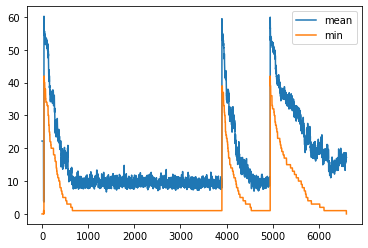

In [37]:
main_func(100, 150,60, 50, 150, 60,30, 40)

###### The answer for N=100 is :
[26, 42, 69, 76, 35, 37, 3, 8, 93, 12, 66, 46, 56, 43, 36, 89, 67, 71, 4, 68, 65, 38, 86, 84, 22, 0, 49, 27, 16, 91, 87, 2, 34, 92, 19, 81, 60, 57, 29, 51, 24, 54, 90, 83, 18, 98, 82, 53, 73, 11, 1, 94, 79, 40, 58, 14, 33, 95, 28, 55, 74, 77, 61, 7, 13, 15, 32, 48, 31, 5, 99, 78, 41, 30, 17, 6, 97, 25, 88, 62, 44, 96, 75, 59, 45, 80, 64, 52, 23, 47, 20, 70, 72, 85, 39, 63, 50, 9, 21, 10]
Visualizing my iterations:\
![Image of plot](https://s4.uupload.ir/files/screenshot_from_2021-11-19_21-26-45_vqii.png)

### N = 200

I know that duo to clean code rules, I mustn't repeat myself but i did here :))\
I could've changed it but it takes too long for N=200 and i don't have time to rerun it :)

In [12]:
n = 200
#The number of my initial population
population = 150

#initializing population
make_society(population)

#The percentage of population that i choose randomly from ,as parents
T = 60

#The percentage of population that i choose as parents
parents_percent = 50
N = int((parents_percent/100)*population)

#children precentage(from parents)
children_percentage = 150
children_num = int((children_percentage/100)*N)

#mutation percentage
m = 50

#local search percentage(from children num)
LS = 20

#percentage neighbours for each point(from children num)
neighbour_per = 40

society,df = make_society(population)
# print(society[4])

m = int( (m/100) * children_num ) # m is the number of children that get mutated
LS = int( (LS/100) * children_num )# LS is the number of children that we do local search for
neighbour_num = int( (neighbour_per/100) * children_num )

print("df :", end=" ")
print(df) 

df2 = df

while(df2['fitnesses'].values[0] != 0):
    society = truncation(T, N)['society'].to_list()
    children =[]

    #making the children
    for i in range(children_num):
        res = []
        for j in range(2):
            res.append(np.random.randint(0,N))
            
        child = order_recombination(society[res[0]], society[res[1]])
        children.append(child)
     
    #children mutation
    for i in range(m):
        children[i] = mutation(children[i])
    
    for j in range(LS):
#         print("changed")
        children[children_num-j-1] = local_search(children[children_num-j-1], neighbour_num)
        
    #finding the fittness of the children
    fitness = []
    for child in children:
        fitness.append(fitness_func(child))

    #making a data frame for children
    df_children  = pd.DataFrame({'society':children,'fitnesses':fitness})
    
    df = df.sort_values(by=['fitnesses'])   
    df = df.head(population - children_num)
    
    #adding children to our society
    frames = [df, df_children]
    df = pd.concat(frames)
    df2 = df.sort_values(by=['fitnesses'])

    print(df2)
#     print(df['society'].where(df['fitnesses'] == 0))

df :                                                society  fitnesses
0    (69, 36, 96, 139, 23, 91, 11, 181, 184, 198, 2...        137
1    (145, 59, 35, 119, 15, 91, 172, 1, 133, 162, 1...        128
2    (75, 126, 19, 46, 122, 73, 139, 25, 89, 127, 1...        139
3    (156, 17, 88, 133, 50, 57, 1, 5, 75, 77, 102, ...        146
4    (145, 171, 92, 165, 169, 175, 108, 43, 164, 14...        120
..                                                 ...        ...
145  (174, 121, 74, 77, 55, 162, 106, 173, 38, 197,...        138
146  (186, 170, 95, 181, 44, 85, 164, 1, 99, 132, 1...        128
147  (32, 100, 41, 86, 167, 164, 102, 9, 111, 59, 1...        141
148  (51, 102, 94, 131, 195, 141, 142, 173, 60, 150...        134
149  (192, 178, 143, 196, 67, 98, 180, 36, 87, 31, ...        132

[150 rows x 2 columns]
                                               society  fitnesses
94   [105, 184, 197, 52, 26, 59, 122, 169, 192, 189...         94
13   (181, 57, 167, 158, 143, 157, 50, 1, 114, 

                                               society  fitnesses
98   [40, 162, 10, 194, 143, 199, 53, 119, 186, 198...         92
102  [132, 189, 89, 126, 143, 196, 76, 1, 22, 156, ...         93
94   [105, 184, 197, 52, 26, 59, 122, 169, 192, 189...         94
91   [64, 109, 66, 19, 55, 144, 71, 106, 117, 62, 1...         94
38   [2, 122, 113, 5, 128, 156, 175, 14, 87, 187, 1...         96
..                                                 ...        ...
79   [83, 114, 160, 187, 94, 32, 188, 151, 180, 6, ...        151
28   [181, 141, 149, 120, 64, 193, 68, 112, 183, 13...        152
40   [12, 157, 182, 50, 184, 146, 23, 98, 104, 131,...        153
11   [194, 118, 3, 106, 121, 161, 142, 62, 137, 159...        157
15   [55, 178, 51, 39, 13, 114, 157, 187, 2, 188, 2...        159

[150 rows x 2 columns]
                                               society  fitnesses
98   [40, 162, 10, 194, 143, 199, 53, 119, 186, 198...         92
102  [132, 189, 89, 126, 143, 196, 76, 1, 22, 156, .

                                               society  fitnesses
54   [109, 66, 19, 55, 144, 106, 62, 187, 6, 0, 186...         86
26   [71, 106, 117, 62, 18, 187, 6, 199, 0, 186, 13...         90
98   [40, 162, 10, 194, 143, 199, 53, 119, 186, 198...         92
102  [132, 189, 89, 126, 143, 196, 76, 1, 22, 156, ...         93
47   [109, 66, 19, 55, 144, 71, 106, 117, 62, 187, ...         93
..                                                 ...        ...
37   [115, 32, 168, 107, 33, 78, 23, 79, 40, 198, 4...        148
85   [192, 102, 64, 38, 181, 77, 154, 129, 39, 67, ...        151
45   [120, 88, 28, 156, 137, 68, 105, 172, 184, 14,...        152
34   [156, 19, 157, 110, 36, 88, 45, 155, 80, 124, ...        158
58   [58, 125, 76, 5, 35, 118, 82, 38, 186, 161, 0,...        161

[150 rows x 2 columns]
                                              society  fitnesses
54  [109, 66, 19, 55, 144, 106, 62, 187, 6, 0, 186...         86
26  [71, 106, 117, 62, 18, 187, 6, 199, 0, 186, 13... 

                                              society  fitnesses
54  [109, 66, 19, 55, 144, 106, 62, 187, 6, 0, 186...         86
31  [55, 144, 106, 62, 187, 6, 0, 186, 139, 133, 1...         86
68  [106, 117, 62, 18, 187, 6, 199, 0, 186, 139, 1...         87
98  [71, 106, 117, 62, 18, 187, 6, 199, 0, 186, 13...         87
44  [71, 106, 117, 62, 18, 187, 6, 199, 0, 186, 13...         88
..                                                ...        ...
42  [43, 86, 126, 15, 16, 159, 180, 52, 102, 131, ...        147
85  [188, 158, 50, 170, 196, 52, 81, 28, 156, 61, ...        147
20  [24, 92, 102, 131, 117, 34, 61, 118, 19, 179, ...        148
77  [42, 133, 84, 170, 94, 77, 52, 51, 129, 91, 14...        149
83  [32, 84, 86, 198, 12, 117, 176, 171, 115, 33, ...        151

[150 rows x 2 columns]
                                              society  fitnesses
54  [109, 66, 19, 55, 144, 106, 62, 187, 6, 0, 186...         86
31  [55, 144, 106, 62, 187, 6, 0, 186, 139, 133, 1...         86
6

                                              society  fitnesses
14  [106, 117, 62, 18, 187, 6, 199, 0, 186, 139, 1...         85
54  [109, 66, 19, 55, 144, 106, 62, 187, 6, 0, 186...         86
31  [55, 144, 106, 62, 187, 6, 0, 186, 139, 133, 1...         86
75  [117, 62, 18, 187, 6, 199, 0, 186, 139, 133, 1...         86
37  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         86
..                                                ...        ...
82  [133, 101, 176, 4, 112, 188, 12, 65, 191, 69, ...        141
0   [159, 85, 124, 54, 70, 115, 32, 147, 107, 103,...        143
56  [168, 103, 164, 196, 76, 1, 22, 156, 72, 148, ...        146
46  [19, 55, 13, 69, 144, 102, 187, 120, 95, 149, ...        149
34  [171, 188, 88, 12, 135, 65, 191, 69, 152, 51, ...        151

[150 rows x 2 columns]
                                              society  fitnesses
14  [106, 117, 62, 18, 187, 6, 199, 0, 186, 139, 1...         85
54  [109, 66, 19, 55, 144, 106, 62, 187, 6, 0, 186...         86
3

                                              society  fitnesses
15  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         76
46  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         78
54  [6, 199, 0, 186, 139, 133, 101, 176, 4, 13, 8,...         79
29  [18, 0, 186, 133, 101, 139, 176, 4, 13, 8, 174...         81
44  [0, 186, 139, 133, 101, 176, 4, 13, 8, 174, 14...         81
..                                                ...        ...
47  [137, 172, 182, 114, 48, 41, 190, 104, 76, 68,...        126
23  [126, 121, 17, 180, 26, 25, 179, 101, 111, 73,...        128
56  [0, 186, 139, 133, 101, 176, 4, 13, 8, 174, 14...        128
36  [0, 186, 139, 133, 101, 176, 4, 13, 8, 174, 14...        132
38  [187, 6, 199, 0, 186, 139, 133, 101, 176, 4, 1...        138

[150 rows x 2 columns]
                                              society  fitnesses
15  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         76
46  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         78
5

                                              society  fitnesses
78  [101, 176, 4, 13, 8, 174, 149, 112, 171, 188, ...         73
16  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         75
31  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         75
75  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         75
84  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         75
..                                                ...        ...
72  [188, 82, 25, 95, 58, 80, 142, 138, 167, 88, 1...        121
23  [191, 69, 152, 51, 120, 61, 56, 118, 3, 38, 67...        123
69  [186, 133, 101, 139, 176, 4, 13, 8, 174, 149, ...        124
84  [13, 8, 174, 149, 112, 171, 188, 182, 88, 12, ...        125
10  [146, 65, 191, 69, 152, 51, 120, 61, 56, 118, ...        132

[150 rows x 2 columns]
                                              society  fitnesses
78  [101, 176, 4, 13, 8, 174, 149, 112, 171, 188, ...         73
16  [6, 0, 186, 139, 133, 101, 176, 4, 13, 8, 174,...         75
3

                                              society  fitnesses
83  [101, 176, 4, 13, 8, 174, 149, 112, 171, 188, ...         70
74  [133, 101, 176, 4, 13, 8, 174, 149, 112, 171, ...         71
22  [112, 171, 188, 182, 88, 12, 135, 146, 191, 69...         71
86  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         72
79  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         72
..                                                ...        ...
21  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...        126
53  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...        127
5   [182, 88, 12, 135, 146, 191, 69, 152, 51, 120,...        127
76  [177, 141, 27, 99, 185, 174, 149, 112, 171, 18...        128
6   [8, 174, 149, 112, 171, 188, 88, 12, 193, 146,...        165

[150 rows x 2 columns]
                                              society  fitnesses
83  [101, 176, 4, 13, 8, 174, 149, 112, 171, 188, ...         70
74  [133, 101, 176, 4, 13, 8, 174, 149, 112, 171, ...         71
2

                                              society  fitnesses
52  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         67
74  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         67
15  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         67
89  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         68
68  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         68
..                                                ...        ...
39  [174, 149, 112, 171, 188, 88, 12, 135, 146, 65...        118
85  [174, 149, 112, 171, 188, 88, 12, 135, 146, 65...        119
56  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...        119
55  [149, 112, 171, 188, 88, 12, 135, 146, 65, 191...        121
64  [174, 149, 112, 171, 188, 88, 12, 135, 146, 65...        131

[150 rows x 2 columns]
                                              society  fitnesses
52  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         67
74  [176, 4, 13, 8, 174, 149, 112, 171, 188, 88, 1...         67
1

                                               society  fitnesses
84   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         65
90   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         65
64   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         65
85   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         66
52   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         66
..                                                 ...        ...
92   [8, 174, 149, 112, 171, 150, 148, 142, 28, 181...        112
108  [169, 151, 164, 172, 1, 114, 48, 133, 53, 190,...        112
103  [4, 13, 8, 174, 149, 22, 73, 184, 63, 137, 108...        114
65   [8, 91, 149, 182, 85, 112, 171, 188, 88, 12, 1...        115
17   [149, 112, 171, 188, 88, 12, 135, 146, 65, 191...        118

[150 rows x 2 columns]
                                               society  fitnesses
84   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         65
90   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13.

                                               society  fitnesses
5    [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         63
50   [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         64
1    [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         64
56   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         64
12   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         65
..                                                 ...        ...
100  [13, 8, 174, 149, 112, 171, 88, 55, 135, 146, ...        115
107  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...        115
64   [149, 65, 83, 159, 112, 171, 188, 88, 12, 135,...        117
110  [79, 195, 119, 75, 85, 124, 38, 35, 125, 104, ...        117
40   [84, 89, 10, 74, 127, 31, 130, 63, 137, 108, 1...        123

[150 rows x 2 columns]
                                               society  fitnesses
5    [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         63
36   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13.

                                               society  fitnesses
12   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         61
43   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         62
24   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         62
44   [4, 13, 8, 174, 149, 75, 171, 188, 88, 12, 135...         62
64   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         62
..                                                 ...        ...
37   [174, 149, 171, 188, 88, 12, 135, 146, 65, 191...        111
107  [112, 61, 53, 15, 106, 117, 71, 187, 66, 0, 18...        112
93   [14, 2, 124, 91, 159, 70, 115, 198, 47, 77, 16...        112
56   [149, 112, 171, 188, 88, 12, 135, 146, 191, 69...        113
39   [171, 188, 88, 12, 135, 146, 191, 69, 152, 51,...        120

[150 rows x 2 columns]
                                              society  fitnesses
12  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         61
43  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13... 

                                              society  fitnesses
53  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
12  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         61
79  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         61
64  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         62
50  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         62
..                                                ...        ...
21  [174, 149, 112, 171, 188, 88, 12, 135, 146, 65...        117
35  [8, 174, 149, 112, 171, 188, 88, 12, 135, 146,...        117
51  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...        118
29  [8, 174, 149, 112, 171, 188, 88, 12, 135, 146,...        121
18  [174, 149, 112, 171, 188, 88, 12, 135, 146, 19...        124

[150 rows x 2 columns]
                                              society  fitnesses
53  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
12  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         61
7

                                              society  fitnesses
53  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
34  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         59
9   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         59
65  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
2   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         60
..                                                ...        ...
44  [149, 112, 171, 188, 88, 12, 135, 146, 172, 19...        110
62  [8, 174, 149, 112, 171, 188, 88, 12, 135, 146,...        111
16  [149, 112, 171, 188, 88, 12, 135, 146, 191, 69...        113
45  [112, 171, 188, 88, 12, 135, 146, 191, 69, 152...        114
73  [9, 74, 22, 174, 149, 112, 171, 188, 88, 12, 1...        127

[150 rows x 2 columns]
                                               society  fitnesses
53   [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
34   [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         5

                                              society  fitnesses
53  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         58
65  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
53  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
34  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         59
65  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         59
..                                                ...        ...
56  [174, 149, 112, 171, 188, 88, 12, 135, 74, 172...        116
35  [174, 149, 112, 171, 188, 88, 12, 135, 146, 17...        117
37  [174, 149, 112, 171, 188, 88, 12, 135, 74, 172...        120
0   [8, 174, 149, 112, 171, 188, 88, 12, 135, 146,...        121
50  [8, 174, 149, 112, 171, 188, 88, 12, 135, 146,...        122

[150 rows x 2 columns]
                                              society  fitnesses
53  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         58
87  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         59
7

                                              society  fitnesses
17  [112, 171, 188, 88, 31, 19, 12, 135, 146, 65, ...         55
58  [13, 8, 174, 112, 171, 188, 88, 12, 135, 146, ...         56
38  [13, 8, 174, 149, 112, 171, 188, 88, 12, 135, ...         57
23  [4, 13, 8, 174, 149, 112, 171, 188, 88, 12, 13...         57
14  [8, 174, 149, 112, 171, 188, 88, 12, 135, 146,...         57
..                                                ...        ...
24  [88, 12, 135, 146, 191, 69, 149, 84, 9, 74, 12...        118
10  [112, 171, 188, 88, 12, 135, 146, 65, 191, 69,...        119
66  [188, 88, 12, 135, 146, 191, 69, 65, 158, 89, ...        119
77  [127, 121, 17, 174, 149, 112, 171, 188, 88, 12...        127
29  [171, 188, 88, 12, 135, 146, 65, 191, 69, 152,...        130

[150 rows x 2 columns]
                                               society  fitnesses
17   [112, 171, 188, 88, 31, 19, 12, 135, 146, 65, ...         55
58   [13, 8, 174, 112, 171, 188, 88, 12, 135, 146, ...         5

                                               society  fitnesses
91   [8, 174, 149, 112, 171, 188, 88, 12, 135, 65, ...         54
17   [112, 171, 188, 88, 31, 19, 12, 135, 146, 65, ...         55
28   [112, 171, 188, 88, 12, 135, 146, 65, 191, 69,...         55
56   [171, 188, 88, 12, 135, 146, 65, 191, 69, 152,...         55
53   [112, 171, 188, 88, 12, 135, 146, 65, 191, 69,...         55
..                                                 ...        ...
107  [57, 158, 107, 33, 10, 79, 40, 198, 47, 29, 43...        110
90   [12, 135, 146, 191, 69, 152, 51, 120, 61, 56, ...        111
14   [112, 171, 188, 88, 12, 135, 146, 65, 191, 149...        113
15   [171, 188, 88, 12, 135, 146, 191, 69, 152, 51,...        113
83   [188, 88, 12, 135, 146, 172, 191, 69, 152, 51,...        115

[150 rows x 2 columns]
                                               society  fitnesses
91   [8, 174, 149, 112, 171, 188, 88, 12, 135, 65, ...         54
17   [112, 171, 188, 88, 31, 19, 12, 135, 146, 65, .

                                              society  fitnesses
35  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         51
45  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         52
55  [171, 188, 88, 12, 135, 146, 65, 191, 69, 152,...         52
63  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         52
6   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         53
..                                                ...        ...
51  [135, 146, 65, 191, 69, 152, 51, 120, 61, 56, ...        114
98  [88, 97, 20, 16, 111, 132, 155, 42, 193, 138, ...        115
56  [188, 88, 135, 146, 65, 191, 69, 152, 51, 120,...        117
13  [188, 88, 12, 135, 65, 146, 191, 69, 152, 51, ...        119
71  [12, 135, 146, 65, 191, 69, 152, 51, 120, 61, ...        120

[150 rows x 2 columns]
                                               society  fitnesses
35   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         51
45   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         5

                                               society  fitnesses
34   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         50
87   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         51
76   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         51
72   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         51
15   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         51
..                                                 ...        ...
39   [65, 146, 191, 69, 152, 51, 120, 61, 56, 118, ...        107
45   [188, 88, 12, 135, 65, 146, 191, 69, 152, 51, ...        107
105  [188, 88, 12, 135, 65, 146, 191, 69, 152, 51, ...        111
102  [146, 128, 175, 85, 161, 176, 13, 8, 174, 149,...        115
1    [88, 12, 135, 146, 191, 69, 152, 51, 120, 61, ...        132

[150 rows x 2 columns]
                                               society  fitnesses
34   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         50
87   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,.

                                               society  fitnesses
66   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         47
41   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         47
62   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         48
31   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         48
40   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         48
..                                                 ...        ...
105  [88, 12, 65, 146, 191, 69, 152, 51, 120, 61, 5...        109
65   [188, 88, 12, 135, 65, 146, 191, 69, 152, 51, ...        113
106  [171, 172, 127, 198, 47, 14, 2, 68, 16, 111, 1...        113
97   [103, 172, 191, 69, 152, 51, 3, 38, 129, 153, ...        113
18   [171, 188, 88, 12, 135, 65, 146, 191, 152, 51,...        117

[150 rows x 2 columns]
                                               society  fitnesses
66   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         47
80   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, .

                                              society  fitnesses
41  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
75  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
36  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
82  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
60  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
..                                                ...        ...
94  [69, 152, 51, 0, 128, 88, 114, 126, 121, 17, 1...        112
42  [12, 135, 65, 146, 191, 69, 152, 51, 120, 61, ...        114
96  [74, 191, 80, 159, 17, 180, 160, 26, 35, 125, ...        115
84  [65, 146, 191, 69, 152, 51, 120, 61, 135, 118,...        119
48  [12, 135, 65, 146, 191, 69, 152, 51, 120, 61, ...        119

[150 rows x 2 columns]
                                              society  fitnesses
41  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
75  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         46
3

                                               society  fitnesses
33   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         43
72   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         44
89   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         44
59   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         44
14   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         44
..                                                 ...        ...
97   [88, 12, 150, 148, 45, 179, 59, 50, 178, 82, 4...        106
91   [146, 191, 69, 152, 51, 56, 197, 120, 61, 135,...        106
103  [188, 88, 12, 57, 82, 14, 2, 122, 87, 116, 167...        110
101  [190, 37, 144, 106, 117, 102, 147, 107, 33, 78...        110
111  [188, 52, 183, 192, 155, 42, 189, 170, 124, 54...        110

[150 rows x 2 columns]
                                              society  fitnesses
33  [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         43
64  [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ... 

                                               society  fitnesses
29   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
32   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
71   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
33   [171, 188, 88, 12, 135, 65, 146, 191, 69, 152,...         43
25   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         43
..                                                 ...        ...
58   [188, 88, 12, 56, 65, 146, 191, 69, 152, 51, 1...        113
105  [66, 118, 3, 38, 67, 182, 85, 124, 179, 59, 11...        114
83   [152, 51, 120, 61, 56, 118, 3, 38, 67, 182, 85...        116
2    [188, 88, 12, 56, 65, 146, 191, 69, 152, 51, 1...        122
31   [17, 180, 160, 26, 35, 125, 104, 76, 15, 105, ...        123

[150 rows x 2 columns]
                                               society  fitnesses
29   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
32   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, .

                                               society  fitnesses
29   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
32   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
71   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
63   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
12   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         42
..                                                 ...        ...
83   [191, 69, 152, 51, 120, 56, 118, 3, 38, 67, 18...        114
66   [12, 65, 146, 191, 69, 152, 56, 0, 37, 51, 120...        114
105  [146, 62, 80, 66, 18, 143, 156, 89, 64, 109, 1...        119
72   [188, 88, 12, 56, 65, 191, 69, 152, 51, 120, 1...        122
26   [88, 12, 176, 56, 65, 146, 191, 69, 152, 51, 1...        135

[150 rows x 2 columns]
                                               society  fitnesses
29   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
32   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, .

                                               society  fitnesses
9    [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         40
19   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         40
29   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         40
57   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         40
49   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         41
..                                                 ...        ...
100  [60, 180, 26, 125, 188, 191, 69, 152, 51, 120,...        113
21   [65, 146, 191, 69, 101, 23, 108, 160, 152, 51,...        113
46   [65, 146, 191, 69, 91, 51, 120, 61, 135, 118, ...        115
64   [88, 12, 56, 65, 146, 191, 69, 152, 51, 120, 6...        125
13   [188, 88, 12, 56, 65, 146, 191, 69, 152, 51, 1...        127

[150 rows x 2 columns]
                                               society  fitnesses
9    [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         40
58   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, .

                                               society  fitnesses
40   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         38
84   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         39
64   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         39
38   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         39
82   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         39
..                                                 ...        ...
102  [188, 172, 127, 1, 114, 48, 183, 192, 155, 42,...        105
90   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...        105
103  [157, 22, 81, 93, 168, 159, 147, 176, 4, 13, 9...        108
77   [88, 12, 56, 65, 146, 191, 69, 152, 51, 120, 1...        114
51   [188, 88, 12, 56, 65, 146, 191, 69, 152, 51, 1...        117

[150 rows x 2 columns]
                                               society  fitnesses
40   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         38
7    [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, .

                                               society  fitnesses
12   [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
85   [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
40   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         38
85   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         38
59   [171, 188, 88, 12, 56, 65, 146, 191, 69, 152, ...         38
..                                                 ...        ...
102  [65, 146, 191, 16, 111, 132, 81, 145, 134, 92,...        107
110  [188, 88, 63, 2, 122, 197, 80, 66, 18, 143, 15...        107
41   [188, 88, 12, 56, 65, 146, 191, 69, 152, 51, 1...        109
69   [88, 12, 56, 65, 146, 191, 69, 152, 51, 120, 6...        109
19   [56, 65, 146, 191, 69, 152, 51, 120, 61, 135, ...        118

[150 rows x 2 columns]
                                              society  fitnesses
12  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
85  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ... 

                                              society  fitnesses
12  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
85  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
59  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
89  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
73  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
..                                                ...        ...
64  [12, 56, 65, 146, 191, 69, 152, 51, 120, 135, ...        112
33  [88, 12, 56, 65, 146, 191, 69, 152, 51, 120, 6...        114
46  [88, 12, 56, 65, 146, 191, 69, 152, 51, 120, 1...        117
4   [34, 189, 31, 9, 136, 39, 74, 169, 90, 157, 22...        123
27  [188, 88, 12, 56, 65, 146, 191, 69, 152, 51, 1...        127

[150 rows x 2 columns]
                                              society  fitnesses
12  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
85  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         37
5

                                              society  fitnesses
49  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         36
88  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         36
35  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         36
34  [171, 188, 88, 12, 56, 65, 191, 182, 69, 152, ...         36
74  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         36
..                                                ...        ...
94  [12, 56, 71, 186, 169, 76, 17, 133, 101, 4, 11...        118
14  [188, 88, 12, 56, 65, 191, 154, 69, 152, 51, 1...        120
0   [88, 12, 56, 65, 191, 154, 69, 152, 51, 120, 6...        122
17  [191, 69, 152, 51, 120, 109, 135, 13, 118, 3, ...        124
84  [188, 88, 12, 56, 65, 154, 191, 69, 152, 51, 1...        136

[150 rows x 2 columns]
                                              society  fitnesses
49  [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         36
88  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         36
3

                                               society  fitnesses
0    [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         34
64   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         35
35   [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         36
83   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         36
10   [171, 188, 88, 12, 56, 65, 154, 191, 69, 152, ...         36
..                                                 ...        ...
92   [171, 188, 88, 12, 56, 155, 42, 193, 41, 190, ...        103
105  [188, 88, 12, 56, 17, 180, 26, 125, 199, 144, ...        104
14   [188, 88, 12, 56, 65, 154, 191, 69, 152, 51, 1...        107
98   [88, 10, 68, 16, 111, 132, 81, 145, 134, 92, 1...        107
106  [171, 188, 88, 12, 56, 65, 191, 182, 69, 152, ...        108

[150 rows x 2 columns]
                                              society  fitnesses
0   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         34
64  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ... 

                                              society  fitnesses
36  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
69  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         33
73  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         33
69  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         34
80  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         34
..                                                ...        ...
95  [171, 188, 88, 56, 65, 154, 191, 69, 152, 51, ...        104
99  [171, 16, 67, 182, 96, 133, 101, 176, 4, 69, 1...        108
90  [88, 12, 56, 65, 191, 154, 69, 152, 51, 120, 6...        109
45  [88, 12, 56, 65, 191, 154, 69, 152, 51, 120, 6...        111
53  [188, 88, 12, 56, 65, 154, 191, 69, 152, 51, 1...        111

[150 rows x 2 columns]
                                               society  fitnesses
36   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
69   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         3

                                               society  fitnesses
36   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
73   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
60   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
83   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
84   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
..                                                 ...        ...
28   [188, 88, 12, 56, 65, 191, 154, 69, 152, 51, 1...        102
103  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...        103
64   [188, 88, 12, 56, 65, 191, 154, 69, 152, 51, 1...        105
92   [136, 3, 38, 67, 182, 77, 140, 161, 181, 196, ...        106
104  [188, 88, 12, 56, 65, 97, 20, 34, 189, 143, 15...        107

[150 rows x 2 columns]
                                              society  fitnesses
36  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...         32
82  [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ... 

                                               society  fitnesses
55   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         30
56   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         30
87   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         30
3    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         30
60   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         30
..                                                 ...        ...
93   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...        100
106  [88, 12, 56, 65, 191, 154, 69, 152, 51, 120, 6...        102
37   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...        103
105  [188, 88, 12, 56, 65, 191, 154, 69, 152, 51, 1...        107
52   [171, 188, 88, 12, 56, 65, 191, 154, 69, 152, ...        110

[150 rows x 2 columns]
                                               society  fitnesses
55   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         30
73   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
2    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
82   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
62   [171, 188, 88, 196, 56, 65, 191, 154, 69, 12, ...         29
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
..                                                 ...        ...
96   [171, 188, 88, 196, 56, 129, 153, 29, 43, 170,...         96
108  [188, 88, 196, 127, 1, 114, 48, 30, 192, 155, ...        103
23   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        103
109  [88, 196, 56, 65, 191, 154, 69, 197, 80, 66, 3...        106
102  [57, 10, 86, 164, 199, 144, 106, 117, 62, 197,...        106

[150 rows x 2 columns]
                                               society  fitnesses
2    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
43   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
64   [171, 188, 88, 196, 56, 65, 191, 154, 69, 12, ...         29
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
75   [171, 188, 88, 196, 56, 163, 191, 154, 69, 152...         29
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         29
..                                                 ...        ...
49   [196, 56, 65, 191, 154, 69, 152, 51, 120, 61, ...        103
98   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        104
104  [171, 188, 88, 196, 56, 65, 191, 154, 69, 51, ...        104
80   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        104
94   [188, 88, 196, 56, 65, 191, 154, 69, 152, 20, ...        107

[150 rows x 2 columns]
                                               society  fitnesses
43   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
56   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
43   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
69   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
30   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
68   [171, 188, 88, 196, 56, 191, 154, 38, 69, 152,...         28
..                                                 ...        ...
93   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        100
100  [171, 188, 88, 196, 56, 38, 191, 154, 69, 152,...        101
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        101
95   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        103
101  [188, 88, 196, 56, 65, 87, 116, 77, 112, 167, ...        106

[150 rows x 2 columns]
                                               society  fitnesses
43   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                              society  fitnesses
80  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
43  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
73  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
67  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
19  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         28
..                                                ...        ...
34  [56, 65, 191, 154, 69, 51, 120, 61, 135, 118, ...        109
74  [88, 196, 56, 65, 191, 154, 69, 152, 51, 120, ...        110
71  [122, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        115
51  [56, 65, 191, 154, 69, 51, 120, 61, 135, 118, ...        115
45  [56, 65, 191, 154, 69, 152, 149, 167, 51, 61, ...        117

[150 rows x 2 columns]
                                               society  fitnesses
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         2

                                               society  fitnesses
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
82   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
18   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
82   [171, 188, 88, 196, 56, 65, 191, 60, 69, 152, ...         27
..                                                 ...        ...
92   [154, 69, 152, 51, 120, 61, 135, 118, 3, 38, 6...        108
95   [34, 143, 156, 89, 65, 123, 98, 113, 173, 183,...        108
65   [56, 65, 191, 154, 69, 152, 51, 61, 135, 118, ...        109
110  [192, 155, 42, 193, 41, 190, 37, 165, 6, 17, 1...        109
106  [188, 150, 126, 87, 116, 158, 47, 77, 11, 53, ...        115

[150 rows x 2 columns]
                                               society  fitnesses
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
37   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
6    [171, 188, 88, 196, 56, 65, 191, 60, 69, 152, ...         26
82   [171, 188, 88, 196, 56, 65, 191, 60, 69, 152, ...         27
72   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         27
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        102
93   [7, 57, 10, 78, 93, 23, 79, 40, 198, 47, 98, 1...        103
52   [171, 188, 88, 196, 56, 65, 191, 69, 152, 51, ...        103
96   [88, 196, 56, 65, 191, 154, 69, 152, 51, 64, 6...        103
98   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        104

[150 rows x 2 columns]
                                               society  fitnesses
37   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
6    [171, 188, 88, 196, 56, 65, 191, 60, 69, 152, .

                                               society  fitnesses
37   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
82   [171, 188, 88, 196, 56, 65, 191, 60, 69, 152, ...         26
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
24   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
..                                                 ...        ...
96   [188, 88, 196, 56, 65, 165, 191, 154, 69, 152,...        102
97   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        103
29   [188, 88, 196, 56, 65, 191, 69, 152, 51, 37, 6...        103
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        104
109  [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...        106

[150 rows x 2 columns]
                                               society  fitnesses
37   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
52   [171, 188, 80, 196, 56, 65, 191, 154, 69, 152,.

                                              society  fitnesses
35  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
37  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
2   [152, 188, 88, 196, 56, 65, 191, 154, 69, 171,...         26
89  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
87  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
..                                                ...        ...
20  [88, 196, 56, 65, 191, 69, 29, 51, 37, 61, 135...        106
99  [188, 88, 32, 168, 159, 147, 69, 152, 51, 37, ...        107
74  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        108
97  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        113
62  [196, 56, 65, 191, 69, 29, 51, 37, 61, 135, 11...        116

[150 rows x 2 columns]
                                               society  fitnesses
35   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
76   [171, 188, 88, 196, 56, 65, 191, 60, 69, 152, ...         2

                                              society  fitnesses
35  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
8   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
89  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
78  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
24  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         26
..                                                ...        ...
94  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        105
46  [196, 56, 65, 191, 154, 69, 152, 51, 37, 135, ...        105
56  [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 1...        106
41  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        106
69  [171, 188, 88, 196, 56, 65, 191, 69, 152, 51, ...        115

[150 rows x 2 columns]
                                               society  fitnesses
35   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         2

                                               society  fitnesses
35   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
89   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
58   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
..                                                 ...        ...
88   [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...        104
108  [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...        107
78   [56, 65, 191, 154, 69, 152, 51, 37, 61, 135, 1...        109
107  [65, 191, 57, 10, 86, 4, 13, 130, 45, 159, 163...        110
104  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        112

[150 rows x 2 columns]
                                               society  fitnesses
35   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         24
35   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
74   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
58   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         25
..                                                 ...        ...
23   [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...         98
90   [171, 188, 88, 196, 103, 172, 127, 1, 114, 48,...        103
9    [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        105
96   [188, 4, 196, 56, 65, 191, 154, 120, 165, 59, ...        106
103  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        106

[150 rows x 2 columns]
                                               society  fitnesses
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         24
54   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         24
65   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         24
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         24
72   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         24
..                                                 ...        ...
100  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        100
64   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        100
98   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        101
111  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        102
103  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        109

[150 rows x 2 columns]
                                               society  fitnesses
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
77   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
62   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
..                                                 ...        ...
91   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         95
90   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         96
111  [11, 96, 163, 177, 141, 27, 99, 185, 129, 153,...         99
109  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        100
94   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        101

[150 rows x 2 columns]
                                               society  fitnesses
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         23
77   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
41   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         22
56   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         22
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         22
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         22
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         22
..                                                 ...        ...
87   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        107
96   [188, 88, 196, 56, 193, 41, 190, 120, 165, 59,...        107
104  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        108
111  [196, 56, 65, 191, 154, 69, 152, 51, 37, 61, 1...        108
31   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        112

[150 rows x 2 columns]
                                               society  fitnesses
41   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         22
21   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
78   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
45   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
10   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
59   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
..                                                 ...        ...
63   [188, 88, 196, 56, 65, 154, 69, 152, 51, 37, 6...         97
105  [171, 84, 166, 94, 97, 63, 137, 7, 57, 79, 125...        103
107  [88, 150, 126, 142, 28, 151, 110, 75, 119, 11,...        103
103  [125, 35, 160, 104, 76, 53, 25, 105, 15, 150, ...        104
92   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        108

[150 rows x 2 columns]
                                               society  fitnesses
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
1    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
70   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
81   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
..                                                 ...        ...
104  [171, 188, 88, 196, 59, 182, 180, 26, 125, 39,...        102
108  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        102
100  [56, 65, 191, 154, 69, 39, 142, 28, 151, 4, 17...        103
90   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        107
102  [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...        114

[150 rows x 2 columns]
                                              society  fitnesses
53  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
72  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,... 

                                               society  fitnesses
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
53   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
84   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
72   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
62   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         21
..                                                 ...        ...
39   [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...         99
104  [171, 188, 88, 196, 56, 42, 193, 41, 190, 120,...         99
21   [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...        101
75   [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...        108
103  [56, 65, 154, 69, 152, 51, 37, 61, 135, 118, 3...        110

[150 rows x 2 columns]
                                               society  fitnesses
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
70   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
65   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
..                                                 ...        ...
99   [88, 196, 56, 65, 191, 154, 31, 9, 136, 199, 7...         98
47   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         98
94   [171, 188, 88, 98, 113, 173, 183, 24, 60, 8, 5...         98
108  [188, 88, 196, 183, 24, 60, 8, 58, 7, 114, 48,...        106
91   [88, 196, 56, 89, 64, 154, 69, 152, 51, 72, 11...        113

[150 rows x 2 columns]
                                               society  fitnesses
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         20
87   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         18
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         18
71   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         18
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         18
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         18
..                                                 ...        ...
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         95
94   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         98
106  [154, 69, 152, 51, 37, 61, 135, 118, 3, 153, 2...         99
107  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        104
98   [21, 187, 0, 82, 62, 27, 99, 185, 129, 153, 29...        111

[150 rows x 2 columns]
                                               society  fitnesses
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         18
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
77   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
3    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
25   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
..                                                 ...        ...
103  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         85
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         88
110  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         90
111  [171, 2, 162, 65, 191, 154, 69, 152, 51, 37, 6...         96
98   [188, 88, 196, 56, 116, 134, 92, 9, 136, 199, ...         98

[150 rows x 2 columns]
                                               society  fitnesses
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
77   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
42   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         16
9    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
77   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
89   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         17
..                                                 ...        ...
97   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         95
96   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         95
94   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         97
101  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         97
111  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         98

[150 rows x 2 columns]
                                               society  fitnesses
42   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         16
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         15
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         15
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         16
70   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         16
73   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         16
..                                                 ...        ...
107  [188, 88, 196, 56, 65, 191, 154, 69, 152, 12, ...         92
98   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         93
109  [88, 196, 56, 65, 191, 154, 69, 152, 51, 37, 6...         93
96   [88, 74, 169, 90, 157, 65, 52, 177, 164, 75, 1...        102
97   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        105

[150 rows x 2 columns]
                                               society  fitnesses
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         15
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
65   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
59   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         15
16   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         15
64   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         15
..                                                 ...        ...
99   [171, 188, 88, 196, 65, 191, 168, 44, 46, 100,...        100
57   [56, 65, 191, 154, 69, 152, 51, 37, 61, 135, 1...        103
92   [88, 196, 56, 65, 191, 154, 69, 152, 169, 90, ...        104
96   [198, 129, 153, 190, 175, 83, 49, 21, 72, 123,...        108
105  [188, 88, 196, 56, 85, 77, 65, 191, 154, 69, 1...        109

[150 rows x 2 columns]
                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
65   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
64   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
..                                                 ...        ...
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         93
96   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         98
104  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         99
92   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        101
105  [196, 51, 37, 61, 135, 32, 23, 79, 40, 47, 124...        111

[150 rows x 2 columns]
                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         14
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
47   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         13
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         13
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         13
24   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         13
60   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         13
..                                                 ...        ...
93   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         92
96   [88, 196, 56, 65, 191, 154, 69, 152, 51, 17, 6...         94
105  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        100
103  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        100
109  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        106

[150 rows x 2 columns]
                                               society  fitnesses
47   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         13
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
64   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
82   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
65   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
..                                                 ...        ...
103  [88, 196, 56, 65, 191, 154, 69, 152, 51, 17, 6...         96
104  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         96
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         96
100  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         98
90   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        105

[150 rows x 2 columns]
                                               society  fitnesses
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
..                                                 ...        ...
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         87
8    [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         88
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         89
99   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         98
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        106

[150 rows x 2 columns]
                                               society  fitnesses
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
64   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
58   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         12
..                                                 ...        ...
99   [188, 88, 196, 56, 51, 191, 154, 69, 152, 65, ...         83
109  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         84
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         85
92   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         85
106  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         98

[150 rows x 2 columns]
                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
6    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
59   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
72   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
82   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
..                                                 ...        ...
108  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         88
98   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         90
101  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         93
96   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         98
99   [188, 88, 163, 177, 141, 27, 99, 185, 129, 153...        101

[150 rows x 2 columns]
                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
78   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
87   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
59   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
65   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
..                                                 ...        ...
90   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         88
111  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         92
100  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         97
101  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        106
105  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        107

[150 rows x 2 columns]
                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
84   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
84   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         11
..                                                 ...        ...
96   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         89
104  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         94
101  [171, 188, 88, 196, 56, 65, 191, 154, 31, 9, 1...         97
108  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         97
111  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        100

[150 rows x 2 columns]
                                               society  fitnesses
10   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
19   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
10   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
81   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
64   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
74   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
..                                                 ...        ...
109  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         91
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         93
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         94
91   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         99
97   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        109

[150 rows x 2 columns]
                                               society  fitnesses
10   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         10
66   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
50   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          9
81   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          9
58   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          9
78   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          9
..                                                 ...        ...
66   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         90
107  [188, 88, 196, 56, 65, 191, 154, 0, 152, 51, 1...         92
94   [188, 88, 196, 56, 65, 191, 154, 190, 69, 152,...         92
2    [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         96
108  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         97

[150 rows x 2 columns]
                                               society  fitnesses
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
70   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
62   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
82   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
59   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
..                                                 ...        ...
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         81
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         82
109  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         82
111  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         84
101  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         91

[150 rows x 2 columns]
                                               society  fitnesses
88   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
89   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
87   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          8
..                                                 ...        ...
105  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         79
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         81
107  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         85
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         94
93   [188, 99, 185, 129, 153, 68, 43, 113, 154, 69,...        105

[150 rows x 2 columns]
                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
71   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
..                                                 ...        ...
100  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         86
67   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         86
98   [171, 188, 88, 196, 84, 166, 94, 97, 20, 34, 1...         89
90   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         93
1    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         96

[150 rows x 2 columns]
                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
58   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
74   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
70   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
..                                                 ...        ...
102  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         82
111  [171, 188, 185, 129, 153, 68, 43, 170, 131, 84...         86
98   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         87
97   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         94
92   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         96

[150 rows x 2 columns]
                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
62   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
78   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
77   [171, 188, 88, 196, 56, 65, 191, 154, 69, 93, ...          7
76   [93, 188, 88, 196, 56, 65, 191, 154, 69, 171, ...          7
..                                                 ...        ...
96   [188, 88, 196, 56, 65, 72, 154, 69, 152, 51, 1...         86
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         86
100  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         91
92   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         91
99   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         93

[150 rows x 2 columns]
                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
89   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
83   [93, 188, 88, 196, 56, 65, 191, 154, 69, 171, ...          7
56   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
..                                                 ...        ...
99   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         85
107  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         91
93   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         91
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         91
97   [171, 188, 88, 196, 56, 65, 146, 121, 119, 11,...         98

[150 rows x 2 columns]
                                               society  fitnesses
38   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
58   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
84   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
81   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          7
..                                                 ...        ...
92   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         85
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         86
97   [96, 163, 177, 141, 27, 99, 185, 129, 153, 68,...         90
95   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         96
105  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        104

[150 rows x 2 columns]
                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
74   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
17   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
..                                                 ...        ...
100  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         87
91   [188, 132, 88, 196, 56, 65, 191, 103, 172, 127...         88
106  [171, 188, 88, 196, 56, 65, 128, 154, 69, 152,...         89
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         94
110  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        101

[150 rows x 2 columns]
                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
84   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
69   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
75   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
59   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
76   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         84
107  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         86
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         87
105  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         88
98   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         91

[150 rows x 2 columns]
                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
68   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
87   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
83   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
56   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         88
100  [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         90
98   [188, 88, 196, 56, 65, 191, 154, 106, 69, 152,...         92
93   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         97
105  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        100

[150 rows x 2 columns]
                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
86   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
63   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
61   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
26   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
1    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
..                                                 ...        ...
99   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         82
106  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         83
94   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         84
109  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         88
97   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         90

[150 rows x 2 columns]
                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
78   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
87   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
54   [171, 188, 88, 196, 56, 65, 173, 154, 69, 152,...          6
56   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
..                                                 ...        ...
90   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         90
110  [29, 120, 165, 59, 182, 180, 26, 125, 35, 175,...         91
102  [88, 10, 86, 164, 75, 144, 168, 159, 147, 78, ...         91
107  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         92
96   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         95

[150 rows x 2 columns]
                                               society  fitnesses
4    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
85   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,.

                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          5
20   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
80   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
72   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          6
..                                                 ...        ...
99   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         78
97   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         79
111  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         84
102  [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         86
59   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...         95

[150 rows x 2 columns]
                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          5
20   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          5
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
70   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
66   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
57   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          5
..                                                 ...        ...
97   [171, 188, 88, 91, 102, 70, 115, 89, 168, 159,...         88
45   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...         91
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         92
109  [171, 188, 88, 196, 56, 65, 191, 69, 152, 51, ...         92
92   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...        103

[150 rows x 2 columns]
                                               society  fitnesses
7    [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          5
71   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
67   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
67   [171, 188, 88, 196, 56, 65, 191, 154, 69, 152,...          5
3    [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
58   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          5
..                                                 ...        ...
90   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
94   [170, 131, 84, 166, 94, 97, 20, 34, 189, 31, 9...         92
108  [11, 96, 163, 177, 141, 27, 99, 185, 154, 153,...         98
107  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...        102
99   [188, 88, 196, 56, 65, 191, 154, 69, 152, 51, ...        104

[150 rows x 2 columns]
                                               society  fitnesses
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
80   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
109  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         91
106  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         95
96   [188, 88, 196, 56, 65, 191, 143, 69, 152, 73, ...         96

[150 rows x 2 columns]
                                               society  fitnesses
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
52   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
80   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          4
..                                                 ...        ...
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
94   [88, 196, 56, 65, 191, 143, 69, 152, 51, 17, 6...         89
105  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         90

[150 rows x 2 columns]
                                               society  fitnesses
52   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
80   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
52   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
58   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
70   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
..                                                 ...        ...
93   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
97   [188, 88, 196, 56, 65, 191, 74, 143, 69, 152, ...         87
108  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
98   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         89
107  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         97

[150 rows x 2 columns]
                                               society  fitnesses
52   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
79   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          3
..                                                 ...        ...
92   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
94   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         88
78   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         89
95   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         98

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
67   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
44   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
75   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
100  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         84
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
103  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         88
90   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         89

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
68   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
76   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         88
104  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         91
97   [188, 88, 196, 56, 65, 191, 152, 51, 143, 69, ...         92
99   [188, 88, 196, 56, 65, 191, 143, 125, 35, 175,...         92

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
75   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
108  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
90   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         90
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         91
96   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         96
109  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...        102

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
72   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                              society  fitnesses
78  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
61  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
86  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                ...        ...
96  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         77
99  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
9   [188, 88, 196, 67, 65, 191, 143, 69, 152, 51, ...         85
98  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         88
95  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...        106

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
58   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
76   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
101  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         86
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
49   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         90
93   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         99

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
64   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
64   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
97   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         80
102  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
93   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
106  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         89

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
59   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
99   [171, 188, 88, 196, 147, 78, 33, 3, 38, 23, 79...         91
111  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         92
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...        101

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
48   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
87   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
102  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         83
107  [171, 188, 88, 196, 56, 73, 184, 63, 137, 140,...         85
100  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         89

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
61   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
60   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
59   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
94   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
98   [171, 188, 88, 196, 56, 65, 191, 143, 152, 51,...         85
102  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         92
93   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         95

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
57   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
71   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
59   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
65   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
57   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
92   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
103  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
105  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         95

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
75   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
76   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
77   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
102  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
100  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
105  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         91
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         93
92   [171, 188, 196, 56, 65, 191, 143, 69, 152, 51,...         96

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
79   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
96   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
98   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
92   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         91

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
76   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
100  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
98   [171, 188, 88, 196, 56, 65, 191, 143, 153, 68,...         82
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         88
102  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         90
107  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         96

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
79   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
96   [7, 57, 10, 86, 164, 75, 144, 106, 178, 62, 12...         83
102  [171, 188, 88, 131, 84, 166, 94, 97, 20, 34, 1...         83
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         89
109  [171, 188, 88, 196, 111, 132, 81, 145, 116, 92...        100

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
77   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
98   [171, 188, 88, 196, 56, 65, 191, 143, 69, 114,...         82
96   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
108  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
13   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         84
100  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         86

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
73   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
58   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
40   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
96   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
91   [188, 88, 196, 56, 191, 143, 166, 94, 97, 20, ...         92
111  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         96
102  [128, 71, 66, 18, 129, 136, 199, 74, 169, 90, ...        109

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
60   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
72   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
103  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
96   [188, 196, 56, 65, 191, 143, 69, 152, 51, 17, ...         96
108  [188, 88, 196, 56, 37, 85, 77, 54, 91, 102, 70...         98
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         99
98   [71, 66, 18, 189, 31, 9, 136, 199, 74, 169, 90...         99

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
69   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
69   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
91   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         81
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
34   [88, 196, 56, 65, 191, 143, 69, 152, 51, 17, 6...         84
100  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         99

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
77   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
60   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
70   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
107  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         84
91   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         86
103  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
40   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         89
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         93

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
62   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
75   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
80   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
107  [171, 188, 88, 196, 56, 65, 191, 143, 137, 108...         86
111  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         87
58   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         91
101  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...        101
98   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...        106

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
61   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
63   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
67   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
66   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
97   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         85
90   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         90
94   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         91
92   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         93
108  [188, 88, 196, 56, 65, 191, 110, 145, 116, 92,...         98

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
73   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
71   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
90   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         78
98   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         78
96   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
104  [171, 188, 88, 196, 56, 65, 20, 189, 31, 9, 13...         81
91   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         83

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
59   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
61   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
65   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
97   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         80
109  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
108  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
100  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
99   [88, 196, 56, 65, 191, 143, 69, 152, 51, 17, 6...         88

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
68   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
72   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
87   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
80   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
94   [171, 188, 88, 196, 56, 198, 114, 48, 30, 192,...         79
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
90   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
98   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         97

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
58   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
87   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
100  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         80
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
97   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         87
106  [171, 180, 26, 125, 35, 175, 104, 76, 122, 190...        105

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
53   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 169,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
96   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
104  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         90
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         90

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
73   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
..                                                 ...        ...
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
111  [171, 188, 88, 73, 184, 63, 137, 108, 103, 172...         90
93   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         95
92   [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         97

[150 rows x 2 columns]
                                               society  fitnesses
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          2
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
59   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
79   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
64   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
111  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
106  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         84
110  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         87
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         88
100  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         89

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
59   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
87   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
62   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
89   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
95   [171, 188, 88, 76, 53, 25, 105, 56, 65, 191, 1...         89
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         89
91   [171, 188, 88, 131, 84, 166, 94, 97, 20, 34, 1...         89
106  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         95
110  [196, 56, 65, 191, 140, 194, 74, 169, 90, 157,...        103

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
67   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
93   [171, 154, 194, 68, 43, 170, 131, 84, 166, 94,...         75
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
94   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         82
106  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         87
91   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         98

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
74   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
87   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
67   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
95   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         77
108  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         78
99   [171, 188, 88, 196, 56, 65, 172, 127, 198, 114...         82
98   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
107  [188, 88, 51, 196, 56, 65, 191, 143, 69, 152, ...         87

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
70   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
75   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
76   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
77   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
101  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         79
110  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         79
90   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
105  [171, 188, 88, 196, 56, 125, 35, 175, 104, 76,...         85
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
36   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
84   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
57   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
108  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
51   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
52   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
101  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         92
111  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...        108

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
67   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
51   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
88   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
77   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
109  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         81
103  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
96   [188, 41, 29, 120, 15, 59, 182, 180, 26, 125, ...         84
102  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
108  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         85

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
56   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
85   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
64   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         80
103  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         84
95   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         90
92   [171, 148, 140, 161, 181, 12, 146, 121, 119, 1...         91

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
61   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
86   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
33   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
57   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
98   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
111  [188, 88, 196, 56, 65, 191, 143, 69, 152, 51, ...         87
96   [118, 107, 93, 67, 37, 85, 77, 54, 91, 102, 70...         89
95   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         94
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         94

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
81   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
73   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
83   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
79   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
80   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
105  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         81
109  [188, 88, 196, 23, 79, 40, 1, 47, 124, 148, 14...         81
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         85
91   [188, 88, 196, 56, 65, 191, 143, 69, 93, 51, 1...         95

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
82   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
77   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
71   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
37   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
..                                                 ...        ...
97   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         79
110  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         83
99   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         86
96   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...         87
105  [188, 15, 59, 182, 180, 26, 125, 35, 175, 104,...         95

[150 rows x 2 columns]
                                               society  fitnesses
22   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...          1
78   [171, 188, 88, 196, 56, 65, 191, 143, 69, 152,.

In [14]:
df2.head()

,society,fitnesses
54,"[171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...",0
22,"[171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...",1
81,"[171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...",1
82,"[171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...",1
88,"[171, 188, 88, 196, 56, 65, 191, 143, 69, 152,...",1


In [19]:
society_column = df2.loc[:,'society']
print("answer fo n= 200 : ", end =" ")
print(society_column[54])
print("fitness = ", end = " ")
print(fitness_func(society_column[54]))

answer fo n= 200 :  [171, 188, 88, 196, 56, 65, 191, 143, 69, 152, 51, 17, 61, 135, 118, 107, 93, 67, 37, 85, 77, 54, 91, 102, 70, 115, 89, 169, 159, 147, 78, 33, 3, 38, 23, 79, 40, 1, 47, 124, 148, 140, 161, 181, 12, 146, 121, 119, 11, 96, 163, 177, 141, 27, 99, 185, 154, 194, 68, 43, 170, 131, 84, 166, 94, 97, 20, 34, 189, 31, 9, 136, 199, 74, 168, 90, 157, 22, 73, 184, 63, 137, 108, 103, 172, 127, 198, 114, 48, 30, 192, 155, 42, 193, 41, 29, 120, 15, 59, 182, 180, 26, 125, 35, 175, 104, 76, 53, 25, 105, 165, 150, 126, 142, 28, 151, 110, 39, 130, 45, 179, 197, 195, 0, 82, 14, 134, 162, 87, 2, 167, 52, 153, 44, 46, 100, 122, 190, 16, 111, 132, 81, 145, 116, 92, 138, 6, 160, 83, 36, 5, 49, 21, 72, 123, 98, 113, 173, 183, 60, 24, 8, 58, 7, 57, 10, 86, 164, 75, 144, 106, 178, 62, 128, 71, 66, 18, 129, 156, 32, 64, 109, 158, 19, 55, 80, 186, 50, 176, 187, 139, 133, 174, 117, 4, 13, 95, 101, 149, 112]
fitness =  0


#### Answer fo n= 200 :
[171, 188, 88, 196, 56, 65, 191, 143, 69, 152, 51, 17, 61, 135, 118, 107, 93, 67, 37, 85, 77, 54, 91, 102, 70, 115, 89, 169, 159, 147, 78, 33, 3, 38, 23, 79, 40, 1, 47, 124, 148, 140, 161, 181, 12, 146, 121, 119, 11, 96, 163, 177, 141, 27, 99, 185, 154, 194, 68, 43, 170, 131, 84, 166, 94, 97, 20, 34, 189, 31, 9, 136, 199, 74, 168, 90, 157, 22, 73, 184, 63, 137, 108, 103, 172, 127, 198, 114, 48, 30, 192, 155, 42, 193, 41, 29, 120, 15, 59, 182, 180, 26, 125, 35, 175, 104, 76, 53, 25, 105, 165, 150, 126, 142, 28, 151, 110, 39, 130, 45, 179, 197, 195, 0, 82, 14, 134, 162, 87, 2, 167, 52, 153, 44, 46, 100, 122, 190, 16, 111, 132, 81, 145, 116, 92, 138, 6, 160, 83, 36, 5, 49, 21, 72, 123, 98, 113, 173, 183, 60, 24, 8, 58, 7, 57, 10, 86, 164, 75, 144, 106, 178, 62, 128, 71, 66, 18, 129, 156, 32, 64, 109, 158, 19, 55, 80, 186, 50, 176, 187, 139, 133, 174, 117, 4, 13, 95, 101, 149, 112]

### N = 300

Again I repeated myself here but that won't happen anymore:)

In [23]:
n = 300
#The number of my initial population
population = 100

#initializing population
make_society(population)

#The percentage of population that i choose randomly from ,as parents
T = 60

#The percentage of population that i choose as parents
parents_percent = 50
N = int((parents_percent/100)*population)

#children precentage(from parents)
children_percentage = 150
children_num = int((children_percentage/100)*N)

#mutation percentage
m = 50

#local search percentage(from children num)
LS = 20

#percentage neighbours for each point(from children num)
neighbour_per = 40

society,df = make_society(population)
# print(society[4])

m = int( (m/100) * children_num ) # m is the number of children that get mutated
LS = int( (LS/100) * children_num )# LS is the number of children that we do local search for
neighbour_num = int( (neighbour_per/100) * children_num )

print("df :", end=" ")
print(df) 

df2 = df

while(df2['fitnesses'].values[0] != 0):
    society = truncation(T, N)['society'].to_list()
    children =[]

    #making the children
    for i in range(children_num):
        res = []
        for j in range(2):
            res.append(np.random.randint(0,N))
            
        child = order_recombination(society[res[0]], society[res[1]])
        children.append(child)
     
    #children mutation
    for i in range(m):
        children[i] = mutation(children[i])
    
    for j in range(LS):
#         print("changed")
        children[children_num-j-1] = local_search(children[children_num-j-1], neighbour_num)
        
    #finding the fittness of the children
    fitness = []
    for child in children:
        fitness.append(fitness_func(child))

    #making a data frame for children
    df_children  = pd.DataFrame({'society':children,'fitnesses':fitness})
    
    df = df.sort_values(by=['fitnesses'])   
    df = df.head(population - children_num)
    
    #adding children to our society
    frames = [df, df_children]
    df = pd.concat(frames)
    df2 = df.sort_values(by=['fitnesses'])

    print(df2)
#     print(df['society'].where(df['fitnesses'] == 0))

df :                                               society  fitnesses
0   (217, 111, 51, 245, 158, 212, 120, 266, 71, 14...        182
1   (251, 143, 57, 3, 248, 234, 6, 128, 124, 127, ...        197
2   (78, 297, 92, 25, 218, 111, 247, 108, 4, 255, ...        173
3   (209, 111, 241, 5, 7, 67, 146, 199, 295, 81, 1...        191
4   (69, 226, 18, 175, 291, 182, 16, 88, 6, 107, 8...        222
..                                                ...        ...
95  (64, 214, 21, 259, 26, 244, 125, 106, 128, 117...        196
96  (240, 70, 116, 230, 248, 43, 157, 125, 18, 114...        203
97  (69, 40, 157, 278, 255, 22, 59, 44, 18, 89, 13...        178
98  (38, 175, 49, 265, 51, 22, 248, 4, 24, 165, 18...        169
99  (226, 123, 236, 179, 182, 265, 69, 235, 180, 2...        193

[100 rows x 2 columns]
                                              society  fitnesses
74  [233, 18, 33, 240, 100, 235, 71, 237, 45, 132,...        157
63  [12, 111, 222, 70, 201, 117, 132, 159, 79, 13,...        

                                              society  fitnesses
61  [68, 30, 272, 116, 128, 279, 19, 88, 210, 243,...        147
64  [126, 54, 136, 44, 105, 156, 204, 153, 179, 53...        151
21  [232, 213, 29, 159, 95, 12, 44, 297, 133, 149,...        152
49  [233, 18, 33, 240, 100, 235, 71, 237, 45, 132,...        153
32  [93, 196, 103, 229, 153, 152, 73, 274, 57, 232...        153
..                                                ...        ...
51  [237, 249, 254, 162, 74, 117, 231, 182, 32, 28...        212
8   [279, 19, 88, 192, 34, 264, 155, 13, 224, 82, ...        213
37  [179, 258, 25, 151, 254, 206, 11, 273, 18, 47,...        214
31  [126, 54, 136, 44, 105, 156, 204, 153, 179, 53...        217
2   [17, 125, 256, 189, 117, 293, 93, 255, 16, 198...        235

[100 rows x 2 columns]
                                              society  fitnesses
61  [68, 30, 272, 116, 128, 279, 19, 88, 210, 243,...        147
64  [126, 54, 136, 44, 105, 156, 204, 153, 179, 53...        151
2

                                              society  fitnesses
61  [68, 30, 272, 116, 128, 279, 19, 88, 210, 243,...        147
64  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        147
48  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        147
39  [231, 96, 19, 199, 207, 153, 152, 73, 290, 46,...        148
74  [73, 17, 225, 127, 24, 214, 219, 116, 35, 139,...        150
..                                                ...        ...
35  [247, 50, 9, 54, 23, 270, 46, 110, 258, 15, 66...        214
41  [239, 234, 13, 30, 71, 70, 76, 78, 90, 120, 21...        215
11  [99, 19, 88, 210, 17, 3, 60, 120, 237, 249, 28...        215
32  [233, 247, 191, 266, 143, 265, 222, 170, 237, ...        228
16  [232, 67, 175, 0, 88, 34, 10, 161, 12, 46, 136...        243

[100 rows x 2 columns]
                                              society  fitnesses
61  [68, 30, 272, 116, 128, 279, 19, 88, 210, 243,...        147
64  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        147
4

                                              society  fitnesses
59  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        138
39  [93, 196, 103, 229, 153, 152, 73, 274, 57, 232...        144
50  [93, 196, 103, 229, 153, 152, 73, 274, 57, 232...        144
1   [93, 196, 103, 229, 153, 152, 73, 274, 57, 232...        146
61  [68, 30, 272, 116, 128, 279, 19, 88, 210, 243,...        147
..                                                ...        ...
40  [101, 6, 252, 115, 284, 173, 286, 35, 192, 137...        210
36  [262, 55, 66, 23, 94, 279, 68, 176, 132, 62, 1...        214
23  [271, 147, 269, 68, 132, 75, 178, 17, 257, 33,...        216
32  [46, 136, 292, 110, 18, 283, 215, 231, 199, 20...        223
55  [281, 235, 197, 206, 91, 4, 125, 142, 278, 158...        228

[100 rows x 2 columns]
                                              society  fitnesses
59  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        138
50  [93, 196, 103, 229, 153, 152, 73, 274, 57, 232...        144
5

                                              society  fitnesses
14  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        135
41  [196, 74, 297, 29, 113, 226, 73, 198, 110, 88,...        135
58  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        135
19  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        135
36  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        136
..                                                ...        ...
64  [172, 34, 10, 161, 12, 46, 136, 292, 258, 110,...        188
35  [67, 153, 34, 292, 274, 10, 152, 93, 159, 189,...        189
45  [67, 153, 34, 292, 274, 152, 93, 159, 18, 283,...        190
23  [12, 196, 74, 297, 29, 113, 226, 73, 198, 110,...        190
49  [231, 96, 19, 199, 207, 229, 152, 73, 290, 46,...        192

[100 rows x 2 columns]
                                              society  fitnesses
14  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        135
41  [196, 74, 297, 29, 113, 226, 73, 198, 110, 88,...        135
5

                                              society  fitnesses
21  [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        128
38  [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        129
35  [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        129
74  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        130
34  [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        130
..                                                ...        ...
56  [196, 74, 297, 29, 113, 226, 156, 198, 110, 88...        186
25  [231, 113, 226, 73, 198, 110, 88, 67, 153, 34,...        191
5   [74, 297, 29, 113, 226, 73, 198, 110, 88, 67, ...        191
52  [297, 29, 113, 226, 73, 198, 110, 88, 67, 153,...        191
1   [226, 73, 198, 110, 88, 67, 153, 34, 292, 274,...        193

[100 rows x 2 columns]
                                              society  fitnesses
21  [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        128
38  [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        129
3

                                              society  fitnesses
40  [12, 196, 74, 297, 29, 113, 226, 73, 198, 110,...        127
21  [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        128
22  [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        128
6   [12, 196, 74, 297, 29, 231, 113, 226, 73, 198,...        128
20  [136, 12, 196, 74, 297, 29, 113, 226, 73, 198,...        128
..                                                ...        ...
30  [74, 297, 29, 113, 226, 198, 156, 110, 88, 67,...        187
3   [231, 113, 226, 73, 198, 110, 88, 67, 153, 34,...        188
48  [297, 29, 231, 226, 73, 198, 110, 88, 67, 153,...        192
45  [187, 84, 257, 33, 151, 246, 233, 155, 247, 16...        204
32  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        226

[100 rows x 2 columns]
                                              society  fitnesses
40  [12, 196, 74, 297, 29, 113, 226, 73, 198, 110,...        127
52  [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        127
3

                                              society  fitnesses
9   [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        122
49  [198, 156, 110, 88, 231, 67, 153, 34, 292, 274...        122
4   [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        124
53  [136, 12, 196, 74, 297, 29, 113, 226, 198, 156...        124
3   [226, 198, 156, 110, 88, 67, 153, 34, 292, 274...        124
..                                                ...        ...
25  [226, 198, 156, 110, 88, 67, 153, 34, 292, 274...        184
10  [113, 226, 198, 156, 110, 88, 67, 153, 34, 292...        184
60  [74, 297, 263, 109, 14, 107, 87, 272, 25, 106,...        184
14  [74, 198, 156, 110, 88, 67, 153, 34, 292, 274,...        189
42  [67, 153, 34, 274, 10, 152, 93, 159, 189, 18, ...        196

[100 rows x 2 columns]
                                              society  fitnesses
9   [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        122
49  [198, 156, 110, 88, 231, 67, 153, 34, 292, 274...        122
4

                                              society  fitnesses
54  [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        120
20  [113, 226, 198, 156, 110, 88, 67, 153, 34, 292...        120
22  [226, 198, 110, 88, 67, 153, 34, 292, 274, 10,...        121
53  [113, 226, 198, 156, 110, 88, 67, 153, 34, 292...        122
19  [113, 226, 198, 156, 110, 88, 67, 153, 34, 292...        122
..                                                ...        ...
70  [88, 67, 167, 242, 133, 183, 285, 51, 69, 269,...        182
11  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        182
60  [67, 153, 34, 292, 274, 10, 152, 93, 159, 189,...        183
51  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        196
5   [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        202

[100 rows x 2 columns]
                                              society  fitnesses
54  [196, 74, 297, 29, 113, 226, 198, 156, 110, 88...        120
20  [113, 226, 198, 156, 110, 88, 67, 153, 34, 292...        120
2

                                              society  fitnesses
7   [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        119
25  [198, 156, 110, 88, 231, 67, 153, 34, 292, 274...        120
38  [29, 113, 226, 198, 156, 110, 88, 67, 153, 34,...        120
1   [110, 88, 67, 153, 34, 292, 274, 10, 152, 93, ...        120
20  [113, 226, 198, 156, 110, 88, 67, 153, 34, 292...        120
..                                                ...        ...
62  [226, 198, 156, 32, 231, 95, 284, 50, 241, 209...        179
0   [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        183
26  [44, 253, 32, 231, 95, 96, 19, 199, 207, 112, ...        184
9   [226, 198, 156, 88, 67, 153, 34, 292, 274, 10,...        188
8   [152, 93, 159, 189, 283, 9, 215, 32, 231, 95, ...        191

[100 rows x 2 columns]
                                              society  fitnesses
7   [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        119
25  [198, 156, 110, 88, 231, 67, 153, 34, 292, 274...        120
3

                                              society  fitnesses
28  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        117
11  [67, 153, 34, 292, 274, 10, 152, 93, 159, 189,...        117
7   [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        119
50  [110, 88, 67, 153, 34, 292, 274, 10, 152, 93, ...        119
0   [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        119
..                                                ...        ...
45  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        188
6   [283, 9, 215, 32, 231, 44, 96, 19, 199, 207, 1...        194
23  [93, 159, 189, 283, 9, 215, 32, 235, 111, 113,...        195
39  [34, 292, 274, 10, 152, 93, 159, 189, 283, 9, ...        196
11  [34, 292, 274, 10, 152, 93, 159, 189, 283, 9, ...        198

[100 rows x 2 columns]
                                              society  fitnesses
28  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        117
11  [67, 153, 34, 292, 274, 10, 152, 93, 159, 189,...        117
5

                                              society  fitnesses
29  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        114
45  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        114
21  [156, 110, 88, 67, 153, 34, 114, 274, 10, 152,...        115
27  [67, 153, 34, 292, 274, 10, 152, 93, 159, 189,...        116
16  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        116
..                                                ...        ...
2   [134, 165, 47, 221, 83, 45, 210, 8, 98, 53, 11...        187
39  [82, 182, 240, 167, 242, 63, 183, 285, 21, 47,...        188
41  [110, 88, 67, 153, 34, 292, 274, 10, 152, 93, ...        189
23  [34, 292, 274, 10, 152, 93, 159, 189, 283, 9, ...        191
25  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        196

[100 rows x 2 columns]
                                              society  fitnesses
21  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        111
29  [156, 110, 88, 67, 153, 34, 292, 274, 10, 152,...        114
4

                                              society  fitnesses
21  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        111
0   [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        111
13  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        111
23  [88, 67, 153, 34, 292, 274, 10, 91, 93, 159, 1...        112
34  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        112
..                                                ...        ...
63  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        175
6   [292, 274, 10, 163, 93, 159, 189, 18, 283, 9, ...        177
71  [10, 152, 93, 159, 189, 18, 283, 60, 36, 205, ...        177
36  [10, 152, 93, 159, 189, 18, 283, 9, 215, 32, 2...        179
54  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        180

[100 rows x 2 columns]
                                              society  fitnesses
21  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        111
0   [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        111
1

                                              society  fitnesses
54  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        109
36  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        109
50  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        110
37  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        110
41  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        110
..                                                ...        ...
9   [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        174
70  [10, 152, 93, 159, 189, 18, 283, 9, 215, 32, 2...        175
8   [274, 10, 93, 159, 189, 18, 283, 9, 215, 91, 1...        177
65  [274, 10, 91, 93, 159, 189, 18, 283, 9, 215, 3...        186
74  [91, 93, 88, 67, 153, 34, 292, 274, 96, 19, 19...        186

[100 rows x 2 columns]
                                              society  fitnesses
54  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        109
36  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        109
9

                                              society  fitnesses
41  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        106
32  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        108
2   [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        108
4   [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        108
1   [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        108
..                                                ...        ...
37  [10, 152, 93, 159, 189, 18, 283, 9, 215, 32, 2...        175
65  [67, 153, 34, 292, 274, 10, 93, 159, 189, 18, ...        175
69  [153, 85, 283, 247, 168, 280, 191, 38, 173, 25...        176
64  [34, 292, 274, 77, 62, 186, 244, 108, 238, 54,...        176
72  [34, 292, 274, 10, 152, 93, 132, 86, 293, 216,...        180

[100 rows x 2 columns]
                                              society  fitnesses
41  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        106
32  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        108
2

                                              society  fitnesses
22  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        105
41  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        106
27  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        106
49  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        106
34  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        106
..                                                ...        ...
70  [93, 159, 189, 18, 283, 9, 215, 32, 231, 95, 1...        171
68  [292, 274, 10, 152, 93, 159, 151, 18, 283, 9, ...        174
25  [10, 152, 93, 159, 189, 18, 283, 89, 215, 32, ...        185
50  [10, 152, 93, 159, 189, 18, 283, 215, 32, 231,...        190
40  [153, 34, 292, 274, 10, 152, 93, 159, 151, 18,...        195

[100 rows x 2 columns]
                                              society  fitnesses
22  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        105
41  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        106
2

                                              society  fitnesses
39  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        102
19  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        102
38  [153, 34, 292, 274, 10, 152, 93, 159, 189, 18,...        104
6   [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        104
14  [88, 67, 153, 34, 292, 274, 10, 152, 93, 159, ...        105
..                                                ...        ...
6   [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        173
31  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        173
19  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        174
28  [292, 274, 10, 152, 93, 159, 190, 18, 283, 9, ...        188
39  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        189

[100 rows x 2 columns]
                                              society  fitnesses
39  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        102
19  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        102
3

                                              society  fitnesses
39  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        102
19  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        102
34  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        103
41  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        104
55  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        104
..                                                ...        ...
60  [292, 274, 10, 152, 93, 159, 291, 51, 48, 187,...        176
57  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        179
64  [274, 10, 152, 93, 159, 189, 18, 283, 9, 215, ...        181
69  [197, 206, 91, 190, 125, 142, 278, 158, 179, 1...        183
71  [274, 10, 136, 148, 202, 117, 223, 53, 116, 82...        183

[100 rows x 2 columns]
                                              society  fitnesses
39  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        102
19  [34, 292, 274, 10, 152, 93, 159, 189, 18, 283,...        102
5

                                              society  fitnesses
0   [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        100
28  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        100
48  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        100
36  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        101
12  [292, 274, 10, 152, 70, 159, 189, 18, 283, 9, ...        101
..                                                ...        ...
47  [274, 10, 152, 93, 159, 189, 18, 283, 9, 215, ...        170
55  [152, 93, 159, 189, 18, 283, 9, 215, 32, 231, ...        171
6   [159, 189, 18, 283, 9, 215, 32, 231, 95, 96, 1...        175
62  [10, 152, 93, 159, 75, 214, 107, 87, 272, 25, ...        179
22  [274, 10, 152, 93, 159, 189, 18, 283, 9, 215, ...        180

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        100
41  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...        100
1

                                              society  fitnesses
12  [292, 274, 233, 152, 93, 159, 189, 18, 283, 9,...         98
49  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...         98
46  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         98
55  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...         98
13  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...         98
..                                                ...        ...
74  [93, 159, 137, 276, 17, 84, 59, 123, 77, 62, 2...        169
8   [10, 152, 93, 159, 189, 18, 283, 9, 215, 32, 2...        170
34  [93, 159, 189, 18, 283, 9, 215, 32, 231, 95, 9...        172
52  [152, 93, 159, 189, 18, 283, 9, 215, 32, 231, ...        175
49  [159, 189, 18, 283, 9, 215, 32, 231, 282, 164,...        177

[100 rows x 2 columns]
                                              society  fitnesses
12  [292, 274, 233, 152, 93, 159, 189, 18, 283, 9,...         98
49  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...         98
4

                                              society  fitnesses
39  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         95
31  [292, 274, 10, 152, 159, 189, 18, 283, 9, 215,...         96
21  [292, 274, 10, 152, 93, 159, 189, 18, 283, 9, ...         96
25  [292, 274, 10, 152, 159, 189, 18, 283, 9, 215,...         96
43  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         96
..                                                ...        ...
61  [292, 228, 105, 219, 236, 225, 42, 96, 19, 199...        167
70  [274, 10, 152, 93, 159, 189, 18, 283, 9, 215, ...        170
67  [10, 158, 203, 69, 269, 122, 49, 200, 96, 19, ...        171
64  [10, 152, 159, 59, 123, 77, 62, 250, 294, 253,...        172
17  [10, 152, 93, 159, 189, 18, 283, 9, 215, 32, 2...        180

[100 rows x 2 columns]
                                              society  fitnesses
39  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         95
14  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         95
5

                                              society  fitnesses
24  [292, 274, 233, 152, 93, 159, 189, 18, 283, 9,...         91
53  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         92
15  [292, 274, 233, 152, 93, 159, 189, 18, 283, 9,...         92
15  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         92
55  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         92
..                                                ...        ...
73  [292, 274, 152, 93, 159, 168, 279, 263, 109, 1...        166
34  [274, 152, 93, 159, 189, 18, 283, 9, 215, 32, ...        167
66  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        167
24  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        171
72  [152, 93, 159, 189, 18, 283, 215, 233, 32, 231...        176

[100 rows x 2 columns]
                                              society  fitnesses
24  [292, 274, 233, 152, 93, 159, 189, 18, 283, 9,...         91
53  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         92
1

                                              society  fitnesses
13  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         89
46  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         89
36  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         89
30  [292, 274, 233, 152, 93, 159, 189, 18, 283, 9,...         89
48  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         89
..                                                ...        ...
69  [292, 274, 152, 93, 159, 189, 18, 283, 252, 16...        157
43  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        159
64  [292, 274, 152, 93, 159, 189, 18, 94, 280, 26,...        161
61  [292, 274, 152, 93, 159, 189, 140, 271, 147, 2...        162
50  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        168

[100 rows x 2 columns]
                                              society  fitnesses
13  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         89
46  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         89
3

                                              society  fitnesses
14  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         86
21  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         86
58  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         87
37  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         87
50  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         87
..                                                ...        ...
67  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        166
62  [18, 283, 9, 233, 32, 231, 95, 96, 19, 199, 20...        167
69  [233, 152, 93, 159, 189, 18, 283, 9, 215, 32, ...        167
46  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        171
65  [152, 93, 159, 189, 18, 283, 9, 215, 32, 231, ...        173

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         86
21  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         86
5

                                              society  fitnesses
18  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         84
55  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         84
32  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         85
43  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         85
9   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         85
..                                                ...        ...
74  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        164
68  [181, 281, 235, 197, 129, 160, 299, 2, 85, 37,...        165
6   [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        167
5   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        168
69  [152, 93, 159, 189, 18, 50, 241, 209, 102, 224...        172

[100 rows x 2 columns]
                                              society  fitnesses
33  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         83
18  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         84
5

                                              society  fitnesses
43  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         80
9   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         81
19  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         82
27  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         82
58  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         83
..                                                ...        ...
10  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        155
53  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        156
68  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        159
71  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        159
65  [292, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        161

[100 rows x 2 columns]
                                              society  fitnesses
43  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         80
9   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         81
1

                                              society  fitnesses
15  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         79
20  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         79
48  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         79
16  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         79
38  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...         80
..                                                ...        ...
74  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        159
63  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        162
51  [159, 189, 18, 283, 9, 215, 233, 32, 231, 95, ...        162
68  [283, 9, 215, 233, 32, 231, 95, 96, 19, 199, 2...        173
15  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        182

[100 rows x 2 columns]
                                              society  fitnesses
15  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         79
20  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         79
4

                                              society  fitnesses
5   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         77
29  [292, 59, 152, 93, 159, 189, 18, 283, 9, 215, ...         78
53  [292, 59, 152, 93, 159, 189, 18, 283, 9, 215, ...         78
22  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         78
7   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         78
..                                                ...        ...
57  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        160
4   [159, 189, 18, 283, 9, 215, 233, 32, 231, 95, ...        178
27  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        180
7   [159, 189, 18, 283, 9, 215, 233, 32, 231, 95, ...        188
40  [189, 18, 283, 9, 215, 32, 231, 95, 96, 19, 19...        192

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         77
43  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         78
4

                                              society  fitnesses
17  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         76
45  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         76
44  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         76
45  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         76
57  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         76
..                                                ...        ...
22  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        158
47  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        160
74  [292, 288, 99, 213, 260, 294, 253, 229, 232, 2...        160
70  [274, 152, 93, 159, 67, 76, 60, 78, 90, 171, 1...        163
25  [152, 93, 159, 189, 18, 283, 9, 215, 32, 233, ...        169

[100 rows x 2 columns]
                                              society  fitnesses
16  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         75
17  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         76
4

                                              society  fitnesses
29  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         73
51  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         74
48  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         74
16  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         74
15  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         74
..                                                ...        ...
5   [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        158
64  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        163
71  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        163
74  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        167
68  [213, 260, 294, 253, 229, 232, 254, 119, 103, ...        169

[100 rows x 2 columns]
                                              society  fitnesses
29  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         73
6   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         74
4

                                              society  fitnesses
18  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         72
3   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         72
9   [292, 274, 152, 93, 159, 189, 145, 283, 9, 215...         73
46  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         73
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         73
..                                                ...        ...
18  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        160
60  [159, 61, 197, 139, 189, 18, 283, 9, 215, 233,...        162
74  [152, 93, 159, 189, 18, 283, 7, 25, 268, 295, ...        162
65  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        168
61  [189, 18, 283, 9, 215, 233, 32, 231, 95, 96, 1...        175

[100 rows x 2 columns]
                                              society  fitnesses
18  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         72
3   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         72
5

                                              society  fitnesses
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
59  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
50  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         71
22  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         71
6   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         71
..                                                ...        ...
72  [292, 197, 152, 93, 159, 189, 18, 283, 9, 215,...        168
64  [93, 159, 189, 18, 204, 299, 2, 85, 236, 1, 25...        173
52  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        173
18  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        178
30  [197, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        179

[100 rows x 2 columns]
                                              society  fitnesses
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
59  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
5

                                              society  fitnesses
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
58  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
56  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
59  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
49  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         71
..                                                ...        ...
62  [283, 9, 215, 47, 238, 54, 28, 100, 128, 113, ...        169
36  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        170
46  [189, 18, 283, 9, 215, 233, 32, 231, 95, 96, 1...        172
47  [199, 207, 112, 108, 61, 81, 124, 181, 281, 23...        172
74  [189, 18, 283, 9, 215, 233, 32, 231, 95, 96, 1...        176

[100 rows x 2 columns]
                                              society  fitnesses
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
58  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         70
5

                                              society  fitnesses
5   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         68
54  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         69
41  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         69
38  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         69
28  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         69
..                                                ...        ...
61  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        145
70  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        149
16  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        152
69  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        167
71  [156, 67, 258, 297, 113, 189, 18, 283, 170, 11...        171

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         68
57  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         68
5

                                              society  fitnesses
17  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         66
54  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         67
48  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         67
25  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         67
56  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         67
..                                                ...        ...
68  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        144
71  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        149
74  [212, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        150
67  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        154
64  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        155

[100 rows x 2 columns]
                                              society  fitnesses
17  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         66
48  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         67
5

                                              society  fitnesses
18  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         64
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         64
40  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         64
34  [292, 274, 152, 286, 159, 189, 18, 283, 9, 215...         64
52  [292, 274, 152, 286, 159, 189, 18, 283, 9, 215...         64
..                                                ...        ...
63  [292, 274, 152, 159, 189, 18, 283, 9, 215, 233...        156
67  [152, 93, 159, 189, 18, 283, 9, 215, 233, 32, ...        157
61  [274, 152, 93, 159, 189, 18, 283, 9, 215, 233,...        160
70  [274, 152, 93, 133, 46, 157, 123, 200, 40, 218...        168
74  [93, 170, 207, 286, 159, 189, 18, 283, 9, 75, ...        176

[100 rows x 2 columns]
                                              society  fitnesses
18  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         64
4   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         64
4

                                              society  fitnesses
20  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
22  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         63
14  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
3   [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
53  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
..                                                ...        ...
33  [93, 159, 189, 18, 283, 6, 263, 41, 9, 215, 23...        151
61  [152, 93, 159, 189, 18, 283, 9, 233, 32, 231, ...        154
67  [292, 274, 152, 286, 159, 189, 18, 283, 9, 233...        155
45  [152, 286, 159, 189, 18, 283, 9, 233, 32, 231,...        157
62  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...        162

[100 rows x 2 columns]
                                              society  fitnesses
8   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         62
20  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
2

                                              society  fitnesses
8   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         62
47  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
42  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
39  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
19  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         63
..                                                ...        ...
72  [274, 152, 93, 159, 189, 18, 283, 9, 41, 233, ...        148
71  [93, 70, 286, 215, 159, 189, 18, 283, 9, 41, 2...        151
21  [152, 93, 159, 189, 18, 283, 9, 41, 233, 32, 2...        156
68  [292, 274, 152, 93, 159, 189, 283, 9, 233, 32,...        158
70  [11, 49, 200, 13, 55, 3, 115, 237, 117, 227, 2...        162

[100 rows x 2 columns]
                                              society  fitnesses
8   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         62
54  [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         62
4

                                              society  fitnesses
1   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         61
31  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         61
39  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         62
59  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         62
49  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         62
..                                                ...        ...
73  [152, 93, 159, 189, 18, 256, 9, 41, 233, 32, 2...        157
23  [159, 189, 18, 283, 9, 41, 233, 32, 231, 95, 9...        158
11  [93, 159, 189, 18, 283, 9, 215, 233, 32, 231, ...        161
72  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...        161
30  [283, 9, 41, 233, 32, 231, 95, 96, 19, 199, 11...        163

[100 rows x 2 columns]
                                              society  fitnesses
1   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         61
31  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         61
6

                                              society  fitnesses
1   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         61
4   [64, 274, 152, 93, 159, 189, 18, 283, 9, 41, 2...         61
51  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         61
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         61
45  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         61
..                                                ...        ...
63  [274, 152, 93, 159, 189, 18, 283, 9, 41, 233, ...        151
62  [274, 152, 93, 159, 189, 18, 283, 9, 41, 233, ...        154
3   [274, 152, 93, 159, 189, 18, 283, 9, 233, 32, ...        159
68  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...        164
61  [274, 152, 93, 159, 189, 18, 283, 9, 41, 233, ...        165

[100 rows x 2 columns]
                                              society  fitnesses
1   [292, 274, 152, 93, 159, 189, 18, 283, 9, 215,...         61
50  [292, 274, 152, 93, 159, 189, 18, 283, 9, 41, ...         61
4

                                              society  fitnesses
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
29  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
47  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
33  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
15  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
..                                                ...        ...
62  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        156
19  [93, 189, 18, 283, 9, 41, 233, 32, 231, 95, 11...        156
65  [274, 152, 93, 159, 189, 18, 283, 9, 41, 233, ...        156
74  [164, 93, 159, 189, 18, 283, 9, 41, 233, 32, 2...        158
71  [93, 189, 18, 283, 9, 41, 233, 32, 231, 95, 19...        162

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
29  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
4

                                              society  fitnesses
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
53  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
57  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
38  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
..                                                ...        ...
70  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        147
60  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        150
72  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        151
71  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        152
61  [93, 159, 189, 18, 283, 9, 41, 233, 32, 231, 9...        173

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
54  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         60
4

                                              society  fitnesses
26  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
30  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
32  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
53  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
30  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
..                                                ...        ...
74  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        147
60  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        151
73  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        152
64  [274, 152, 93, 31, 189, 18, 284, 219, 241, 209...        159
68  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        161

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
30  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         59
3

                                              society  fitnesses
54  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         56
42  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         56
11  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         56
31  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         57
50  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         57
..                                                ...        ...
69  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 1...        152
62  [74, 67, 113, 258, 156, 297, 88, 70, 133, 112,...        152
61  [274, 152, 93, 31, 189, 18, 283, 35, 192, 132,...        155
66  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        165
67  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        165

[100 rows x 2 columns]
                                              society  fitnesses
54  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         56
42  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         56
1

                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
57  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
38  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
12  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         55
28  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         55
..                                                ...        ...
52  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        146
74  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        146
62  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        149
61  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        155
70  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        156

[100 rows x 2 columns]
                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
57  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
3

                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
41  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
26  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
..                                                ...        ...
29  [31, 189, 18, 283, 9, 41, 233, 32, 231, 95, 11...        150
21  [189, 18, 283, 9, 41, 233, 32, 231, 95, 115, 1...        151
27  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        157
72  [31, 189, 18, 283, 9, 41, 233, 32, 231, 95, 11...        161
33  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        167

[100 rows x 2 columns]
                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
46  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         54
4

                                              society  fitnesses
8   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
52  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
..                                                ...        ...
70  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        162
65  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        162
72  [93, 140, 31, 189, 18, 283, 9, 41, 233, 32, 23...        165
69  [4, 208, 30, 148, 105, 50, 236, 225, 42, 72, 2...        167
74  [89, 152, 93, 31, 189, 18, 283, 9, 41, 90, 174...        175

[100 rows x 2 columns]
                                              society  fitnesses
8   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
52  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         53
4

                                              society  fitnesses
20  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
52  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
51  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
41  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
..                                                ...        ...
71  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        146
72  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        147
73  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        148
68  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        149
64  [187, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        149

[100 rows x 2 columns]
                                              society  fitnesses
20  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         52
3

                                              society  fitnesses
25  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
11  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
16  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
53  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
47  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
..                                                ...        ...
67  [274, 152, 93, 31, 189, 18, 54, 28, 100, 128, ...        137
61  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        137
74  [292, 274, 152, 93, 31, 189, 18, 283, 9, 209, ...        144
70  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        145
69  [274, 152, 93, 31, 168, 279, 263, 109, 14, 87,...        162

[100 rows x 2 columns]
                                              society  fitnesses
25  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
11  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
1

                                              society  fitnesses
25  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         49
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         50
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
52  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
53  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         51
..                                                ...        ...
5   [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        139
62  [274, 152, 93, 31, 189, 18, 283, 79, 9, 41, 23...        151
64  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        154
68  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        160
67  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        163

[100 rows x 2 columns]
                                              society  fitnesses
25  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         49
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         50
1

                                              society  fitnesses
27  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
25  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         49
55  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         49
50  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         49
42  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         49
..                                                ...        ...
65  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        149
42  [31, 189, 18, 283, 9, 41, 233, 32, 231, 95, 11...        150
62  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        158
66  [274, 152, 93, 31, 189, 18, 268, 295, 259, 200...        162
71  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        164

[100 rows x 2 columns]
                                              society  fitnesses
27  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
25  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         49
5

                                              society  fitnesses
27  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
54  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         48
59  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...         48
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
..                                                ...        ...
69  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...        141
72  [292, 274, 152, 125, 31, 189, 18, 283, 9, 41, ...        143
58  [93, 31, 189, 18, 283, 9, 41, 233, 32, 231, 95...        155
62  [93, 31, 189, 18, 283, 9, 41, 233, 32, 231, 95...        165
61  [274, 152, 7, 25, 268, 295, 200, 123, 77, 21, ...        174

[100 rows x 2 columns]
                                              society  fitnesses
27  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         48
5

                                              society  fitnesses
16  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
8   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         47
27  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         47
70  [292, 274, 152, 93, 31, 189, 18, 32, 231, 95, ...         47
57  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         47
..                                                ...        ...
72  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 23...        152
74  [292, 274, 152, 93, 31, 189, 283, 9, 41, 233, ...        152
62  [152, 93, 31, 189, 18, 277, 119, 65, 218, 163,...        158
63  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        158
60  [292, 274, 152, 93, 31, 189, 18, 32, 95, 115, ...        161

[100 rows x 2 columns]
                                              society  fitnesses
16  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
5

                                              society  fitnesses
16  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
24  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
47  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
21  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
..                                                ...        ...
70  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        146
57  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        147
68  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        148
30  [31, 189, 18, 283, 9, 41, 233, 32, 11, 95, 115...        151
21  [152, 93, 31, 189, 18, 283, 9, 32, 95, 115, 41...        161

[100 rows x 2 columns]
                                              society  fitnesses
16  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
24  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
1

                                              society  fitnesses
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         45
16  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
41  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
50  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
23  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         46
..                                                ...        ...
6   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        142
66  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        146
10  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        152
64  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        154
65  [152, 93, 31, 189, 18, 283, 9, 41, 32, 95, 115...        155

[100 rows x 2 columns]
                                              society  fitnesses
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         45
51  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         45
5

                                              society  fitnesses
0   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         43
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         44
54  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         44
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         44
9   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         44
..                                                ...        ...
63  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        135
74  [292, 274, 152, 93, 31, 189, 18, 9, 41, 233, 3...        144
64  [15, 172, 266, 143, 162, 265, 123, 222, 170, 9...        152
61  [292, 274, 152, 93, 31, 189, 18, 283, 9, 94, 2...        154
66  [292, 274, 152, 93, 31, 189, 18, 100, 128, 171...        157

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         43
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         43
4

                                              society  fitnesses
10  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
59  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
39  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
38  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
..                                                ...        ...
61  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        146
66  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        151
68  [274, 152, 93, 271, 181, 5, 235, 197, 206, 91,...        151
73  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 6...        156
48  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        164

[100 rows x 2 columns]
                                              society  fitnesses
10  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
53  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         42
5

                                              society  fitnesses
24  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
58  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
38  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
39  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
30  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
..                                                ...        ...
71  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 1...        139
62  [292, 274, 94, 93, 31, 189, 18, 283, 9, 41, 23...        142
67  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        143
61  [292, 274, 94, 93, 31, 189, 18, 283, 9, 41, 23...        150
66  [152, 93, 31, 189, 18, 283, 9, 41, 241, 209, 1...        167

[100 rows x 2 columns]
                                              society  fitnesses
24  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
58  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
3

                                              society  fitnesses
28  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         40
11  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         40
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         40
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         41
..                                                ...        ...
60  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        138
74  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        142
71  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        144
73  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        155
72  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        157

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         40
11  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         40
5

                                              society  fitnesses
21  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
49  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
30  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
10  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         39
52  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...         40
..                                                ...        ...
62  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        155
65  [93, 31, 189, 18, 283, 9, 135, 27, 98, 38, 173...        159
74  [93, 31, 189, 18, 283, 9, 41, 233, 32, 11, 95,...        160
60  [31, 189, 18, 283, 9, 41, 233, 32, 11, 95, 115...        162
69  [93, 31, 189, 18, 283, 9, 41, 233, 32, 11, 95,...        162

[100 rows x 2 columns]
                                              society  fitnesses
21  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
49  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
3

                                              society  fitnesses
21  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
41  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
31  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
51  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
..                                                ...        ...
59  [93, 31, 189, 18, 283, 9, 41, 233, 32, 11, 95,...        154
73  [93, 31, 189, 18, 283, 9, 41, 233, 32, 11, 95,...        156
63  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        164
60  [290, 248, 152, 93, 31, 189, 18, 283, 9, 41, 2...        167
34  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        182

[100 rows x 2 columns]
                                              society  fitnesses
21  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
57  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         38
4

                                              society  fitnesses
10  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
46  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
..                                                ...        ...
60  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        148
68  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        148
3   [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        148
70  [274, 152, 93, 70, 145, 133, 162, 265, 123, 22...        159
71  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        164

[100 rows x 2 columns]
                                              society  fitnesses
10  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
36  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         37
9

                                              society  fitnesses
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
24  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
50  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
..                                                ...        ...
73  [274, 152, 93, 31, 125, 142, 110, 158, 179, 26...        140
65  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        145
66  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        147
74  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        157
72  [292, 113, 121, 187, 220, 175, 4, 208, 30, 11,...        163

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         35
2

                                              society  fitnesses
33  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
45  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
55  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
45  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
..                                                ...        ...
57  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        137
60  [274, 152, 93, 284, 219, 241, 261, 144, 67, 18...        138
35  [93, 31, 189, 18, 283, 9, 41, 233, 32, 11, 95,...        139
63  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        142
64  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        148

[100 rows x 2 columns]
                                              society  fitnesses
33  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         33
4

                                              society  fitnesses
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         31
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         32
39  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         32
42  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         32
..                                                ...        ...
66  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        124
68  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        130
74  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        140
70  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        141
72  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        143

[100 rows x 2 columns]
                                              society  fitnesses
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         31
5

                                              society  fitnesses
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
50  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
46  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
..                                                ...        ...
63  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        138
74  [274, 152, 93, 31, 189, 18, 283, 9, 233, 32, 1...        138
72  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        140
67  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        152
60  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        156

[100 rows x 2 columns]
                                              society  fitnesses
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
53  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
5

                                              society  fitnesses
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
58  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
20  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         30
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
..                                                ...        ...
68  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        131
71  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        140
60  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        140
65  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        141
63  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
1   [292, 274, 152, 155, 31, 189, 18, 283, 9, 41, ...         30
5

                                              society  fitnesses
23  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
23  [292, 274, 152, 93, 34, 189, 18, 283, 9, 97, 2...         29
17  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         29
56  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         30
2   [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         30
..                                                ...        ...
70  [274, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        134
52  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        135
23  [292, 274, 152, 93, 31, 189, 18, 283, 9, 233, ...        135
69  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        137
72  [292, 178, 20, 36, 202, 160, 299, 2, 85, 37, 1...        154

[100 rows x 2 columns]
                                              society  fitnesses
23  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
23  [292, 274, 152, 93, 34, 189, 18, 283, 9, 97, 2...         29
1

                                              society  fitnesses
23  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
47  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
47  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
38  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
..                                                ...        ...
17  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        136
55  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        140
37  [152, 93, 31, 189, 18, 283, 9, 97, 233, 32, 11...        140
69  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        140
66  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        141

[100 rows x 2 columns]
                                              society  fitnesses
23  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
4

                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
42  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
40  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
46  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         28
..                                                ...        ...
64  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        130
63  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        131
67  [274, 152, 93, 31, 189, 18, 283, 9, 97, 233, 3...        132
73  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        134
10  [274, 152, 93, 31, 189, 283, 9, 97, 233, 32, 1...        136

[100 rows x 2 columns]
                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
42  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
4

                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
48  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
43  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
32  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...         27
42  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
..                                                ...        ...
29  [274, 152, 93, 31, 189, 18, 283, 9, 97, 233, 3...        129
73  [274, 152, 93, 25, 246, 295, 200, 245, 132, 40...        134
65  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        135
70  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        141
71  [292, 274, 152, 93, 31, 189, 18, 283, 9, 97, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
19  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
59  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
5

                                              society  fitnesses
25  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
31  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
58  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
37  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
45  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         27
..                                                ...        ...
65  [292, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        129
62  [292, 152, 93, 31, 189, 18, 283, 9, 13, 55, 59...        135
42  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        142
71  [242, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...        143
70  [274, 152, 282, 164, 89, 275, 126, 118, 239, 2...        153

[100 rows x 2 columns]
                                              society  fitnesses
25  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
31  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
4

                                              society  fitnesses
25  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
54  [292, 274, 152, 93, 31, 189, 18, 283, 9, 41, 2...         26
47  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
46  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
..                                                ...        ...
42  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        125
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...        126
13  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        130
51  [152, 93, 31, 189, 18, 283, 9, 41, 233, 32, 11...        152
66  [292, 152, 93, 31, 189, 18, 283, 9, 41, 233, 3...        154

[100 rows x 2 columns]
                                              society  fitnesses
25  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
23  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...         26
3

                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
..                                                ...        ...
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        139
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...        140
74  [292, 87, 107, 272, 130, 106, 216, 251, 128, 2...        141
72  [152, 93, 31, 189, 18, 283, 9, 234, 131, 255, ...        142
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...        148

[100 rows x 2 columns]
                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         25
4

                                              society  fitnesses
10  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
45  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
54  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
..                                                ...        ...
61  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        130
72  [292, 75, 152, 93, 31, 189, 18, 283, 9, 41, 23...        136
32  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 3...        140
69  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        140
63  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
10  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
43  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
4

                                              society  fitnesses
4   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
43  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
44  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
50  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         24
..                                                ...        ...
19  [152, 93, 31, 189, 18, 283, 9, 280, 233, 11, 9...        133
9   [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        134
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        138
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        150
69  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        153

[100 rows x 2 columns]
                                              society  fitnesses
4   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
4

                                              society  fitnesses
4   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
0   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
19  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
..                                                ...        ...
70  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        134
73  [292, 75, 152, 93, 31, 189, 106, 216, 251, 128...        135
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        135
64  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        135
68  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        145

[100 rows x 2 columns]
                                              society  fitnesses
4   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
0

                                              society  fitnesses
42  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         22
39  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         22
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
45  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         23
..                                                ...        ...
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        139
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        142
5   [31, 189, 18, 283, 9, 280, 233, 262, 11, 95, 1...        142
72  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        146
17  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        156

[100 rows x 2 columns]
                                              society  fitnesses
42  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         22
39  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         22
3

                                              society  fitnesses
23  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
41  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         22
..                                                ...        ...
67  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        139
65  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        142
30  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        148
62  [152, 93, 31, 189, 18, 283, 9, 280, 141, 194, ...        148
44  [93, 31, 189, 18, 283, 9, 280, 233, 262, 11, 9...        160

[100 rows x 2 columns]
                                              society  fitnesses
23  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
4

                                              society  fitnesses
23  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
49  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
50  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
6   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
..                                                ...        ...
69  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        134
72  [292, 75, 93, 31, 189, 18, 283, 9, 280, 233, 2...        148
21  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        151
67  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        154
43  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        161

[100 rows x 2 columns]
                                              society  fitnesses
23  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
45  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
4

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
50  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
49  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
46  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
..                                                ...        ...
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        117
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        118
25  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        120
29  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        127
72  [244, 289, 238, 54, 28, 100, 7, 171, 88, 274, ...        128

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
5

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
11  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
43  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
49  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         21
..                                                ...        ...
61  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        118
73  [292, 75, 152, 93, 31, 189, 16, 10, 155, 64, 2...        124
63  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        126
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        134
71  [93, 31, 189, 18, 283, 9, 280, 233, 262, 11, 9...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
11  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
4

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
48  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
54  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
..                                                ...        ...
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        126
71  [292, 75, 23, 168, 103, 79, 109, 14, 87, 107, ...        137
62  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        142
51  [31, 189, 18, 283, 9, 280, 233, 262, 11, 95, 1...        143
63  [152, 93, 281, 120, 217, 232, 124, 76, 203, 69...        149

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
42  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
4

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
..                                                ...        ...
18  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        132
66  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        139
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        141
61  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        142
69  [152, 93, 31, 189, 18, 246, 295, 200, 245, 132...        142

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
48  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         20
5

                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
3   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
14  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
..                                                ...        ...
73  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        121
70  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        125
69  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        129
74  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        144
71  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        156

[100 rows x 2 columns]
                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
5

                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
54  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
..                                                ...        ...
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        120
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        122
72  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        124
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        132
68  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
5

                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
46  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
..                                                ...        ...
67  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        124
70  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        133
64  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 1...        141
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        143
62  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
30  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
3

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
39  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
49  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
45  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         19
..                                                ...        ...
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128
72  [292, 75, 152, 14, 87, 107, 272, 130, 106, 216...        131
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        134
70  [292, 75, 152, 93, 31, 189, 158, 179, 268, 270...        141
69  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        153

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
39  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
5

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
..                                                ...        ...
64  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        139
66  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        142
33  [93, 31, 189, 18, 283, 9, 280, 233, 262, 11, 9...        144
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        147
62  [152, 93, 31, 189, 18, 28, 245, 7, 171, 88, 27...        150

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
3

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
49  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
4   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
50  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
9   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
..                                                ...        ...
31  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        117
74  [292, 75, 152, 93, 31, 189, 284, 219, 241, 209...        118
68  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        127
64  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        134
63  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
4

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
54  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
..                                                ...        ...
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        117
69  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        118
63  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128
68  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        129
74  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
31  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
5

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
..                                                ...        ...
69  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        109
73  [292, 75, 152, 93, 31, 189, 18, 283, 265, 123,...        112
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        116
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        120
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        124

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
54  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
5

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
41  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
..                                                ...        ...
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        125
72  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        126
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        127
51  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        129
64  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        149

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
50  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
4

                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
..                                                ...        ...
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        118
63  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        133
52  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        138
70  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
42  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         18
4

                                              society  fitnesses
12  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
46  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
..                                                ...        ...
68  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        129
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 61, 23...        134
70  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        141
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        142
67  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
12  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
0   [292, 75, 152, 93, 31, 189, 18, 283, 82, 280, ...         17
1

                                              society  fitnesses
12  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
47  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
42  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
..                                                ...        ...
73  [292, 244, 289, 238, 54, 28, 245, 7, 171, 122,...        108
64  [189, 18, 182, 218, 186, 88, 286, 283, 9, 280,...        118
62  [292, 75, 152, 93, 15, 172, 266, 143, 162, 265...        122
72  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        122
71  [292, 75, 12, 177, 224, 56, 153, 57, 132, 101,...        133

[100 rows x 2 columns]
                                              society  fitnesses
12  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
5

                                              society  fitnesses
32  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         16
3   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         16
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
47  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         17
..                                                ...        ...
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        121
61  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        122
72  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128
64  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        130
67  [292, 75, 6, 252, 169, 284, 219, 241, 209, 102...        135

[100 rows x 2 columns]
                                              society  fitnesses
32  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         16
3   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         16
4

                                              society  fitnesses
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
43  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
50  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
46  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
..                                                ...        ...
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128
70  [75, 152, 93, 31, 189, 186, 244, 289, 238, 54,...        129
66  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        129
64  [93, 28, 245, 7, 171, 122, 274, 43, 188, 70, 2...        129
67  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
43  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
5

                                              society  fitnesses
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
39  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
16  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
..                                                ...        ...
67  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        113
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        119
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        125
70  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        126
60  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        150

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         15
5

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
46  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
45  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
40  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
73  [152, 93, 31, 189, 18, 283, 68, 176, 137, 276,...        134
68  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        135
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        137
65  [75, 152, 93, 31, 189, 18, 283, 9, 280, 262, 1...        139
74  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        151

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
5

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
39  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        121
66  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        131
69  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        139
5   [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        145
67  [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        150

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
5

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
54  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
67  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        115
66  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        120
71  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        120
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        123
72  [292, 75, 152, 93, 31, 189, 18, 55, 59, 66, 23...        124

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
55  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
3

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
51  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
60  [75, 152, 222, 170, 96, 237, 231, 49, 13, 55, ...        124
65  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        126
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        126
68  [107, 272, 130, 106, 216, 251, 128, 25, 246, 2...        127
71  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
4

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
56  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        121
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        126
64  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        130
70  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        130
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
5

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
62  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
59  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
58  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
70  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        123
60  [292, 75, 152, 93, 31, 189, 130, 106, 216, 251...        126
64  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        128
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        130
61  [75, 257, 190, 125, 141, 110, 158, 179, 268, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
4

                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
36  [292, 75, 280, 93, 31, 189, 18, 283, 9, 152, 2...         14
29  [292, 75, 280, 93, 31, 189, 18, 283, 9, 152, 2...         14
53  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
37  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
..                                                ...        ...
73  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        124
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        125
3   [152, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        125
60  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        139
62  [280, 93, 31, 189, 18, 283, 9, 152, 233, 262, ...        159

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
49  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         14
5

                                              society  fitnesses
9   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
41  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
41  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
..                                                ...        ...
60  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        129
64  [222, 170, 96, 237, 231, 49, 13, 55, 59, 66, 2...        134
74  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        136
67  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        154
65  [75, 152, 93, 31, 251, 128, 25, 246, 295, 200,...        158

[100 rows x 2 columns]
                                              society  fitnesses
9   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
52  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
3

                                              society  fitnesses
16  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
9   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
38  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
57  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...         13
..                                                ...        ...
64  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        119
65  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        122
66  [292, 75, 152, 93, 247, 94, 41, 191, 15, 172, ...        122
62  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        129
70  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
16  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
12  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
4

                                              society  fitnesses
16  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
15  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
42  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
56  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
38  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
..                                                ...        ...
0   [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        111
72  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        119
62  [292, 75, 152, 93, 31, 189, 18, 283, 9, 280, 2...        123
69  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        145
64  [75, 152, 93, 31, 189, 18, 283, 9, 280, 233, 2...        155

[100 rows x 2 columns]
                                              society  fitnesses
16  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
54  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
5

                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
16  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
24  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
48  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
46  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        132
71  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        136
65  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        138
73  [292, 275, 126, 118, 239, 234, 131, 255, 212, ...        143
60  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        148

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
38  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
4

                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
38  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
57  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
58  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
53  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        121
67  [292, 204, 147, 60, 78, 90, 174, 73, 281, 120,...        126
73  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        126
71  [75, 274, 93, 31, 189, 18, 212, 178, 287, 139,...        141
63  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
38  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
5

                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
24  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
38  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
37  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         12
..                                                ...        ...
68  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        115
63  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        118
74  [292, 75, 274, 93, 31, 189, 18, 283, 186, 244,...        121
61  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        126
70  [274, 93, 31, 189, 18, 283, 9, 280, 233, 262, ...        134

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
24  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
3

                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
44  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
39  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
37  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        138
19  [274, 93, 31, 189, 18, 283, 209, 9, 280, 233, ...        140
69  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        145
64  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        147
61  [164, 89, 275, 126, 118, 239, 169, 284, 219, 2...        169

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
45  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
4

                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
48  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
56  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
57  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
48  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
..                                                ...        ...
66  [292, 256, 273, 150, 58, 243, 193, 184, 129, 9...        126
68  [75, 274, 93, 31, 189, 18, 283, 9, 44, 280, 23...        129
61  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        132
71  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        138
69  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 1...        147

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
46  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
5

                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
18  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
55  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
57  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        124
63  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        128
67  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        128
62  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        134
74  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        135

[100 rows x 2 columns]
                                              society  fitnesses
2   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
56  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         11
5

                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
41  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
51  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
39  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
40  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        110
72  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        111
70  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        124
66  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        143
62  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
45  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
4

                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
46  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
55  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
58  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
57  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 18, 283, 216, 251,...        124
70  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        130
68  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        132
71  [75, 274, 93, 31, 189, 18, 219, 241, 209, 44, ...        136
65  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        148

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
54  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
5

                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
58  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
45  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
37  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        117
67  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        127
65  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        130
66  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        130
68  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        130

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
50  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
4

                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
58  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
4   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        115
67  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        117
1   [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        120
71  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        127
70  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
55  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
5

                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
43  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
57  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
59  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        114
72  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        120
71  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        121
66  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        122
70  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
51  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
5

                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
58  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
39  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
56  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
3   [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
..                                                ...        ...
65  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        125
73  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        127
62  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        135
61  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        139
72  [75, 274, 93, 31, 189, 18, 283, 9, 280, 233, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
28  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
40  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...         10
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
65  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        116
67  [292, 75, 274, 23, 168, 103, 79, 109, 14, 87, ...        117
60  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        136
62  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        139
63  [292, 75, 274, 93, 31, 189, 18, 283, 9, 280, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
4

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        122
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
3

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        139
74  [169, 284, 219, 241, 209, 44, 53, 248, 195, 23...        139
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        140

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
4

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
3   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
70  [118, 239, 234, 131, 255, 212, 178, 287, 139, ...        134

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
3   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
60  [292, 75, 274, 31, 189, 64, 283, 9, 280, 233, ...        128
62  [274, 93, 31, 189, 64, 283, 9, 39, 6, 252, 169...        132
61  [292, 75, 274, 195, 31, 189, 64, 283, 9, 280, ...        133
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 7...        128
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
67  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        142

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
4

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
68  [292, 75, 274, 93, 40, 186, 244, 289, 238, 54,...        112
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
67  [75, 274, 207, 112, 108, 61, 81, 271, 181, 141...        158

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
4

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
7   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        141
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 266, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
46  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        123
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
71  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        121
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
68  [292, 75, 274, 93, 31, 189, 64, 283, 169, 284,...        123
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
74  [75, 274, 93, 31, 189, 64, 283, 117, 227, 22, ...        132

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
60  [75, 274, 6, 252, 169, 284, 219, 241, 209, 44,...        133
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
2

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
19  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
60  [75, 274, 93, 31, 189, 64, 249, 283, 9, 280, 2...        127
32  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130

[100 rows x 2 columns]
                                              society  fitnesses
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
13  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
34  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
73  [292, 75, 274, 93, 31, 47, 64, 283, 9, 280, 23...        131
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        139
62  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        142

[100 rows x 2 columns]
                                              society  fitnesses
13  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          9
5

                                              society  fitnesses
13  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
13  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          8
4

                                              society  fitnesses
29  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
..                                                ...        ...
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        123
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
29  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          7
..                                                ...        ...
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        125
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        147
71  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        166

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
60  [75, 274, 93, 104, 31, 189, 64, 283, 9, 280, 2...        130
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        135
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
73  [292, 75, 274, 93, 199, 207, 112, 25, 246, 295...        144
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
18  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 87, 107, ...        119
62  [292, 75, 274, 93, 31, 107, 64, 283, 9, 280, 2...        124
63  [292, 75, 274, 93, 31, 246, 64, 283, 9, 280, 2...        136
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        139
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        128
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
72  [292, 75, 274, 93, 100, 264, 21, 57, 156, 161,...        118
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
51  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        125
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
2   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        138
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        141
71  [75, 274, 154, 102, 42, 57, 104, 0, 34, 291, 5...        144

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
69  [292, 75, 70, 214, 269, 39, 6, 252, 169, 284, ...        137
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
17  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        126
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
23  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
72  [75, 274, 93, 31, 189, 64, 283, 9, 238, 54, 82...        135
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 100, 264, 40, ...        119
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
62  [65, 218, 163, 296, 205, 88, 33, 134, 165, 47,...        134

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        123
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
66  [75, 274, 93, 31, 189, 138, 64, 283, 9, 280, 2...        132
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
74  [292, 75, 274, 7, 171, 122, 70, 214, 269, 39, ...        149

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        134
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        137
66  [75, 274, 93, 31, 189, 64, 283, 9, 18, 28, 94,...        137
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        150

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
66  [241, 75, 274, 93, 31, 189, 64, 246, 295, 200,...        130
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
61  [292, 75, 274, 93, 31, 189, 64, 144, 67, 26, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
25  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
60  [75, 246, 295, 200, 100, 264, 40, 186, 244, 28...        128
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        138
69  [75, 287, 139, 240, 278, 204, 147, 60, 78, 90,...        143

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        142
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        149

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        142
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
7   [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        119
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
4

                                              society  fitnesses
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132
73  [75, 274, 93, 31, 189, 64, 6, 252, 169, 284, 2...        133
67  [75, 45, 82, 245, 7, 171, 122, 70, 214, 269, 3...        144

[100 rows x 2 columns]
                                              society  fitnesses
21  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          6
5

                                              society  fitnesses
21  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
..                                                ...        ...
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
21  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
4

                                              society  fitnesses
21  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
..                                                ...        ...
62  [13, 55, 59, 66, 23, 168, 103, 79, 109, 14, 87...        114
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
21  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          5
4

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
63  [6, 252, 169, 284, 219, 241, 209, 44, 53, 248,...        131
66  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        139
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
1

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
69  [292, 75, 123, 222, 176, 96, 237, 231, 49, 13,...        125
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
1

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        133

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
4

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        122
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
55  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
5

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 172, 266, 143, 162...        115
67  [96, 237, 231, 49, 13, 55, 59, 66, 23, 168, 10...        118
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
5

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        123
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        154

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
4

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
73  [292, 75, 274, 93, 17, 84, 257, 223, 151, 16, ...        115
66  [292, 75, 274, 93, 103, 79, 109, 14, 87, 107, ...        116
72  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        154

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
5

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        141
70  [75, 274, 93, 31, 156, 161, 258, 113, 121, 145...        147

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
45  [292, 75, 274, 93, 31, 189, 64, 283, 175, 280,...          4
4

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
3

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
5

                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
..                                                ...        ...
69  [292, 25, 246, 295, 200, 100, 18, 40, 186, 244...        111
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          4
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
15  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
3

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
4

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
69  [292, 274, 93, 31, 189, 64, 283, 9, 280, 233, ...        119
66  [292, 199, 274, 93, 31, 189, 64, 283, 9, 280, ...        137
74  [274, 93, 31, 189, 64, 283, 9, 32, 17, 84, 257...        145

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
4   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
68  [292, 75, 274, 93, 31, 264, 28, 94, 41, 191, 1...        110
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        118

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
41  [292, 199, 274, 93, 31, 189, 64, 283, 9, 280, ...          3
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        134
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
11  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [75, 252, 169, 284, 219, 241, 209, 44, 53, 248...        119
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
66  [292, 75, 274, 93, 246, 295, 200, 100, 18, 40,...        115
71  [75, 93, 31, 189, 64, 283, 9, 280, 233, 262, 1...        119
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
4

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
74  [274, 53, 231, 93, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
28  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
3

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        124
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
74  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
73  [75, 274, 69, 83, 68, 170, 137, 276, 32, 17, 8...        118
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        134
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        141
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        128
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
62  [75, 81, 181, 5, 235, 197, 206, 91, 76, 125, 1...        129
60  [292, 75, 274, 93, 31, 219, 241, 209, 44, 53, ...        130

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        126
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
63  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        136
66  [292, 66, 23, 168, 103, 79, 109, 14, 87, 107, ...        151

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
74  [75, 274, 54, 82, 245, 7, 171, 122, 70, 214, 2...        127
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          3
3

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
61  [6, 252, 169, 284, 219, 241, 209, 44, 53, 248,...        123
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
67  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        146

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
70  [274, 93, 31, 189, 64, 283, 9, 280, 172, 266, ...        143

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
68  [292, 75, 93, 6, 252, 169, 284, 219, 241, 209,...        121
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        145

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        138

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        118
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 8...        126
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 176, 96, 237, ...        117
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
31  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
1   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        122
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        120
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
62  [292, 75, 274, 93, 31, 96, 237, 231, 49, 13, 5...        127

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
3

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
2   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
30  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
27  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        125
60  [292, 75, 274, 93, 31, 189, 64, 265, 123, 222,...        128
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        154

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
71  [292, 75, 274, 31, 189, 64, 283, 9, 280, 233, ...        125
60  [60, 78, 90, 174, 73, 281, 120, 217, 232, 124,...        136
73  [292, 75, 291, 51, 48, 187, 220, 175, 4, 208, ...        143

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 217, 2...        120
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
64  [292, 75, 274, 252, 169, 284, 219, 241, 209, 4...        143

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
34  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
63  [170, 137, 276, 32, 17, 84, 257, 223, 151, 16,...        107
67  [292, 75, 274, 93, 31, 128, 25, 246, 295, 200,...        110
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        121
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
43  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        118
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        100
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
60  [292, 75, 274, 93, 252, 169, 284, 219, 241, 20...        123
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
65  [75, 274, 93, 31, 189, 64, 8, 283, 9, 280, 233...        133

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        106
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        141

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
4

                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
..                                                ...        ...
42  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        117
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
61  [75, 274, 82, 245, 7, 171, 122, 70, 214, 269, ...        136

[100 rows x 2 columns]
                                              society  fitnesses
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          2
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        108
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 169, 2...        138

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
73  [292, 75, 59, 66, 23, 168, 103, 79, 109, 14, 8...        119
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
61  [292, 45, 42, 173, 61, 102, 104, 0, 34, 291, 5...        148

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
66  [292, 274, 93, 31, 189, 64, 283, 9, 280, 233, ...        133
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        141

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        141
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        150
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        151

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        135

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
63  [3, 187, 274, 93, 31, 189, 64, 283, 9, 280, 23...        128
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        126

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [75, 274, 93, 31, 189, 241, 209, 44, 53, 248, ...        122
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
62  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        138
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        141
72  [274, 93, 31, 189, 64, 283, 9, 280, 233, 75, 1...        158

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 44, 53, 248, 3, 230, 111, 1, 27...        121
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
61  [292, 192, 245, 7, 171, 122, 70, 214, 269, 39,...        131
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
62  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...        134
71  [75, 274, 93, 31, 189, 64, 14, 87, 107, 272, 1...        138
18  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        140
64  [192, 274, 93, 31, 189, 64, 283, 9, 280, 233, ...        146

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...        124
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
68  [292, 75, 274, 93, 31, 189, 283, 9, 280, 233, ...        136
64  [75, 274, 93, 31, 189, 136, 283, 9, 280, 233, ...        137
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        157

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
72  [292, 192, 274, 93, 31, 15, 172, 266, 143, 162...        118
65  [292, 169, 284, 219, 241, 209, 44, 53, 248, 3,...        119
68  [292, 75, 274, 93, 31, 48, 187, 220, 175, 4, 2...        125
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        106
28  [274, 93, 31, 195, 18, 189, 64, 283, 9, 280, 2...        106
64  [292, 274, 93, 31, 189, 64, 283, 9, 280, 233, ...        112
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
74  [109, 14, 87, 107, 272, 130, 106, 216, 251, 12...        119
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
72  [276, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
74  [292, 75, 274, 93, 23, 168, 103, 79, 109, 14, ...        125
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 192, 274, 93, 31, 189, 64, 283, 9, 280, ...          1
..                                                ...        ...
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
65  [75, 274, 93, 31, 189, 64, 283, 241, 209, 44, ...        131
60  [292, 75, 97, 267, 166, 114, 261, 144, 67, 26,...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
66  [75, 274, 25, 246, 295, 200, 100, 18, 40, 186,...        121
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
70  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        137

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
65  [292, 189, 64, 283, 9, 280, 233, 262, 11, 95, ...        129
60  [292, 189, 64, 283, 9, 280, 233, 262, 11, 95, ...        134
74  [292, 39, 6, 252, 169, 189, 64, 283, 9, 280, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        126
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
26  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        131
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        134
70  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        137

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
61  [292, 75, 274, 93, 31, 81, 271, 181, 5, 235, 1...        130
72  [75, 116, 274, 93, 188, 195, 282, 164, 89, 275...        138
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        140

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 222, 176, 96, 237, 231, 49, 13, 55, ...        115
29  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        120
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
61  [292, 75, 274, 93, 31, 189, 103, 79, 109, 14, ...        126
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
62  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        123
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
65  [75, 231, 49, 13, 55, 59, 66, 23, 168, 103, 79...        137
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
36  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [128, 25, 246, 295, 200, 100, 18, 40, 186, 244...        122
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        125
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        131
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
18  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        114
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
67  [39, 6, 252, 169, 284, 219, 241, 209, 44, 53, ...        136

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
68  [75, 274, 93, 31, 189, 64, 87, 107, 272, 130, ...        131
62  [75, 274, 93, 31, 189, 284, 219, 241, 209, 44,...        140
66  [75, 274, 102, 104, 0, 34, 291, 48, 187, 220, ...        141
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [75, 284, 219, 241, 209, 44, 53, 248, 3, 230, ...        115
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
61  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        125

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        126
69  [292, 274, 93, 31, 189, 64, 283, 9, 280, 233, ...        129
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
61  [75, 276, 32, 17, 84, 257, 223, 151, 16, 10, 1...        120
74  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
62  [75, 274, 93, 31, 189, 64, 155, 264, 28, 294, ...        130

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        137
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        131
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        138

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136
74  [75, 34, 274, 93, 31, 189, 64, 283, 9, 280, 23...        141

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
65  [292, 75, 274, 93, 31, 189, 252, 169, 284, 3, ...        123
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
36  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        130
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        131

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
61  [75, 274, 93, 31, 194, 189, 64, 283, 9, 280, 2...        114
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
70  [32, 17, 84, 257, 223, 151, 16, 10, 155, 264, ...        139
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        145

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
64  [292, 100, 18, 40, 186, 244, 289, 110, 54, 82,...        110
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 143, 162, 265,...        115
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        123
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 283, 9, 280, 233, ...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        135
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        125
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        128
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        120
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
74  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
72  [75, 274, 93, 31, 189, 278, 283, 9, 280, 233, ...        114
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 231, 4...        114
35  [75, 274, 93, 31, 189, 283, 9, 280, 233, 262, ...        114
74  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
35  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
68  [75, 274, 93, 169, 284, 219, 241, 209, 44, 53,...        132
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
16  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        129
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        137
2   [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        145
26  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        160

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
16  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
73  [292, 75, 274, 93, 269, 39, 6, 252, 169, 284, ...        120
67  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        134
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        143
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        145

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        115
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        131
64  [274, 93, 31, 189, 64, 283, 13, 55, 59, 66, 23...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        125
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
29  [93, 271, 195, 69, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
14  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        136
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        138

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        122
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        131
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        135

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
0

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
64  [274, 93, 122, 70, 214, 269, 39, 6, 252, 169, ...        131
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        148

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
44  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        125
51  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        130
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
65  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        142
69  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        152

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 145, 75, 274, 93, 176, 96, 237, 231, 49,...        111
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 289, 1...        128
67  [75, 274, 93, 31, 189, 59, 66, 23, 168, 103, 7...        129

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
67  [75, 271, 181, 5, 235, 197, 206, 91, 76, 125, ...        135

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        128
60  [3, 75, 274, 93, 31, 189, 64, 283, 9, 280, 233...        129
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        140

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
14  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        121
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        138

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
67  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
61  [75, 274, 93, 31, 189, 219, 241, 209, 44, 53, ...        117
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [16, 10, 155, 264, 28, 244, 289, 110, 54, 82, ...        126
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 233, 2...        134
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        135
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        152

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
2   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 203, 93, 31, 189, 64, 283, 9, 280, 2...        115
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 216, 2...        116
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        104
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        140

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
64  [75, 274, 93, 31, 189, 64, 283, 209, 44, 53, 2...        111
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
48  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
6   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
74  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135
60  [292, 75, 274, 262, 11, 95, 115, 19, 118, 207,...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
14  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...         99
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        106
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        127

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 83, 68, 1...        104
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        140

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        111
66  [292, 75, 274, 93, 216, 251, 128, 25, 246, 295...        118
63  [292, 75, 59, 66, 23, 168, 103, 79, 109, 260, ...        121
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        120
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 59, 189, 64, 283, 9, 280, 2...        117
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        152

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
29  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
62  [292, 75, 269, 39, 6, 252, 169, 284, 219, 241,...         97
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        100
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        122

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
51  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        111
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
69  [292, 45, 80, 279, 12, 177, 224, 56, 153, 288,...        116
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
0   [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...         97
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        101
74  [169, 284, 219, 241, 209, 44, 53, 248, 195, 23...        105
71  [75, 274, 211, 225, 159, 72, 74, 99, 146, 260,...        113
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
2   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
62  [292, 223, 151, 16, 10, 155, 264, 28, 294, 41,...        126
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
73  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
67  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        138

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
29  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
65  [292, 296, 276, 32, 17, 84, 257, 223, 151, 16,...        141

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        107
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        138
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        143

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
64  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        120
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
74  [292, 75, 274, 93, 39, 6, 252, 169, 284, 219, ...        126
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        138

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        117
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        140

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        103
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        102
68  [292, 257, 223, 151, 16, 10, 155, 264, 28, 294...        102
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        106
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
65  [292, 75, 274, 93, 31, 170, 137, 276, 32, 17, ...        108
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        122
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
73  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        130

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        122
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 169, 9, 280, 2...        109
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        111
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
72  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        116
62  [292, 75, 274, 93, 31, 189, 64, 169, 9, 280, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
62  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        124
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
63  [292, 75, 274, 93, 189, 64, 283, 9, 280, 233, ...        137
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
70  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        137
66  [293, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        138
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
66  [75, 274, 93, 31, 54, 82, 245, 7, 171, 122, 70...        123
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
0   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        105
62  [292, 75, 274, 109, 14, 87, 107, 272, 130, 106...        111
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
67  [292, 169, 284, 219, 241, 209, 44, 53, 248, 19...        126

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
43  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
72  [292, 75, 203, 69, 83, 68, 170, 137, 276, 32, ...        113
69  [292, 75, 274, 93, 31, 189, 64, 142, 9, 280, 2...        125
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        106
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
70  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        140
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        141

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
31  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        128
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        130
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        137
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
72  [292, 75, 274, 93, 31, 189, 103, 79, 109, 14, ...        125

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        125
70  [292, 75, 274, 93, 31, 189, 64, 211, 164, 89, ...        125
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 13, 55...        133

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 78, 90...        113
67  [292, 200, 100, 18, 40, 186, 244, 289, 110, 17...        117
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        126

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        123
65  [292, 75, 43, 92, 228, 236, 117, 227, 22, 249,...        132
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        136
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        144

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
50  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
13  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        119
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        135

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        109
61  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        111
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        112
60  [6, 252, 169, 284, 219, 241, 209, 44, 53, 248,...        128
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        146

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
2

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        108
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        110
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        116
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
1

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
41  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
68  [292, 75, 274, 93, 223, 151, 16, 10, 155, 264,...        120
71  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        133
65  [75, 274, 93, 31, 189, 64, 283, 9, 40, 186, 24...        139

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        105
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        105
63  [75, 244, 289, 110, 54, 82, 245, 7, 171, 122, ...        110
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        117
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
2   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
69  [292, 75, 274, 93, 31, 189, 219, 241, 209, 44,...        116
60  [292, 75, 274, 93, 216, 251, 128, 25, 246, 295...        118
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        129
64  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        142

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        127
62  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        132
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        135
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        148

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
51  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
40  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
60  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        121
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
62  [75, 274, 6, 252, 169, 284, 219, 241, 209, 44,...        126

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
55  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
25  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [75, 274, 93, 269, 39, 6, 252, 169, 284, 219, ...        112
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        113
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        121
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        128

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
54  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
24  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
46  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        110
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        114
66  [251, 128, 25, 246, 295, 200, 100, 18, 117, 22...        117
69  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        128
60  [292, 143, 162, 265, 123, 222, 176, 96, 237, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
53  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
3

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
67  [75, 274, 93, 31, 189, 64, 283, 147, 9, 280, 2...        121
68  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        133
65  [75, 274, 93, 31, 189, 40, 186, 244, 289, 110,...        147

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
37  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
44  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        115
74  [292, 75, 274, 93, 31, 189, 64, 283, 143, 162,...        115
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        120
66  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
38  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
68  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        107
63  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        108
65  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        120
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
71  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        147

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
42  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
49  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
65  [292, 200, 100, 18, 40, 186, 244, 289, 110, 54...        118
73  [292, 75, 274, 93, 31, 189, 64, 283, 9, 103, 7...        118
63  [292, 75, 274, 93, 59, 66, 23, 168, 103, 79, 1...        119
66  [292, 75, 274, 93, 31, 189, 64, 283, 286, 280,...        129
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 1...        144

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
45  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
52  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
39  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
72  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        118
67  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        122
74  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        123
26  [274, 93, 31, 189, 64, 283, 9, 280, 233, 262, ...        124
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        126

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
5

                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
57  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
58  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        124
65  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        125
69  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        139
60  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        148

[100 rows x 2 columns]
                                              society  fitnesses
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
47  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
4

                                              society  fitnesses
20  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          0
5   [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
56  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
59  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...          1
..                                                ...        ...
61  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        119
66  [75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 2...        127
71  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        130
63  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        131
70  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...        134

[100 rows x 2 columns]


In [24]:
df2.head()

,society,fitnesses
20,"[292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...",0
5,"[292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...",1
59,"[292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...",1
56,"[292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...",1
59,"[292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 2...",1


In [25]:
society_column = df2.loc[:,'society']
print("answer fo n= 300 : ", end =" ")
print(society_column[20])
print("fitness = ", end = " ")
print(fitness_func(society_column[20]))

answer fo n= 300 :  [292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 262, 11, 95, 115, 19, 118, 207, 112, 108, 154, 81, 271, 181, 5, 235, 197, 206, 91, 76, 125, 141, 238, 158, 179, 268, 270, 35, 192, 77, 86, 293, 142, 52, 188, 3, 282, 164, 89, 275, 126, 199, 239, 234, 131, 255, 212, 178, 287, 139, 240, 278, 204, 147, 60, 78, 90, 174, 73, 281, 120, 217, 232, 124, 190, 203, 69, 83, 68, 6, 137, 276, 32, 17, 84, 257, 223, 151, 16, 10, 155, 264, 28, 294, 41, 191, 15, 172, 266, 143, 162, 265, 123, 222, 176, 96, 237, 231, 49, 13, 55, 59, 66, 23, 168, 103, 79, 109, 14, 87, 107, 272, 130, 106, 216, 251, 128, 25, 246, 295, 200, 100, 18, 40, 186, 244, 289, 110, 54, 82, 245, 7, 171, 122, 70, 214, 269, 39, 170, 252, 169, 284, 219, 241, 209, 44, 53, 248, 195, 230, 111, 1, 27, 98, 38, 297, 160, 138, 20, 36, 202, 286, 299, 2, 85, 37, 135, 250, 259, 277, 119, 65, 218, 163, 296, 205, 88, 33, 134, 165, 47, 221, 24, 62, 210, 8, 127, 290, 116, 247, 182, 71, 167, 242, 63, 183, 285, 21, 43, 92, 228, 236, 11

#### Answer fo n= 300 :
[292, 75, 274, 93, 31, 189, 64, 283, 9, 280, 233, 262, 11, 95, 115, 19, 118, 207, 112, 108, 154, 81, 271, 181, 5, 235, 197, 206, 91, 76, 125, 141, 238, 158, 179, 268, 270, 35, 192, 77, 86, 293, 142, 52, 188, 3, 282, 164, 89, 275, 126, 199, 239, 234, 131, 255, 212, 178, 287, 139, 240, 278, 204, 147, 60, 78, 90, 174, 73, 281, 120, 217, 232, 124, 190, 203, 69, 83, 68, 6, 137, 276, 32, 17, 84, 257, 223, 151, 16, 10, 155, 264, 28, 294, 41, 191, 15, 172, 266, 143, 162, 265, 123, 222, 176, 96, 237, 231, 49, 13, 55, 59, 66, 23, 168, 103, 79, 109, 14, 87, 107, 272, 130, 106, 216, 251, 128, 25, 246, 295, 200, 100, 18, 40, 186, 244, 289, 110, 54, 82, 245, 7, 171, 122, 70, 214, 269, 39, 170, 252, 169, 284, 219, 241, 209, 44, 53, 248, 195, 230, 111, 1, 27, 98, 38, 297, 160, 138, 20, 36, 202, 286, 299, 2, 85, 37, 135, 250, 259, 277, 119, 65, 218, 163, 296, 205, 88, 33, 134, 165, 47, 221, 24, 62, 210, 8, 127, 290, 116, 247, 182, 71, 167, 242, 63, 183, 285, 21, 43, 92, 228, 236, 117, 227, 22, 249, 256, 273, 150, 58, 243, 193, 184, 129, 97, 267, 166, 114, 261, 144, 67, 26, 263, 185, 194, 149, 180, 298, 45, 42, 173, 61, 102, 104, 0, 34, 291, 51, 48, 187, 220, 175, 4, 208, 30, 148, 105, 50, 211, 225, 159, 72, 74, 99, 146, 260, 94, 253, 229, 140, 254, 80, 279, 12, 177, 224, 56, 153, 288, 132, 101, 46, 157, 213, 201, 136, 215, 196, 29, 226, 198, 57, 156, 161, 258, 113, 121, 145, 152, 133]

### N = 1000

In [30]:
main_func(1000, 70,60, 50, 150, 50,20, 40)

df :                                               society  fitnesses
0   (904, 957, 545, 24, 470, 379, 681, 815, 227, 2...        669
1   (697, 226, 318, 513, 365, 865, 987, 367, 96, 6...        624
2   (752, 360, 211, 228, 648, 303, 780, 28, 631, 2...        683
3   (33, 879, 825, 342, 89, 687, 387, 490, 449, 58...        747
4   (774, 302, 912, 88, 312, 324, 556, 52, 92, 419...        608
..                                                ...        ...
65  (554, 996, 89, 268, 514, 943, 985, 747, 978, 5...        654
66  (228, 648, 699, 595, 697, 59, 911, 316, 602, 5...        693
67  (219, 220, 909, 631, 334, 404, 241, 325, 625, ...        699
68  (214, 170, 832, 42, 103, 362, 339, 152, 447, 9...        693
69  (671, 260, 402, 530, 4, 926, 217, 899, 13, 219...        691

[70 rows x 2 columns]
                                              society  fitnesses
43  [232, 87, 517, 553, 374, 707, 322, 976, 533, 8...        591
4   (774, 302, 912, 88, 312, 324, 556, 52, 92, 419...        6

                                              society  fitnesses
44  [428, 365, 20, 675, 563, 435, 214, 864, 424, 4...        577
48  [872, 963, 386, 382, 204, 558, 782, 541, 975, ...        580
35  [649, 170, 658, 356, 26, 428, 210, 449, 192, 5...        581
44  [638, 799, 961, 615, 871, 628, 108, 688, 234, ...        586
44  [816, 395, 663, 682, 416, 793, 213, 930, 5, 26...        587
..                                                ...        ...
8   [246, 346, 416, 851, 45, 963, 565, 667, 284, 2...        685
40  [553, 374, 707, 976, 533, 8, 264, 605, 519, 86...        690
34  [442, 735, 970, 755, 575, 866, 240, 599, 114, ...        692
0   [156, 331, 462, 352, 697, 30, 15, 693, 55, 157...        692
12  [215, 815, 227, 232, 374, 804, 442, 778, 835, ...        706

[70 rows x 2 columns]
                                              society  fitnesses
44  [428, 365, 20, 675, 563, 435, 214, 864, 424, 4...        577
48  [872, 963, 386, 382, 204, 558, 782, 541, 975, ...        580
35

                                              society  fitnesses
47  [724, 937, 53, 987, 43, 79, 245, 47, 358, 865,...        571
11  [338, 823, 964, 470, 569, 386, 560, 152, 980, ...        574
34  [338, 823, 964, 470, 569, 386, 560, 152, 980, ...        574
37  [338, 823, 964, 470, 569, 386, 560, 152, 980, ...        577
9   [338, 823, 964, 470, 569, 386, 560, 152, 980, ...        577
..                                                ...        ...
12  [744, 629, 862, 616, 383, 842, 380, 166, 180, ...        687
31  [994, 476, 919, 444, 745, 32, 474, 665, 1, 304...        692
33  [348, 359, 869, 904, 651, 565, 209, 935, 845, ...        697
14  [479, 517, 948, 833, 403, 386, 981, 841, 498, ...        702
23  [100, 945, 725, 448, 225, 720, 296, 316, 416, ...        708

[70 rows x 2 columns]
                                              society  fitnesses
47  [724, 937, 53, 987, 43, 79, 245, 47, 358, 865,...        571
11  [338, 823, 964, 470, 569, 386, 560, 152, 980, ...        574
34

KeyboardInterrupt: 

As you can see from above terminal, for n=1000 those parameters was converging really slow ,so i changed the parameters so that :
- for each iteration i choose fitter parents than the last time 
- I also make more children 
- I do local search on a bigger part of the children 

In [38]:
main_func(1000, 70, 45, 35, 160, 50, 30, 40)

df :                                               society  fitnesses
0   (757, 256, 885, 458, 694, 995, 816, 688, 415, ...        663
1   (34, 678, 933, 398, 204, 831, 203, 613, 256, 3...        677
2   (494, 965, 492, 666, 176, 865, 169, 166, 355, ...        640
3   (951, 261, 57, 387, 331, 915, 461, 98, 747, 88...        669
4   (664, 931, 817, 750, 737, 429, 909, 343, 205, ...        693
..                                                ...        ...
65  (662, 504, 11, 860, 16, 905, 661, 54, 604, 913...        669
66  (154, 921, 169, 565, 454, 585, 531, 939, 814, ...        664
67  (578, 550, 315, 528, 436, 654, 922, 662, 108, ...        695
68  (569, 837, 491, 682, 147, 572, 482, 6, 594, 36...        703
69  (185, 12, 593, 366, 629, 541, 353, 830, 76, 16...        662

[70 rows x 2 columns]
                                              society  fitnesses
1   [959, 791, 433, 119, 741, 779, 340, 950, 474, ...        605
5   [347, 791, 120, 549, 322, 927, 986, 206, 64, 7...        6

                                              society  fitnesses
16  [84, 940, 734, 537, 633, 649, 432, 326, 422, 4...        572
37  [778, 159, 559, 210, 996, 762, 279, 367, 81, 5...        587
11  [559, 210, 996, 762, 279, 367, 81, 590, 182, 4...        587
36  [584, 77, 640, 15, 30, 305, 0, 690, 885, 677, ...        590
16  [51, 527, 995, 574, 5, 704, 679, 957, 438, 595...        590
..                                                ...        ...
21  [446, 352, 610, 103, 696, 902, 991, 40, 326, 2...        687
13  [682, 238, 98, 541, 651, 395, 626, 650, 774, 5...        691
8   [167, 829, 33, 613, 28, 546, 462, 976, 631, 38...        694
9   [101, 5, 210, 302, 643, 641, 394, 746, 595, 81...        703
12  [791, 120, 549, 322, 927, 986, 206, 64, 778, 3...        710

[70 rows x 2 columns]
                                              society  fitnesses
16  [84, 940, 734, 537, 633, 649, 432, 326, 422, 4...        572
37  [778, 159, 559, 210, 996, 762, 279, 367, 81, 5...        587
11

                                              society  fitnesses
19  [993, 590, 97, 413, 852, 762, 607, 335, 451, 2...        568
14  [210, 996, 762, 279, 367, 81, 590, 182, 451, 2...        571
16  [84, 940, 734, 537, 633, 649, 432, 326, 422, 4...        572
0   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        573
18  [210, 996, 762, 279, 367, 81, 590, 182, 451, 2...        577
..                                                ...        ...
16  [223, 83, 949, 650, 516, 458, 586, 801, 710, 4...        674
21  [17, 735, 231, 960, 943, 891, 122, 103, 4, 511...        680
2   [584, 77, 640, 15, 30, 305, 0, 690, 885, 677, ...        681
4   [141, 598, 619, 322, 383, 360, 714, 4, 292, 20...        695
20  [239, 346, 325, 173, 603, 854, 277, 427, 880, ...        696

[70 rows x 2 columns]
                                              society  fitnesses
19  [993, 590, 97, 413, 852, 762, 607, 335, 451, 2...        568
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        568
14

                                              society  fitnesses
20  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        555
16  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        557
20  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        557
17  [762, 279, 81, 590, 182, 8, 801, 335, 451, 282...        561
32  [367, 81, 590, 182, 451, 282, 620, 403, 570, 8...        562
..                                                ...        ...
31  [620, 403, 570, 846, 563, 566, 878, 851, 967, ...        627
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        629
8   [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        638
5   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        649
30  [367, 81, 590, 182, 451, 282, 620, 403, 570, 8...        651

[70 rows x 2 columns]
                                              society  fitnesses
20  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        555
16  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        557
20

                                              society  fitnesses
9   [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        540
2   [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        542
14  [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        542
13  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        547
11  [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        550
..                                                ...        ...
26  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        616
34  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        618
33  [788, 623, 544, 954, 154, 989, 687, 270, 176, ...        619
18  [899, 525, 682, 565, 409, 578, 556, 654, 358, ...        622
35  [256, 356, 316, 697, 970, 127, 529, 787, 855, ...        647

[70 rows x 2 columns]
                                              society  fitnesses
9   [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        540
2   [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        542
14

                                              society  fitnesses
4   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        532
24  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        532
3   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        533
15  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        536
11  [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        537
..                                                ...        ...
6   [491, 872, 69, 141, 598, 911, 322, 383, 360, 7...        647
29  [451, 282, 620, 789, 275, 998, 373, 63, 299, 5...        648
3   [878, 491, 872, 69, 141, 598, 619, 322, 383, 3...        651
4   [872, 69, 141, 598, 619, 322, 383, 360, 714, 4...        656
5   [598, 619, 322, 383, 360, 714, 4, 292, 20, 588...        660

[70 rows x 2 columns]
                                              society  fitnesses
4   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        532
24  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        532
3 

                                              society  fitnesses
6   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        528
16  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        529
11  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        530
19  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        530
23  [872, 69, 141, 598, 619, 322, 383, 360, 714, 4...        530
..                                                ...        ...
5   [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        628
33  [491, 872, 69, 141, 598, 619, 322, 383, 360, 7...        628
35  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        631
32  [69, 141, 598, 619, 322, 417, 725, 2, 109, 468...        634
18  [872, 69, 141, 598, 619, 322, 383, 360, 714, 4...        662

[70 rows x 2 columns]
                                              society  fitnesses
22  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        527
6   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        528
16

                                              society  fitnesses
0   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        516
11  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        516
2   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        516
22  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        516
9   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        517
..                                                ...        ...
30  [182, 451, 282, 620, 403, 570, 846, 663, 563, ...        606
33  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        607
37  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        612
35  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        613
27  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        620

[70 rows x 2 columns]
                                              society  fitnesses
0   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        516
11  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        516
2 

                                              society  fitnesses
8   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        503
15  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        505
0   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        506
17  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        506
25  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        507
..                                                ...        ...
25  [451, 282, 620, 403, 570, 846, 563, 566, 878, ...        614
12  [182, 451, 282, 620, 403, 570, 990, 563, 566, ...        614
35  [590, 182, 451, 282, 620, 403, 570, 990, 563, ...        615
31  [403, 570, 395, 563, 566, 878, 491, 872, 69, 1...        617
28  [182, 451, 282, 620, 403, 570, 990, 563, 566, ...        642

[70 rows x 2 columns]
                                              society  fitnesses
8   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        503
8   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        503
15

                                              society  fitnesses
2   [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        500
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        500
20  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        501
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        501
0   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        501
..                                                ...        ...
30  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        608
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        616
35  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        616
32  [451, 282, 620, 403, 570, 846, 563, 566, 878, ...        632
27  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        640

[70 rows x 2 columns]
                                              society  fitnesses
5   [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        499
9   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        499
2 

                                              society  fitnesses
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        495
9   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        496
25  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        496
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        497
18  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        497
..                                                ...        ...
35  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        611
37  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        617
24  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        617
2   [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        638
16  [451, 282, 620, 403, 570, 846, 563, 566, 878, ...        639

[70 rows x 2 columns]
                                              society  fitnesses
1   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        495
9   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        496
25

                                              society  fitnesses
12  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        494
5   [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        494
24  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        494
12  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        494
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        494
..                                                ...        ...
3   [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        617
31  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        618
36  [182, 451, 282, 620, 773, 405, 900, 290, 740, ...        620
30  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        623
18  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        623

[70 rows x 2 columns]
                                              society  fitnesses
6   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        489
12  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        494
18

                                              society  fitnesses
6   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        489
24  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        489
21  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        489
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        490
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        490
..                                                ...        ...
34  [451, 282, 620, 403, 570, 846, 563, 566, 878, ...        615
28  [451, 282, 620, 403, 570, 846, 563, 566, 878, ...        617
19  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        618
4   [451, 282, 620, 403, 570, 846, 563, 566, 878, ...        625
14  [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        644

[70 rows x 2 columns]
                                              society  fitnesses
6   [590, 182, 451, 282, 620, 403, 570, 846, 563, ...        489
21  [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        489
8 

                                              society  fitnesses
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        482
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        486
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        486
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        486
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        486
..                                                ...        ...
17  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        612
31  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        613
34  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        614
20  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        638
9   [182, 451, 282, 620, 403, 570, 846, 563, 566, ...        648

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        482
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        486
20

                                              society  fitnesses
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        477
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        479
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        480
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        480
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        480
..                                                ...        ...
37  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        587
29  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        592
32  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        602
34  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        610
35  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        618

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        476
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        477
5 

                                              society  fitnesses
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        474
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        475
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        475
12  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        475
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        475
..                                                ...        ...
0   [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        593
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        603
36  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        605
37  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        606
16  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        607

[70 rows x 2 columns]
                                              society  fitnesses
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        474
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        475
18

                                              society  fitnesses
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        471
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        472
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        472
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        472
24  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        472
..                                                ...        ...
4   [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        606
29  [403, 570, 846, 563, 566, 878, 251, 325, 876, ...        606
34  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        611
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        613
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        623

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        469
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        471
13

                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        466
24  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        468
24  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        468
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        468
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        469
..                                                ...        ...
35  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        594
7   [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        599
6   [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        601
32  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        611
34  [525, 976, 653, 961, 645, 720, 690, 266, 402, ...        627

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        466
24  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        468
24

                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        462
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        464
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        464
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        464
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        465
..                                                ...        ...
37  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        600
33  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        608
34  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        610
29  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        610
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        623

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        461
33  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        461
13

                                              society  fitnesses
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        456
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        457
2   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        458
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        458
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        458
..                                                ...        ...
32  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        607
28  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        608
27  [620, 403, 570, 846, 563, 566, 878, 850, 915, ...        617
33  [161, 148, 582, 357, 902, 677, 447, 25, 497, 6...        617
7   [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        622

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        456
17  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        456
14

                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        454
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        454
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        454
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        454
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        455
..                                                ...        ...
29  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        599
35  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        603
31  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        607
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        618
7   [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        621

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        454
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        454
15

                                              society  fitnesses
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        451
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        451
0   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        452
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        452
3   [282, 620, 403, 570, 846, 563, 566, 878, 65, 8...        452
..                                                ...        ...
28  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        595
36  [620, 403, 570, 707, 62, 27, 150, 860, 467, 26...        598
34  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        600
13  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        605
27  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        626

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        451
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        451
25

                                              society  fitnesses
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        448
17  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        448
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        448
16  [282, 620, 403, 570, 846, 563, 566, 878, 65, 8...        449
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        449
..                                                ...        ...
31  [563, 566, 878, 491, 872, 69, 141, 598, 619, 3...        593
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        603
34  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        605
33  [620, 403, 570, 846, 563, 566, 878, 65, 872, 6...        610
32  [570, 846, 563, 950, 16, 489, 587, 609, 163, 4...        629

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        448
17  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        448
11

                                              society  fitnesses
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        444
0   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        446
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        446
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        446
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        446
..                                                ...        ...
28  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        590
10  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        597
33  [403, 630, 239, 18, 346, 835, 524, 138, 982, 5...        600
29  [282, 620, 403, 570, 846, 563, 566, 684, 941, ...        604
32  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        616

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        444
0   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        446
9 

                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        442
12  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        442
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        443
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        443
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        444
..                                                ...        ...
0   [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        595
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        595
37  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        608
35  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        615
31  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        621

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        442
12  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        442
10

                                              society  fitnesses
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        438
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        439
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        439
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        440
2   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        441
..                                                ...        ...
0   [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        598
29  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        599
33  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        599
26  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        602
20  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        607

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        438
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        439
11

                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        437
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        437
22  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        438
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        438
17  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        438
..                                                ...        ...
19  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        572
31  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        572
32  [105, 935, 227, 72, 415, 228, 680, 94, 761, 75...        574
15  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        590
33  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        602

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        437
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        437
23

                                              society  fitnesses
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        434
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        435
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        435
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        435
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        435
..                                                ...        ...
34  [570, 846, 563, 566, 878, 491, 872, 707, 62, 2...        582
30  [44, 65, 403, 570, 846, 563, 489, 587, 609, 16...        584
22  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        591
35  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        607
33  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        628

[70 rows x 2 columns]
                                              society  fitnesses
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        432
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        434
16

                                              society  fitnesses
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        423
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        425
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        426
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        429
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        429
..                                                ...        ...
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        579
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        580
17  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        582
21  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        586
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        591

[70 rows x 2 columns]
                                              society  fitnesses
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        423
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        425
20

                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        419
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        419
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        419
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        419
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        420
..                                                ...        ...
7   [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        572
32  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        585
31  [282, 620, 861, 803, 539, 838, 694, 952, 503, ...        586
33  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        599
35  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        614

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        418
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        419
16

                                              society  fitnesses
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        413
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        413
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        414
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        414
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        415
..                                                ...        ...
27  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        565
28  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        565
32  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        572
16  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        576
12  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        577

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        413
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        413
19

                                              society  fitnesses
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        409
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        410
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        410
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        411
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        411
..                                                ...        ...
0   [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        559
16  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        562
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        565
28  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        590
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        598

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        409
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        410
4 

                                              society  fitnesses
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
22  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
..                                                ...        ...
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        574
29  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        579
35  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        585
33  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        605
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        607

[70 rows x 2 columns]
                                              society  fitnesses
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        404
7 

                                              society  fitnesses
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        399
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        399
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        401
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        401
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        401
..                                                ...        ...
29  [403, 570, 53, 9, 692, 372, 642, 335, 190, 873...        575
33  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        575
27  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        585
31  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        585
25  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        612

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        399
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        399
3 

                                              society  fitnesses
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
22  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
..                                                ...        ...
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        576
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        586
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        589
34  [282, 620, 403, 903, 764, 134, 256, 356, 316, ...        595
31  [620, 403, 570, 846, 563, 484, 285, 681, 589, ...        622

[70 rows x 2 columns]
                                              society  fitnesses
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        397
22

                                              society  fitnesses
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
..                                                ...        ...
29  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        555
32  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        557
5   [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        561
35  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        571
27  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        576

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        393
26

                                              society  fitnesses
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        390
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        390
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        391
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        391
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        391
..                                                ...        ...
36  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        559
35  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        565
29  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        570
28  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        572
9   [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        579

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        389
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        390
4 

                                              society  fitnesses
5   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        387
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        388
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        388
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        389
12  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        389
..                                                ...        ...
35  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        563
24  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        569
31  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        575
37  [846, 563, 566, 878, 790, 870, 992, 732, 257, ...        597
36  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        606

[70 rows x 2 columns]
                                              society  fitnesses
5   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        387
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        387
11

                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        384
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        384
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        385
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        385
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        386
..                                                ...        ...
4   [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        570
36  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        571
32  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        572
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        573
27  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        581

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        384
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        384
15

                                              society  fitnesses
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        378
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        379
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        380
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        380
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        380
..                                                ...        ...
30  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        574
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        580
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        582
33  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        586
32  [403, 570, 846, 563, 566, 878, 491, 872, 853, ...        599

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        378
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        379
6 

                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
24  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
..                                                ...        ...
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        577
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        578
33  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        583
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        588
37  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        597

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
24  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        375
26

                                              society  fitnesses
5   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        373
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        373
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        373
..                                                ...        ...
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        561
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        562
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        568
34  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        569
33  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        583

[70 rows x 2 columns]
                                              society  fitnesses
5   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
5 

                                              society  fitnesses
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        371
5   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        372
..                                                ...        ...
29  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        538
35  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        542
28  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        544
26  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        571
30  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        603

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        371
1   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        371
4 

                                              society  fitnesses
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        368
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        369
19  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        370
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        370
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        370
..                                                ...        ...
37  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        552
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        553
2   [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        565
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        596
6   [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        596

[70 rows x 2 columns]
                                              society  fitnesses
22  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        367
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        368
21

                                              society  fitnesses
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        366
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        366
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        367
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        367
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        367
..                                                ...        ...
37  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        577
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        577
30  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        592
27  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        601
6   [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        611

[70 rows x 2 columns]
                                              society  fitnesses
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        366
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        366
15

                                              society  fitnesses
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        363
0   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        364
11  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        364
23  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        364
15  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        364
..                                                ...        ...
27  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        580
36  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        582
35  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        585
31  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        590
32  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        591

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        363
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        363
15

                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        359
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        359
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        360
10  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        361
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        361
..                                                ...        ...
26  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        560
36  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        565
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        589
27  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        591
34  [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        604

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        359
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        359
9 

                                              society  fitnesses
0   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        357
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        358
12  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        358
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        358
25  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        358
..                                                ...        ...
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        521
32  [620, 403, 408, 243, 717, 370, 78, 479, 82, 37...        545
33  [620, 498, 382, 3, 125, 780, 46, 522, 474, 34,...        545
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        564
35  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        575

[70 rows x 2 columns]
                                              society  fitnesses
0   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        357
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        358
12

                                              society  fitnesses
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        352
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        352
9   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        353
4   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        353
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        353
..                                                ...        ...
37  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        553
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        569
6   [403, 570, 846, 563, 566, 878, 491, 872, 69, 1...        570
32  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        587
34  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        605

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        352
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        352
22

                                              society  fitnesses
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        350
14  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        351
13  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        351
16  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        351
21  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        351
..                                                ...        ...
37  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        535
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        538
28  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        570
35  [620, 403, 570, 846, 563, 566, 878, 491, 872, ...        573
34  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        589

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        350
20  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        351
18

                                              society  fitnesses
2   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        348
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        348
7   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        348
26  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        348
6   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        348
..                                                ...        ...
37  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        521
30  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        526
36  [620, 403, 846, 563, 566, 878, 491, 872, 69, 1...        543
31  [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        559
12  [570, 846, 563, 566, 878, 491, 872, 69, 141, 5...        563

[70 rows x 2 columns]
                                              society  fitnesses
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        346
2   [282, 620, 403, 570, 846, 563, 566, 878, 491, ...        348
7 

                                              society  fitnesses
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        344
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        344
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        345
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        345
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        345
..                                                ...        ...
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        552
13  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        554
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        554
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        559
29  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        579

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        344
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        344
19

                                              society  fitnesses
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        340
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        341
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        342
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        343
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        343
..                                                ...        ...
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        555
31  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        567
30  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        569
37  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        573
33  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        584

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        340
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        341
16

                                              society  fitnesses
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        337
9   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        337
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        337
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        338
15  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        338
..                                                ...        ...
37  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        547
21  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        549
29  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        576
22  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        623
20  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        632

[70 rows x 2 columns]
                                              society  fitnesses
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        337
9   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        337
12

                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        334
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        336
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        336
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        336
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        336
..                                                ...        ...
32  [76, 351, 707, 62, 27, 150, 860, 467, 959, 237...        530
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        531
11  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        537
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        542
33  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        559

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        334
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        334
26

                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        330
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        331
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        331
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        332
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        332
..                                                ...        ...
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        537
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        545
28  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        555
33  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        566
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        589

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        330
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        331
24

                                              society  fitnesses
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        327
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        328
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        328
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        328
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        328
..                                                ...        ...
31  [851, 651, 18, 327, 846, 563, 566, 878, 491, 5...        533
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        535
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        541
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        543
35  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        549

[70 rows x 2 columns]
                                              society  fitnesses
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        327
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        328
25

                                              society  fitnesses
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
..                                                ...        ...
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        514
28  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        524
4   [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        528
37  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        534
36  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        567

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        326
14

                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        322
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        324
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        324
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        324
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        325
..                                                ...        ...
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        525
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        533
35  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        546
31  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        569
30  [620, 403, 851, 846, 563, 566, 878, 491, 430, ...        609

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        322
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        324
10

                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        322
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        322
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        323
..                                                ...        ...
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        510
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        511
33  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        521
30  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        531
27  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        564

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
21

                                              society  fitnesses
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        320
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
5   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
13  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        321
..                                                ...        ...
30  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        509
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        528
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        541
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        552
16  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        577

[70 rows x 2 columns]
                                              society  fitnesses
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        320
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        320
25

                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        317
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        318
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        319
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        319
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        319
..                                                ...        ...
28  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        552
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        560
33  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        563
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        566
26  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        570

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        317
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        318
5 

                                              society  fitnesses
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        316
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        316
13  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        316
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        316
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        317
..                                                ...        ...
30  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        558
31  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        560
23  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        564
36  [403, 851, 846, 563, 566, 878, 532, 872, 69, 1...        566
8   [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        600

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        316
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        316
13

                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        314
5   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        314
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        315
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        315
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        315
..                                                ...        ...
9   [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        522
35  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        525
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        526
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        540
34  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        567

[70 rows x 2 columns]
                                              society  fitnesses
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        313
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        314
5 

                                              society  fitnesses
15  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        313
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        313
9   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        313
..                                                ...        ...
15  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        549
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        549
22  [846, 563, 566, 878, 491, 872, 69, 141, 598, 3...        550
29  [563, 566, 878, 491, 872, 69, 141, 598, 619, 3...        556
30  [40, 850, 915, 798, 88, 688, 613, 465, 596, 23...        579

[70 rows x 2 columns]
                                              society  fitnesses
15  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
24

                                              society  fitnesses
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        311
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        312
..                                                ...        ...
30  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        561
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        561
28  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        561
37  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        585
27  [563, 566, 878, 491, 872, 69, 141, 598, 619, 3...        596

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        311
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        311
26

                                              society  fitnesses
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        310
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        310
5   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        310
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        311
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        311
..                                                ...        ...
35  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        558
15  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        563
12  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        587
6   [851, 846, 563, 566, 878, 993, 872, 69, 141, 5...        590
29  [620, 403, 851, 846, 563, 566, 878, 872, 69, 1...        597

[70 rows x 2 columns]
                                              society  fitnesses
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        310
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        310
5 

                                              society  fitnesses
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
..                                                ...        ...
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        534
31  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        536
29  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        536
11  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        537
34  [403, 851, 27, 150, 860, 467, 959, 904, 463, 8...        563

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        308
2 

                                              society  fitnesses
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        307
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        307
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        307
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        307
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        307
..                                                ...        ...
37  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        519
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        531
9   [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        536
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        556
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        566

[70 rows x 2 columns]
                                              society  fitnesses
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        306
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        307
15

                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        304
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        305
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        305
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        305
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        305
..                                                ...        ...
13  [851, 563, 566, 878, 491, 872, 69, 141, 598, 6...        536
37  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        546
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        550
32  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        551
14  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        558

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        304
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        305
19

                                              society  fitnesses
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        303
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        303
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        304
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        304
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        304
..                                                ...        ...
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        535
37  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        547
29  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        550
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        552
32  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        553

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        303
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        303
25

                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
..                                                ...        ...
37  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        510
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        519
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        549
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        552
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        553

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        302
7 

                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        299
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        300
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        300
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        300
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        300
..                                                ...        ...
37  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        559
31  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        564
29  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        565
30  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        568
28  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        596

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        299
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        300
6 

                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
..                                                ...        ...
29  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        543
14  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        544
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        547
37  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        562
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        563

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        298
24

                                              society  fitnesses
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        296
12  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        297
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        297
5   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        297
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        297
..                                                ...        ...
31  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        563
32  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        563
36  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        567
37  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        568
16  [566, 878, 491, 872, 69, 141, 598, 619, 322, 3...        570

[70 rows x 2 columns]
                                              society  fitnesses
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        296
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        297
0 

                                              society  fitnesses
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        293
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        293
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        294
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        294
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        295
..                                                ...        ...
12  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        549
20  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        554
34  [878, 491, 872, 69, 141, 598, 619, 322, 383, 3...        557
1   [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        569
30  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        592

[70 rows x 2 columns]
                                              society  fitnesses
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        293
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        293
23

                                              society  fitnesses
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        292
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        292
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        292
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        292
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        293
..                                                ...        ...
36  [620, 613, 465, 596, 237, 764, 647, 554, 184, ...        531
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        533
22  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        552
30  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        555
33  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        567

[70 rows x 2 columns]
                                              society  fitnesses
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        291
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        292
22

                                              society  fitnesses
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        290
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        290
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        290
..                                                ...        ...
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        527
29  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        533
27  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        560
33  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        569
35  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        590

[70 rows x 2 columns]
                                              society  fitnesses
17  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
18

                                              society  fitnesses
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        288
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        288
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        289
..                                                ...        ...
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        527
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        532
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        534
32  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        538
28  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        549

[70 rows x 2 columns]
                                              society  fitnesses
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        288
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        288
15

                                              society  fitnesses
13  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
..                                                ...        ...
32  [620, 403, 851, 846, 563, 566, 878, 264, 202, ...        553
31  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        558
34  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        572
36  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        573
33  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        579

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        287
11

                                              society  fitnesses
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
4   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        286
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        286
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        286
..                                                ...        ...
23  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        531
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        535
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        535
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        572
30  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        587

[70 rows x 2 columns]
                                              society  fitnesses
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
4 

                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        284
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
..                                                ...        ...
18  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        528
36  [846, 563, 566, 878, 491, 483, 69, 141, 598, 6...        545
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        550
16  [403, 851, 846, 563, 566, 878, 491, 483, 69, 1...        561
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        565

[70 rows x 2 columns]
                                              society  fitnesses
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        284
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        285
6 

                                              society  fitnesses
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        283
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        284
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        284
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        284
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        284
..                                                ...        ...
26  [403, 851, 846, 563, 566, 878, 491, 69, 141, 5...        532
31  [851, 846, 563, 566, 878, 491, 483, 69, 141, 5...        544
32  [620, 403, 851, 846, 563, 566, 878, 491, 483, ...        573
36  [851, 846, 563, 566, 878, 491, 483, 69, 141, 5...        580
37  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        593

[70 rows x 2 columns]
                                              society  fitnesses
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        283
5   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        283
1 

                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        282
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        282
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        282
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        283
..                                                ...        ...
32  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        546
0   [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        547
18  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        551
35  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        560
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        574

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        282
16

                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
9   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
..                                                ...        ...
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        518
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        520
12  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        533
30  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        534
28  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        534

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        278
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        279
9 

                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        275
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        278
21  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        278
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        278
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        278
..                                                ...        ...
25  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        515
28  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        517
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        526
35  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        528
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        532

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        275
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        275
23

                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        274
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        274
10  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        275
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        275
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        275
..                                                ...        ...
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        517
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        522
29  [851, 846, 563, 566, 878, 491, 872, 69, 141, 5...        524
27  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        527
28  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        572

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        274
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        274
20

                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        272
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        272
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        272
19  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        272
23  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        274
..                                                ...        ...
30  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        509
0   [620, 403, 851, 846, 708, 566, 878, 491, 872, ...        521
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        528
28  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        533
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        564

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        272
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        272
25

                                              society  fitnesses
3   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        270
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        271
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        271
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        271
15  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        271
..                                                ...        ...
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        475
28  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        494
10  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        500
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        515
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        520

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        270
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        271
7 

                                              society  fitnesses
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        268
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        269
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        270
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        270
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        270
..                                                ...        ...
19  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        514
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        514
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        519
27  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        566
37  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        588

[70 rows x 2 columns]
                                              society  fitnesses
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        268
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        269
20

                                              society  fitnesses
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        268
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        269
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        269
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        269
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        269
..                                                ...        ...
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        530
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        532
18  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        534
35  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        544
28  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        548

[70 rows x 2 columns]
                                              society  fitnesses
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        268
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        268
15

                                              society  fitnesses
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
9   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        268
..                                                ...        ...
29  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        516
31  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        531
9   [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        532
30  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        555
4   [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        560

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
16

                                              society  fitnesses
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        266
8   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        266
11  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
3   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
18  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        267
..                                                ...        ...
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        530
28  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        532
14  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        537
37  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        537
32  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        539

[70 rows x 2 columns]
                                              society  fitnesses
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        266
2   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        266
8 

                                              society  fitnesses
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        265
26  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        265
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        265
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        265
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        266
..                                                ...        ...
29  [846, 563, 566, 878, 491, 872, 69, 141, 598, 6...        529
27  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        531
36  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        541
31  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        551
32  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        562

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        264
6   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        265
26

                                              society  fitnesses
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        262
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        262
25  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        262
5   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        263
15  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        263
..                                                ...        ...
35  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        539
29  [620, 403, 851, 846, 563, 566, 878, 491, 872, ...        547
32  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        586
27  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        589
36  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        590

[70 rows x 2 columns]
                                              society  fitnesses
20  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        262
7   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        262
25

                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        258
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        258
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        259
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        259
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        259
..                                                ...        ...
37  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        480
35  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        492
30  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        498
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        512
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        515

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        258
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        258
18

                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        256
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        257
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        257
24  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        257
0   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        257
..                                                ...        ...
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        482
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        488
33  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        489
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        513
34  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        521

[70 rows x 2 columns]
                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        256
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        256
1 

                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        254
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        255
14  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        255
22  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        255
..                                                ...        ...
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        512
32  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        516
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        519
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        524
27  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        535

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
1   [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        253
3 

                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        253
..                                                ...        ...
20  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        513
13  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        514
30  [282, 620, 403, 851, 846, 563, 566, 878, 491, ...        516
29  [403, 851, 846, 563, 566, 878, 491, 872, 69, 1...        534
34  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        537

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        252
26

                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        250
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        250
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        250
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        251
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        251
..                                                ...        ...
31  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        522
29  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        530
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        535
37  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        539
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        555

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        250
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        250
22

                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        248
11  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        248
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        248
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        248
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        249
..                                                ...        ...
36  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        534
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        539
31  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        543
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        559
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        580

[70 rows x 2 columns]
                                              society  fitnesses
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        247
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        248
11

                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        245
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        245
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        245
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        245
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        246
..                                                ...        ...
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        488
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        495
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        501
27  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        509
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        522

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        244
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        244
13

                                              society  fitnesses
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        242
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        242
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        243
1   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        243
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        244
..                                                ...        ...
31  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        509
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        526
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        539
34  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        545
27  [620, 403, 851, 563, 846, 566, 959, 904, 463, ...        546

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        242
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        242
19

                                              society  fitnesses
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
0   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
..                                                ...        ...
11  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        475
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        480
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        499
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        518
33  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        537

[70 rows x 2 columns]
                                              society  fitnesses
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        241
0 

                                              society  fitnesses
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        239
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        239
11  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        239
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        240
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        240
..                                                ...        ...
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        504
31  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        508
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        515
29  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        543
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        546

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        238
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        239
16

                                              society  fitnesses
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        237
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        237
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        237
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        238
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        238
..                                                ...        ...
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        511
37  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        525
28  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        537
29  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        540
30  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        547

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        235
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        237
19

                                              society  fitnesses
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        235
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        235
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        235
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        235
..                                                ...        ...
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        508
7   [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        513
27  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        531
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        536
34  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        560

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
7 

                                              society  fitnesses
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
..                                                ...        ...
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        536
19  [846, 566, 878, 491, 872, 69, 141, 598, 247, 3...        571
27  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        573
30  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        582
32  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        592

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
5   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        234
25

                                              society  fitnesses
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        233
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        233
1   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        233
..                                                ...        ...
9   [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        501
18  [846, 566, 878, 491, 872, 69, 141, 598, 247, 3...        507
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        510
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        538
30  [846, 566, 878, 491, 872, 69, 141, 598, 247, 3...        592

[70 rows x 2 columns]
                                              society  fitnesses
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
22

                                              society  fitnesses
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        231
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
..                                                ...        ...
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        493
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        510
37  [566, 878, 491, 872, 69, 141, 598, 247, 322, 5...        519
35  [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        541
30  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        568

[70 rows x 2 columns]
                                              society  fitnesses
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        231
1   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        232
10

                                              society  fitnesses
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        230
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        231
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        231
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        231
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        231
..                                                ...        ...
21  [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        528
17  [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        531
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        537
28  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        551
34  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        597

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        230
0   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        230
20

                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        228
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        229
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        229
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        229
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        229
..                                                ...        ...
32  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        491
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        500
35  [620, 403, 851, 563, 846, 566, 34, 420, 945, 8...        507
37  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        511
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        531

[70 rows x 2 columns]
                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        228
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        229
20

                                              society  fitnesses
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
..                                                ...        ...
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        485
33  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        529
31  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        540
36  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        543
28  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        554

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
19

                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        226
2   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        226
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        226
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        226
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        227
..                                                ...        ...
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        482
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        487
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        487
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        501
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        555

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        225
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        226
2 

                                              society  fitnesses
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        224
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        224
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        224
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        224
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        225
..                                                ...        ...
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        489
37  [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        503
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        504
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        518
31  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        544

[70 rows x 2 columns]
                                              society  fitnesses
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        224
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        224
3 

                                              society  fitnesses
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        221
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        223
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        223
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        223
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        223
..                                                ...        ...
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        503
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        506
36  [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        513
18  [563, 846, 566, 878, 491, 872, 69, 141, 272, 2...        534
34  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        537

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        221
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        223
19

                                              society  fitnesses
11  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        220
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        221
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        221
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        221
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        222
..                                                ...        ...
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        492
31  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        495
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        499
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        506
37  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        538

[70 rows x 2 columns]
                                              society  fitnesses
11  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        220
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        221
22

                                              society  fitnesses
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        217
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        217
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        217
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        218
2   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        218
..                                                ...        ...
37  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        493
36  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        499
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        500
34  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        514
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        576

[70 rows x 2 columns]
                                              society  fitnesses
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        217
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        217
13

                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        216
11  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        216
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        216
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        217
..                                                ...        ...
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        503
1   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        504
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        505
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        505
30  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        542

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
11  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        216
9 

                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
..                                                ...        ...
8   [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        488
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        497
28  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        504
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        506
27  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        541

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        215
24

                                              society  fitnesses
5   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        213
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        214
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        214
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        214
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        214
..                                                ...        ...
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        476
35  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        482
36  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        490
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        501
27  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        550

[70 rows x 2 columns]
                                              society  fitnesses
5   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        213
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        214
5 

                                              society  fitnesses
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        213
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        213
..                                                ...        ...
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        464
31  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        490
30  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        527
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        528
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        536

[70 rows x 2 columns]
                                              society  fitnesses
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
3 

                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
..                                                ...        ...
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        510
36  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        522
35  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        524
29  [378, 179, 393, 924, 315, 504, 33, 940, 283, 2...        527
31  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        547

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        212
19

                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
..                                                ...        ...
31  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        490
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        491
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        508
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        541
32  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        556

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
19

                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        211
..                                                ...        ...
32  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        465
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        500
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        501
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        502
31  [282, 620, 403, 851, 563, 846, 970, 127, 529, ...        519

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
13

                                              society  fitnesses
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
0   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
..                                                ...        ...
24  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        472
32  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        490
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        497
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        502
34  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        526

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        209
7 

                                              society  fitnesses
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
..                                                ...        ...
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        501
30  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        509
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        509
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        512
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        513

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
25

                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        207
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
19  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
..                                                ...        ...
26  [846, 566, 878, 491, 872, 69, 141, 598, 247, 3...        479
25  [563, 846, 566, 878, 491, 872, 69, 141, 598, 2...        517
29  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        529
18  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        539
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        557

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        207
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        208
26

                                              society  fitnesses
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        206
21  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        206
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        206
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        206
..                                                ...        ...
5   [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        483
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        489
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        496
14  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        498
15  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        500

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        206
21

                                              society  fitnesses
2   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        204
24  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
9   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
7   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
..                                                ...        ...
36  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        503
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        530
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        537
33  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        542
29  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        578

[70 rows x 2 columns]
                                              society  fitnesses
2   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        204
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        205
21

                                              society  fitnesses
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
1   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        203
2   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        204
22  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        204
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        204
..                                                ...        ...
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        491
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        500
36  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        519
31  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        522
29  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        545

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
1   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        203
2 

                                              society  fitnesses
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
20  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
25  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
8   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
..                                                ...        ...
30  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        477
24  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        483
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        508
37  [403, 851, 563, 846, 566, 878, 491, 872, 69, 1...        525
27  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        530

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
14  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        202
20

                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
17  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        200
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        201
..                                                ...        ...
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        504
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        509
28  [851, 563, 846, 566, 878, 491, 872, 69, 141, 5...        523
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        532
32  [563, 846, 566, 878, 491, 872, 69, 141, 598, 2...        565

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
15  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
17

                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        200
23  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
4   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        200
..                                                ...        ...
30  [620, 403, 851, 563, 566, 878, 491, 872, 69, 1...        496
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        528
27  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        532
32  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        535
33  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        547

[70 rows x 2 columns]
                                              society  fitnesses
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
20

                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        198
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
3   [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        199
16  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
..                                                ...        ...
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        499
31  [282, 620, 403, 851, 563, 566, 878, 491, 872, ...        513
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        528
27  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        535
29  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        555

[70 rows x 2 columns]
                                              society  fitnesses
12  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        198
13  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        199
3 

                                              society  fitnesses
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        196
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        197
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        197
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        197
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        198
..                                                ...        ...
34  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        480
28  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        487
35  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        510
33  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        524
32  [563, 138, 566, 878, 491, 872, 69, 141, 598, 2...        525

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        196
26  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        197
26

                                              society  fitnesses
6   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        195
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        195
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        195
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        196
10  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        196
..                                                ...        ...
37  [282, 620, 403, 851, 563, 846, 566, 878, 491, ...        511
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        512
8   [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        514
34  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        541
35  [620, 403, 851, 563, 846, 566, 878, 491, 872, ...        564

[70 rows x 2 columns]
                                              society  fitnesses
6   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        195
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        195
7 

                                              society  fitnesses
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        194
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        194
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        194
..                                                ...        ...
27  [851, 563, 138, 566, 878, 491, 872, 69, 141, 5...        528
33  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        533
31  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        553
28  [851, 563, 138, 566, 878, 491, 872, 69, 141, 5...        561
30  [851, 761, 656, 347, 489, 560, 183, 213, 871, ...        574

[70 rows x 2 columns]
                                              society  fitnesses
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
19

                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        192
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
14  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
..                                                ...        ...
27  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        497
32  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        502
30  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        513
28  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        516
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        552

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        192
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        193
26

                                              society  fitnesses
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        191
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        191
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        191
..                                                ...        ...
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        440
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        463
31  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        469
32  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        479
34  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        510

[70 rows x 2 columns]
                                              society  fitnesses
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
1 

                                              society  fitnesses
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
1   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
11  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
..                                                ...        ...
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        456
34  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        457
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        489
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        495
31  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        503

[70 rows x 2 columns]
                                              society  fitnesses
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        190
24

                                              society  fitnesses
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        188
1   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        188
17  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        189
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        189
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        189
..                                                ...        ...
37  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        485
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        503
32  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        507
34  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        513
27  [403, 486, 953, 851, 563, 138, 566, 878, 491, ...        518

[70 rows x 2 columns]
                                              society  fitnesses
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        188
1   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        188
26

                                              society  fitnesses
16  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
2   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        187
6   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        187
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        187
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        187
..                                                ...        ...
10  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        502
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        514
5   [403, 851, 563, 138, 566, 878, 491, 872, 69, 3...        535
30  [851, 563, 138, 566, 878, 491, 872, 69, 141, 5...        550
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        552

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        187
26

                                              society  fitnesses
16  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
..                                                ...        ...
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        517
27  [851, 563, 138, 566, 878, 491, 872, 69, 141, 5...        532
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        536
30  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        537
31  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        544

[70 rows x 2 columns]
                                              society  fitnesses
16  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
20

                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
11  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
5   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
21  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        186
..                                                ...        ...
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        508
3   [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        522
34  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        524
27  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        553
32  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        591

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
11  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
5 

                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
..                                                ...        ...
36  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        537
16  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        543
29  [566, 878, 491, 872, 69, 141, 598, 247, 322, 3...        548
27  [566, 878, 491, 872, 69, 141, 598, 247, 322, 3...        588
32  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        588

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
21  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
21

                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
13  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
..                                                ...        ...
16  [138, 566, 878, 491, 872, 69, 141, 598, 247, 3...        488
27  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        508
7   [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        509
29  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        518
34  [563, 138, 566, 878, 491, 872, 587, 536, 163, ...        565

[70 rows x 2 columns]
                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        185
22

                                              society  fitnesses
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
21  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
..                                                ...        ...
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        478
37  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        479
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        487
31  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        497
34  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        525

[70 rows x 2 columns]
                                              society  fitnesses
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        184
9 

                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
13  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        183
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        183
24  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        183
..                                                ...        ...
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        470
27  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        485
34  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        490
35  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        492
36  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        519

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
21

                                              society  fitnesses
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
13  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
2   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        182
..                                                ...        ...
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        472
29  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        490
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        496
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        499
27  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        502

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
21

                                              society  fitnesses
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        180
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        181
..                                                ...        ...
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        474
24  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        480
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        483
36  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        524
29  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        539

[70 rows x 2 columns]
                                              society  fitnesses
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        180
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        180
4 

                                              society  fitnesses
0   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
12  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        180
12  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        180
..                                                ...        ...
28  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        502
34  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        505
27  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        511
32  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        548
31  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        566

[70 rows x 2 columns]
                                              society  fitnesses
0   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
12  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
26

                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
19  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
17  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
..                                                ...        ...
29  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        468
34  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        475
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        484
36  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        486
31  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        520

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        179
12

                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
21  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
..                                                ...        ...
34  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        470
31  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        487
4   [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        487
1   [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        489
37  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        500

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        178
22

                                              society  fitnesses
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
11  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
17  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
2   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
..                                                ...        ...
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        475
12  [851, 563, 138, 566, 878, 491, 872, 69, 141, 5...        502
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        504
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        523
27  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        538

[70 rows x 2 columns]
                                              society  fitnesses
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
11  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
3 

                                              society  fitnesses
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        176
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        176
25  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        176
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        177
..                                                ...        ...
29  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        485
32  [620, 403, 851, 563, 536, 163, 40, 819, 915, 7...        485
28  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        496
33  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        502
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        535

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
7   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        176
3 

                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
12  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        176
..                                                ...        ...
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        476
29  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        497
25  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        507
37  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        512
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        558

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
18  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
3 

                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
21  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
..                                                ...        ...
37  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        517
29  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        518
30  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        522
32  [403, 851, 563, 138, 566, 878, 491, 921, 952, ...        538
27  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        539

[70 rows x 2 columns]
                                              society  fitnesses
9   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        175
20

                                              society  fitnesses
14  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        173
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        174
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        174
..                                                ...        ...
34  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        479
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        484
28  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        486
31  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        511
29  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        539

[70 rows x 2 columns]
                                              society  fitnesses
14  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
20

                                              society  fitnesses
14  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
23  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
..                                                ...        ...
33  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        451
36  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        464
31  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        466
37  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        485
35  [620, 403, 851, 563, 138, 566, 16, 395, 587, 5...        502

[70 rows x 2 columns]
                                              society  fitnesses
14  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
15  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
23

                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        171
26  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        171
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
21  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        172
..                                                ...        ...
29  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        467
33  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        469
35  [620, 403, 851, 563, 138, 566, 878, 491, 872, ...        470
31  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        486
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        490

[70 rows x 2 columns]
                                              society  fitnesses
8   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        171
16  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        171
26

                                              society  fitnesses
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        169
17  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        169
20  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        169
22  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        170
3   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        170
..                                                ...        ...
32  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        467
31  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        469
35  [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        469
6   [403, 851, 563, 138, 566, 878, 491, 872, 69, 1...        471
30  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        508

[70 rows x 2 columns]
                                              society  fitnesses
4   [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        169
17  [282, 620, 403, 851, 563, 138, 566, 878, 491, ...        169
20

KeyboardInterrupt: 

#### For N=1000 i tried multiple ways, and i understood that the smaller the population the better fitness we get.
My code ran for about 12hours for 70 population and i got even better results within 40 minutes with population = 5.

The picture bellow shows the answers for population = 5 after running for around 1 hour:
![Image of plot](https://s4.uupload.ir/files/screenshot_from_2021-11-19_23-55-36_bis4.png)

As you can see i got better answers that population = 70 which also ran for about 12 hours.\
(it is an screenshut since i ran it in another file because of time deficiency.)

### Plotting
(N=100 was to large to plot so i drew plots for some smaller Ns)

### N=7

df :                            society  fitnesses
0   (6, 9, 0, 1, 5, 3, 2, 4, 7, 8)          5
1   (8, 9, 1, 6, 7, 3, 2, 0, 4, 5)          8
2   (8, 0, 3, 6, 5, 1, 7, 2, 4, 9)          7
3   (4, 1, 2, 6, 9, 7, 5, 8, 3, 0)          4
4   (7, 1, 8, 3, 2, 4, 9, 5, 0, 6)          4
5   (9, 0, 1, 7, 4, 3, 2, 8, 6, 5)          7
6   (3, 2, 0, 1, 6, 8, 9, 7, 4, 5)          7
7   (7, 1, 0, 3, 9, 4, 5, 6, 8, 2)          9
8   (0, 1, 6, 3, 9, 8, 5, 7, 4, 2)          8
9   (5, 4, 1, 8, 0, 2, 7, 3, 6, 9)          3
10  (1, 3, 4, 7, 9, 5, 2, 0, 8, 6)          3
11  (7, 3, 8, 2, 5, 0, 9, 1, 4, 6)          2
12  (7, 3, 5, 0, 2, 8, 1, 4, 6, 9)          6
13  (9, 2, 6, 1, 7, 8, 0, 3, 5, 4)          4
14  (6, 2, 5, 0, 9, 1, 3, 7, 8, 4)          5
15  (4, 3, 0, 2, 1, 6, 9, 5, 8, 7)          6
16  (6, 3, 0, 2, 9, 8, 1, 4, 7, 5)          2
17  (5, 9, 1, 2, 3, 7, 0, 6, 8, 4)          8
18  (3, 6, 1, 0, 5, 9, 2, 4, 7, 8)          7
19  (9, 7, 3, 4, 5, 2, 6, 8, 1, 0)         13
                           so

                           society  fitnesses
10  [7, 1, 8, 2, 4, 9, 0, 5, 3, 6]          1
7   [7, 1, 8, 2, 4, 9, 0, 5, 3, 6]          1
7   [7, 1, 8, 2, 4, 9, 0, 5, 3, 6]          1
5   [7, 1, 8, 2, 4, 9, 0, 5, 3, 6]          1
7   [7, 1, 8, 2, 4, 9, 0, 5, 3, 6]          1
7   [7, 1, 8, 2, 4, 9, 0, 5, 3, 6]          1
6   [4, 0, 8, 2, 7, 3, 6, 1, 9, 5]          2
10  [5, 0, 9, 1, 7, 3, 8, 2, 4, 6]          2
16  (6, 3, 0, 2, 9, 8, 1, 4, 7, 5)          2
10  [7, 8, 1, 2, 4, 9, 0, 5, 3, 6]          2
9   [7, 8, 1, 2, 4, 9, 0, 5, 3, 6]          2
8   [4, 9, 0, 5, 7, 1, 8, 2, 3, 6]          3
6   [1, 4, 8, 2, 7, 9, 0, 5, 3, 6]          3
10  [7, 3, 6, 2, 9, 8, 1, 5, 4, 0]          3
1   [7, 1, 8, 0, 4, 9, 2, 5, 3, 6]          3
5   [7, 1, 8, 2, 4, 0, 5, 3, 9, 6]          4
0   [9, 0, 3, 2, 7, 5, 6, 1, 8, 4]          5
4   [7, 1, 8, 2, 9, 5, 4, 6, 3, 0]          6
3   [0, 8, 2, 3, 6, 1, 5, 4, 7, 9]          9
2   [8, 2, 7, 3, 4, 5, 6, 1, 9, 0]         11
                           society

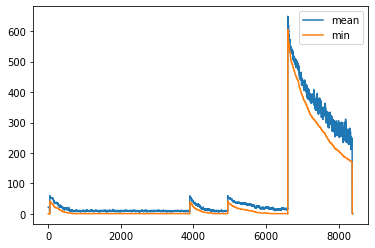

In [44]:
main_func(10, 20, 45, 35, 160, 50, 30, 40)

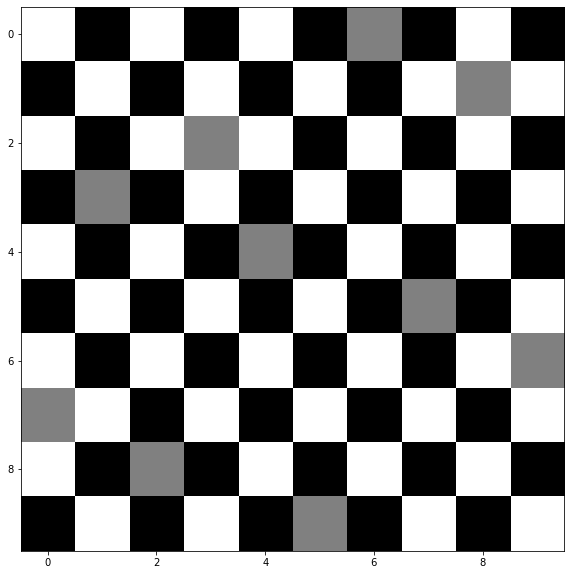

In [45]:
plot([7, 3, 8, 2, 4, 9, 0, 5, 1, 6])

### N=20

df :                                               society  fitnesses
0   (18, 9, 15, 10, 7, 2, 11, 8, 16, 5, 1, 6, 12, ...         15
1   (4, 10, 17, 16, 15, 3, 9, 2, 11, 18, 19, 8, 5,...         21
2   (12, 0, 6, 1, 16, 18, 17, 9, 7, 2, 13, 19, 15,...         11
3   (6, 13, 5, 15, 2, 19, 16, 17, 12, 8, 11, 18, 9...         13
4   (5, 18, 4, 10, 16, 7, 6, 8, 3, 9, 11, 0, 12, 1...         17
5   (15, 6, 5, 13, 2, 17, 19, 7, 3, 11, 0, 10, 14,...         14
6   (6, 2, 19, 3, 4, 18, 14, 11, 10, 9, 7, 16, 15,...         18
7   (13, 7, 18, 16, 15, 12, 14, 2, 4, 19, 1, 5, 6,...          9
8   (0, 6, 11, 1, 13, 7, 14, 16, 9, 3, 15, 2, 10, ...         16
9   (13, 18, 3, 16, 11, 6, 5, 0, 17, 15, 14, 1, 10...         11
10  (12, 0, 13, 4, 17, 11, 2, 16, 9, 1, 7, 19, 18,...         15
11  (5, 7, 12, 13, 6, 9, 19, 1, 18, 4, 2, 0, 14, 1...         12
12  (5, 11, 13, 9, 18, 15, 10, 0, 4, 14, 16, 8, 3,...         13
13  (0, 2, 15, 6, 5, 4, 14, 3, 16, 18, 19, 11, 8, ...         24
14  (10, 19, 1, 14, 

                                              society  fitnesses
8   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
7   [19, 15, 1, 9, 7, 2, 12, 18, 0, 16, 3, 13, 6, ...          5
0   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          5
4   [19, 15, 1, 9, 7, 2, 12, 18, 0, 16, 3, 13, 6, ...          5
6   [7, 15, 16, 12, 3, 0, 6, 4, 19, 1, 14, 9, 11, ...          6
9   [15, 19, 1, 9, 7, 2, 12, 18, 13, 16, 3, 0, 6, ...          6
1   [0, 6, 4, 19, 10, 14, 11, 8, 17, 9, 2, 5, 1, 1...          6
9   [9, 2, 5, 1, 16, 7, 12, 18, 13, 6, 15, 4, 19, ...          6
9   [10, 8, 17, 19, 12, 5, 2, 16, 1, 15, 7, 9, 14,...          6
10  [3, 0, 6, 4, 19, 10, 14, 11, 8, 17, 9, 2, 5, 1...          7
0   [4, 14, 11, 17, 12, 5, 2, 16, 1, 18, 9, 7, 3, ...          7
8   [4, 14, 11, 17, 12, 5, 2, 1, 16, 9, 7, 3, 10, ...          7
9   [8, 17, 5, 9, 7, 2, 1, 15, 6, 4, 19, 10, 12, 1...          8
1   [15, 19, 1, 9, 7, 2, 12, 18, 13, 16, 3, 0, 11,...          8
2   [18, 13, 6, 15, 17, 1

                                              society  fitnesses
8   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
6   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
4   [15, 19, 1, 9, 7, 2, 12, 14, 0, 16, 3, 13, 6, ...          4
10  [15, 1, 9, 7, 2, 12, 18, 17, 5, 0, 16, 3, 13, ...          4
8   [16, 13, 3, 6, 4, 14, 11, 17, 5, 1, 15, 19, 8,...          4
9   [15, 1, 9, 7, 12, 2, 18, 17, 5, 0, 16, 3, 13, ...          4
8   [19, 15, 1, 9, 13, 6, 4, 14, 11, 17, 5, 7, 2, ...          4
1   [19, 1, 9, 7, 2, 12, 14, 11, 16, 3, 13, 6, 4, ...          4
6   [15, 19, 1, 9, 7, 2, 12, 14, 0, 16, 3, 13, 6, ...          4
9   [15, 19, 0, 6, 4, 2, 12, 9, 7, 16, 14, 11, 17,...          7
8   [15, 6, 17, 12, 18, 0, 16, 3, 4, 5, 1, 9, 13, ...          9
7   [15, 19, 1, 9, 7, 2, 12, 14, 13, 6, 4, 18, 11,...          9
6   [19, 1, 9, 7, 2, 12, 14, 11, 16, 13, 6, 4, 18,...         11
2   [19, 1, 9, 7, 2, 12, 14, 0, 16, 3, 13, 6, 15, ...         13
4   [1, 9, 7, 12, 2, 17, 

                                              society  fitnesses
8   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
6   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
5   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
2   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
7   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
6   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
5   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
7   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
6   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
7   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
6   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
5   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
4   [15, 19, 0, 6, 4, 16, 11, 17, 5, 1, 9, 7, 2, 1...          3
2   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 3, 1...          4
10  [15, 19, 0, 6, 4, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
6   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
4   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
6   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
5   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
6   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
7   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
6   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
5   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
7   [15, 19, 0, 6, 4, 14, 11, 17, 5, 1, 9, 7, 2, 1...          3
4   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          5
0   [15, 19, 12, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, ...          5
2   [15, 19, 0, 9, 4, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 17, 11, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
1   [14, 19, 0, 9, 7, 15,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 3, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 13, 2, ...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 13,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 13, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 8, 1, 6, 4, 2, 1...          3
3   [15, 2, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 19, 1...          3
0   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 2, 4, 1...          3
0   [15, 2, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 17, 11, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [0, 9, 15, 19, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 13, 2, ...          2
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 14, 9, 7, 0, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 17, 11, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
4   [15, 19, 0, 6, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 16, 7, 14, 11, 17, 5, 1, 6, 4, 2, ...          3
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 5, 0, 9, 7, 14, 11, 15, 19, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 2, 4, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
4   [15, 19, 0, 9, 18, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [18, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 18, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, ...          3
3   [15, 19, 0, 9, 7, 14, 11, 2, 5, 1, 6, 4, 17, 1...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [3, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
0   [15, 13, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 13, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
1   [15, 19, 0, 9, 7, 2, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [9, 19, 0, 15, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 3, 4, 2, 1...          3
2   [15, 19, 0, 16, 7, 14, 11, 17, 5, 1, 6, 4, 2, ...          3
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
3   [15, 19, 0, 9, 7, 13, 11, 17, 5, 1, 6, 4, 2, 1...          3
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 2, 4, 1...          3
2   [15, 19, 0, 9, 3, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
1   [15, 19, 0, 9, 12, 14, 11, 17, 5, 1, 6, 4, 2, ...          4
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 18, 14, 11, 17, 5, 1, 6, 4, 2, ...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 10, 2, ...          3
2   [15, 19, 0, 7, 9, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
1   [15, 19, 0, 9, 12, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 17, 11, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 6, 4, 2, 12, 16, 3, 10, 18, 13, 19, 9, 0,...          2
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 17, 11, 5, 1, 6, 4, 2, 1...          2
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
1   [15, 19, 0, 9, 7, 14, 11, 17, 18, 1, 6, 4, 2, ...          4
6   [19, 0, 17, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [19, 15, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 2, 5, 1, 6, 4, 17, 1...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [17, 11, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [17, 19, 0, 2, 7, 14, 18, 15, 5, 1, 6, 4, 9, 1...          3
0   [17, 19, 0, 16, 7, 14, 11, 15, 5, 1, 6, 4, 2, ...          3
2   [15, 19, 0, 6, 7, 14, 11, 17, 5, 1, 9, 4, 2, 1...          4
1   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
3   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 8, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 18, ...          4
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 17, 14, 11, 7, 5, 1, 6, 4, 2, 1...          2
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
10  [0, 9, 15, 19, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [17, 19, 0, 9, 7, 14, 12, 15, 5, 1, 6, 4, 2, 1...          3
5   [19, 0, 9, 7, 17, 14, 11, 15, 5, 1, 6, 4, 2, 1...          3
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          4
1   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [9, 19, 0, 17, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 9, 0, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
4   [15, 19, 0, 9, 12, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [12, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [19, 17, 0, 9, 7, 14, 11, 16, 5, 1, 6, 4, 2, 1...          4
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
7   [15, 19, 0, 9, 7, 11,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          2
10  [1, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, 1...          2
1   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 0, 9, 7, 5, 11, 15, 14, 1, 6, 4, 2, 1...          4
2   [11, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 9, 0, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
1   [1, 19, 0, 9, 7, 14, 11, 15, 5, 17, 6, 4, 2, 1...          3
2   [17, 19, 0, 9, 7, 14, 1, 15, 5, 11, 6, 4, 2, 1...          3
9   [15, 19, 0, 1, 6, 4, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [11, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 10, 2, ...          4
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 2, 6, 4, 1, 1...          5
6   [11, 19, 0, 9, 7, 15, 16, 17, 5, 1, 6, 4, 2, 1...          5
4   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          6
9   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 13, 2, ...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 15, 9, 7, 14, 11, 0, 5, 1, 6, 4, 2, 1...          4
2   [19, 0, 9, 7, 17, 14, 11, 15, 5, 1, 8, 4, 2, 1...          5
3   [15, 19, 0, 9, 7, 10, 11, 17, 5, 1, 6, 4, 2, 1...          5
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          5
5   [19, 0, 9, 7, 14, 11,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 13, 2, ...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [19, 15, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [9, 19, 0, 17, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
3   [4, 0, 15, 9, 7, 14, 11, 17, 5, 1, 6, 19, 2, 1...          3
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 2, 4, 1...          3
4   [15, 19, 0, 9, 7, 5, 11, 17, 16, 1, 6, 4, 2, 1...          4
7   [0, 17, 13, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [9, 15, 0, 19, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 3, 1...          4
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 4, 6, 2, 1...          4
4   [17, 19, 0, 9, 7, 11,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [9, 15, 0, 19, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 10, 2, ...          3
7   [17, 9, 0, 19, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          4
0   [12, 19, 0, 9, 7, 11, 15, 16, 5, 1, 6, 4, 2, 1...          4
3   [9, 15, 0, 19, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          4
9   [17, 19, 0, 9, 7, 4, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [9, 15, 0, 19, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
10  [19, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 18, 17, 5, 1, 6, 4, 2, 1...          3
6   [19, 0, 15, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 13, 2, ...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [9, 15, 0, 19, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 0, 9, 19, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
5   [19, 0, 9, 7, 16, 11, 17, 15, 5, 1, 6, 4, 2, 1...          3
3   [17, 13, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          3
4   [9, 15, 0, 19, 7, 16, 11, 14, 5, 1, 6, 4, 2, 1...          4
0   [15, 9, 0, 19, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 13, 2, ...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [19, 15, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
3   [17, 19, 0, 9, 7, 14, 4, 15, 5, 1, 6, 11, 2, 1...          3
4   [15, 19, 0, 10, 7, 16, 11, 17, 5, 1, 6, 4, 2, ...          4
1   [15, 19, 0, 9, 1, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
4   [12, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [9, 19, 0, 17, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          4
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 12, ...          3
4   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          3
2   [17, 19, 0, 9, 7, 13,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
8   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 1, 9, 7, 14, 11, 17, 5, 0, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
8   [19, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
0   [17, 6, 0, 9, 7, 14, 11, 15, 5, 1, 19, 4, 2, 1...          3
3   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
3   [15, 19, 4, 9, 7, 14, 11, 17, 5, 1, 6, 0, 2, 1...          3
4   [15, 7, 0, 9, 19, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          3
3   [17, 19, 0, 13, 7, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [19, 15, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [17, 19, 0, 9, 7, 14, 11, 15, 5, 16, 6, 4, 2, ...          3
3   [17, 19, 0, 13, 7, 14, 11, 15, 5, 1, 6, 4, 2, ...          3
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [19, 0, 15, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 10, 2, ...          3
0   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 2, 4, 1...          4
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          3
4   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 1, 9, 7, 14, 11, 15, 5, 0, 6, 4, 2, 1...          2
0   [17, 19, 0, 9, 4, 14, 11, 15, 5, 1, 6, 7, 2, 1...          3
3   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 6, 7, 14, 11, 17, 5, 1, 9, 4, 2, 1...          4
2   [17, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
0   [15, 19, 0, 5, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 2, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 19, 1...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 3, 4, 2, 1...          3
2   [15, 11, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 13, 7, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 10, 18, 13...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 3, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 11, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 13, 2, ...          2
8   [15, 19, 0, 9, 7, 4, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 2, 7, 14, 11, 17, 5, 1, 6, 4, 9, 1...          3
2   [15, 19, 0, 10, 7, 14, 11, 17, 5, 1, 6, 4, 2, ...          4
10  [1, 6, 4, 2, 12, 16, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
2   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 2, 7, 14, 11, 17, 5, 1, 6, 4, 9, 1...          3
8   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 5, 0, 9, 7, 14, 11, 17, 19, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 8, 1, 6, 4, 2, 1...          3
2   [15, 13, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 5, 0, 9, 7, 14, 11, 17, 19, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 17, 14, 11, 7, 5, 1, 6, 4, 2, 1...          2
2   [15, 19, 0, 9, 3, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
1   [15, 19, 0, 16, 7, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          4
0   [18, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
2   [8, 19, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 1, 9, 7, 14, 11, 17, 5, 0, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
8   [15, 9, 7, 19, 0, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [0, 9, 15, 19, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 13, 2, ...          2
10  [15, 19, 0, 7, 9, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
8   [9, 7, 14, 1, 6, 4, 19, 15, 16, 3, 10, 18, 5, ...          4
0   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [8, 19, 6, 9, 7, 14, 11, 17, 5, 1, 13, 4, 2, 1...          3
4   [8, 19, 0, 9, 1, 14, 11, 17, 5, 7, 6, 4, 2, 12...          4
2   [15, 19, 0, 9, 7, 2, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [9, 19, 0, 15, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 6, 5, 1, 17, 4, 2, 1...          4
10  [8, 18, 0, 9, 7, 14, 11, 17, 5, 19, 6, 4, 2, 1...          4
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 12, 4, 2, ...          4
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 17, 11, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 2, 5, 1, 6, 4, 17, 1...          3
3   [1, 19, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [3, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          2
3   [8, 19, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 18, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, ...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14, 11, 17, 12, 1, 6, 4, 2, ...          4
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 10, 5, 1, 6, 4, 2, 1...          4
0   [15, 19, 0, 9, 7, 14, 11, 6, 5, 1, 17, 4, 2, 1...          4
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 16, 2, ...          4
3   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 10, 2, ...          3
2   [15, 19, 14, 9, 7, 0, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
3   [15, 19, 17, 9, 7, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
2   [15, 19, 14, 9, 7, 0, 11, 17, 5, 1, 6, 4, 2, 1...          3
9   [15, 19, 0, 9, 7, 3, 11, 17, 5, 1, 16, 4, 2, 1...          4
1   [15, 16, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 8, 17, 5, 1, 6, 4, 2, 12...          3
8   [15, 19, 0, 9, 7, 16, 17, 11, 5, 1, 6, 4, 2, 1...          3
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 14, 9, 7, 0, 11, 17, 5, 1, 6, 4, 2, 1...          3
1   [15, 19, 14, 9, 7, 0,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
4   [15, 19, 0, 9, 18, 14, 11, 17, 5, 1, 6, 4, 2, ...          3
1   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 4, 17, 5, 1, 6, 11, 2, 1...          2
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
10  [1, 19, 0, 9, 7, 16, 4, 2, 12, 14, 3, 11, 17, ...          6
7   [19, 0, 9, 7, 16, 11,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 2, 5, 1, 6, 4, 17, 1...          3
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [14, 19, 0, 9, 7, 15, 11, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 16, 5, 1, 6, 4, 2, 1...          4
1   [15, 19, 0, 6, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 14, 9, 7, 0, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
7   [15, 19, 0, 9, 7, 11, 17, 16, 5, 1, 6, 4, 2, 1...          4
4   [15, 19, 0, 9, 7, 11,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 2, 5, 1, 6, 4, 17, 1...          3
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
1   [1, 19, 0, 9, 7, 14, 11, 17, 5, 15, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
7   [0, 9, 15, 19, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
3   [15, 19, 0, 9, 17, 14, 11, 7, 5, 1, 6, 4, 2, 1...          2
0   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, ...          2
9   [1, 17, 0, 9, 7, 14, 11, 15, 5, 13, 6, 4, 2, 1...          3
1   [1, 19, 0, 9, 7, 14, 11, 17, 5, 15, 6, 4, 2, 1...          3
2   [3, 0, 9, 15, 1, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [17, 19, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 7, 0, 9, 19, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 0, 9, 7, 14, 11, 17, 5, 1, 6, 19, 2, 12, ...          3
4   [15, 16, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
0   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
3   [3, 17, 0, 9, 7, 14, 18, 15, 5, 1, 6, 4, 2, 12...          2
10  [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 2, 4, 12...          4
2   [15, 19, 0, 9, 12, 14

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
0   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [12, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [15, 13, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
1   [8, 19, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [18, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 1...          1
6   [3, 17, 0, 9, 7, 14, 11, 15, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          2
1   [15, 5, 0, 9, 7, 14, 11, 17, 19, 1, 6, 4, 2, 1...          2
2   [3, 17, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 5, 11, 17, 14, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 1, 5, 6, 4, 2, 1...          4
4   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [19, 15, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
10  [0, 9, 15, 19, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
3   [15, 19, 0, 9, 4, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
3   [15, 19, 0, 9, 7, 14, 11, 2, 5, 1, 6, 4, 17, 1...          3
4   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 18, ...          2
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 18, ...          2
0   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          2
2   [4, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 15, 2, 1...          2
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
4   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
8   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 12, 14, 3,...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
8   [15, 19, 0, 9, 7, 18, 11, 17, 5, 1, 6, 14, 2, ...          2
1   [15, 19, 0, 9, 4, 14, 11, 17, 5, 1, 6, 7, 2, 1...          2
3   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 2, 4, 1...          3
4   [15, 0, 19, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
10  [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 18, 4, 2, ...          3
1   [15, 13, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 14, 6, 4, 2, ...          4
2   [15, 19, 0, 9, 7, 11,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 16, 18, 17, 5, 1, 6, 4, 2, 1...          4
0   [15, 19, 0, 9, 8, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
1   [15, 19, 0, 5, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
3   [15, 19, 0, 9, 7, 16, 11, 17, 5, 13, 6, 4, 2, ...          1
4   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          4
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 8, 4, 2, 1...          4
1   [15, 19, 0, 9, 8, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [15, 19, 0, 9, 7, 16, 1, 17, 5, 11, 6, 4, 2, 1...          3
2   [18, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          3
3   [15, 19, 0, 9, 7, 5, 11, 17, 14, 1, 6, 4, 2, 1...          3
4   [15, 6, 0, 9, 7, 14, 

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [1, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
4   [15, 19, 0, 9, 7, 14, 18, 17, 5, 1, 6, 4, 2, 1...          3
0   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          3
2   [15, 19, 0, 9, 7, 14,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [1, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          2
0   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 3, 12...          3
1   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [1, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 18, 4, 2, ...          2
4   [1, 19, 17, 9, 7, 14, 11, 0, 5, 13, 6, 4, 2, 1...          2
8   [1, 19, 9, 14, 0, 7, 11, 17, 5, 13, 6, 4, 2, 1...          3
1   [15, 19, 0, 9, 7, 16,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
7   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [1, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
0   [15, 19, 0, 9, 7, 16, 11, 17, 5, 10, 6, 4, 2, ...          3
3   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
1   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          4
8   [9, 7, 16, 15, 19, 0,

                                              society  fitnesses
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [1, 19, 13, 9, 7, 14, 11, 17, 5, 0, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
1   [8, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 12...          1
0   [1, 19, 13, 9, 7, 14, 11, 17, 5, 0, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
10  [1, 19, 0, 9, 7, 14, 11, 17, 5, 13, 6, 4, 2, 1...          1
9   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
7   [15, 19, 0, 9, 7, 16, 11, 17, 5, 1, 6, 4, 2, 1...          1
6   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
5   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 4, 2, 1...          1
2   [15, 19, 0, 9, 7, 14, 11, 17, 5, 1, 6, 2, 4, 1...          3
8   [9, 7, 16, 15, 19, 0, 11, 17, 5, 1, 6, 4, 2, 1...          4
0   [15, 19, 0, 9, 7, 14,

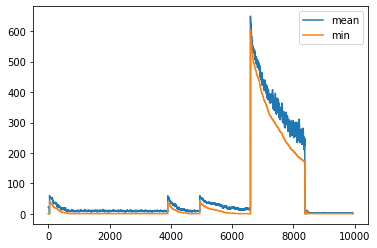

In [47]:
main_func(20, 20, 45, 35, 160, 50, 30, 40)

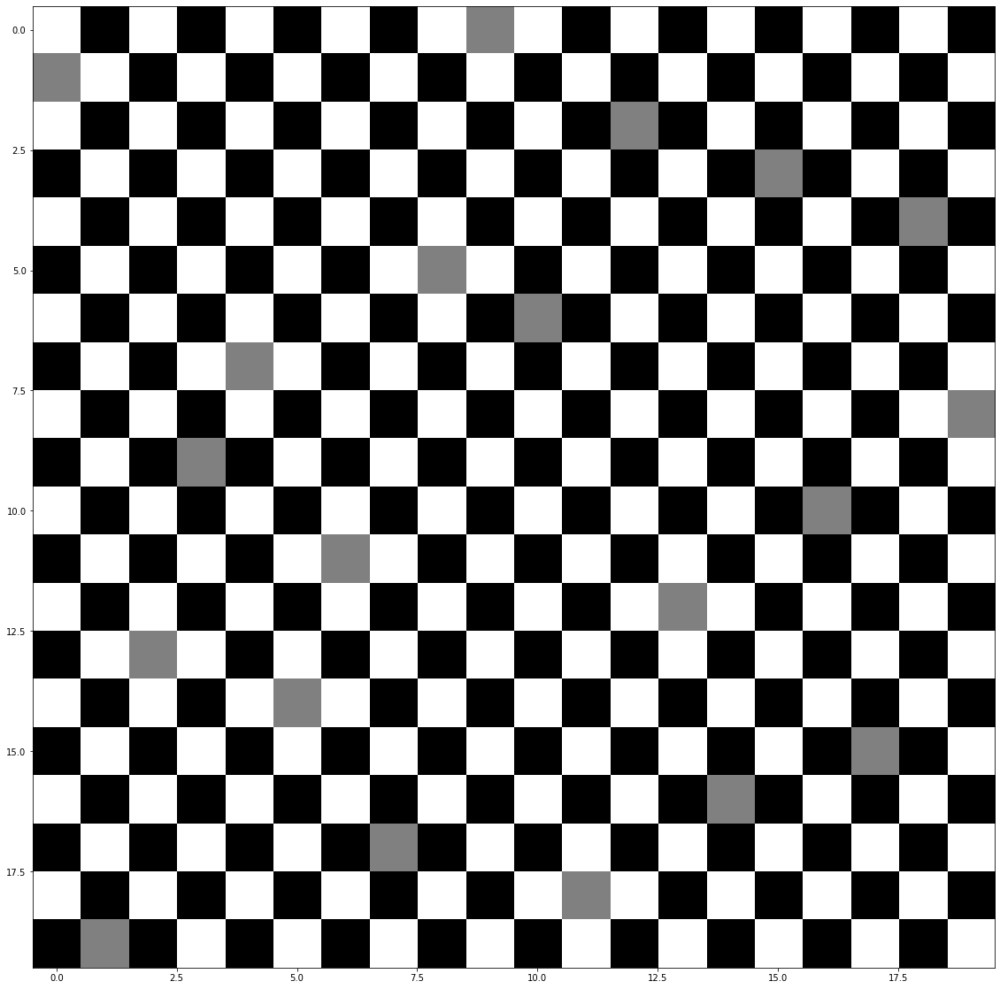

In [48]:
plot([1, 19, 13, 9, 7, 14, 11, 17, 5, 0, 6, 18, 2, 12, 16, 3, 10, 15, 4, 8])